<a href="https://colab.research.google.com/github/felipemunarol/Statistic/blob/main/modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install geopandas
! pip install geodatasets
! pip install geoplot

In [ ]:
import csv
import pandas as pd
import numpy as np
import geopandas
from geodatasets import get_path
import os

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import r2_score

from plotly import express as px
import datetime
from matplotlib import pyplot as plt
import pathlib
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/brazil-states.geojson') as response:
    counties = json.load(response)

pd.set_option('display.max_columns', None)

# Conecta o serviço com o Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the utilities sets
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_ENERGISA_SERGIPE.json", 'r') as f:
  test_set_json = json.load(f)
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_LIGHT.json", 'r') as f:
  test_set_json_light = json.load(f)
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_CEMIG.json", 'r') as f:
  test_set_json_cemig = json.load(f)
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_COPEL.json", 'r') as f:
  test_set_json_copel = json.load(f)
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_CPFL.json", 'r') as f:
  test_set_json_cpfl = json.load(f)

os.environ['ROOT'] = '/content/drive/MyDrive/Mestrado/Ordens_servico/'
base_path = os.environ.get("ROOT")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Raiz
! ls "${ROOT}/Ordens_servico/"

 AHE_DOWN_LayerToKML.kml
 AHE_DOWN_LayerToKML.kmz
 AHE_DOWN_LayerToKMLSHP.zip
 base_2020.xlsx
 base_2021.xlsx
 base_2022.xlsx
 base_ENERGISA_SERGIPE_2021.xlsx
 base_ENERGISA_SERGIPE_2022.xlsx
 Base_MUNIC_2021.xlsx
 base.xlsx
 Caracteristica_entrada_modelo_regressao.xlsx
 cluster_grps.csv
 CONJUNTOS_CEMIG.json
 CONJUNTOS_COPEL.json
 CONJUNTOS_CPFL.json
 CONJUNTOS_ENERGISA_SERGIPE.json
 CONJUNTOS_ENERGISA_SERGIPE_{}.json
 CONJUNTOS_LIGHT.json
 coordenadas_municipios_ibge.xls
'Cópia de feat_imp_linear_model_2023_06_23_21 - 23 de junho, 18:17'
'Cópia de feat_imp_linear_model_2023_06_23_21 - 23 de junho, 18:29'
 Dados
 de_para_und_cons.csv
 de_para_und_cons_.csv
 de_para_und_cons_.json
 de_para_und_cons_mun.json
 de_para_und_cons_unit_med_.geojson
 de_para_und_cons_unit_med_.json
 de_para_und_cons_unit_med_mun.json
 de_para_und_cons_unit_med_mun_veg.json
 de_para_und_cons_unit_med_mun_veg_t_cover.json
 diagramas
 feat_imp_linear_model_2023_06_04_23.xlsx
 feat_imp_linear_model_2023_06_19_0

In [ ]:
dir_path = pathlib.Path(base_path)

In [ ]:
label = "FLAG_INTERRUPCOES"
# Log transmed label variable
# label = "FLAG_INTERRUPCOES_lognorm"

# cols = [
#        'LONGITUDE', 'LATITUDE', "AREA_KM2", "MUN_LENGTH",
#         "MUN_MINIMUM_BOUND_RADIO",
#         # "MUN_NUMBER_OF_BOUNDARYS", # Number of bounderies need a adjust to represent all municipios
#         'Pop estimada 2021',
#        'Faixa_pop', 'Região Metropolitana', 'Nome da Grande Região',
#        'Nome da Mesorregião', 'Nome da Microrregião',
#        'Nome da Região Geográfica Imediata',
#        'Município da Região Geográfica Imediata',
#        'Nome da Região Geográfica Intermediária',
#        'Município da Região Geográfica Intermediária',
#        # 'Nome Concentração Urbana', Retirado por parecer ter muitas classificacoes
#         'Tipo Concentração Urbana',
#        # 'Nome Arranjo Populacional', Retirado por parecer ter muitas classificacoes
#         'Hierarquia Urbana',
#        'Hierarquia Urbana (principais categorias)', 'Nome da Região Rural',
#        'Região rural (segundo classificação do núcleo)', 'Amazônia Legal',
#        'Semiárido',
#         'Cidade-Região de São Paulo',
#       #  'Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)',
#       #  'Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)',
#        'Produto Interno Bruto, \na preços correntes\n(R$ 1.000)',
#       #  'Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)',
#        'FLAG_LIT',
#        'MAX_TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)',
#        'MAX_TEMPERATURA DO PONTO DE ORVALHO (°C)',
#        # 'MAX_UMIDADE RELATIVA DO AR, HORARIA (%)', Retirado por conter muitos registros nulos
#        'MAX_VENTO, DIREÇÃO HORARIA (gr) (° (gr))',
#        'MAX_VENTO, RAJADA MAXIMA (m/s)', 'MAX_VENTO, VELOCIDADE HORARIA (m/s)',
#        'MAX_PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 'MAX_RADIACAO GLOBAL (Kj/m²)',
#        'MED_TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)',
#        'MED_TEMPERATURA DO PONTO DE ORVALHO (°C)',
#        # 'MED_UMIDADE RELATIVA DO AR, HORARIA (%)', Retirado por conter muitos registros nulos
#        'MED_VENTO, DIREÇÃO HORARIA (gr) (° (gr))',
#        'MED_VENTO, RAJADA MAXIMA (m/s)', 'MED_VENTO, VELOCIDADE HORARIA (m/s)',
#        'MED_PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 'MED_RADIACAO GLOBAL (Kj/m²)',
#        'TOTAL_PRECIPITAÇÃO TOTAL, HORÁRIO (mm)',
#        'TOTAL_RADIACAO GLOBAL (Kj/m²)',
#        'FLAG_INTERRUPCOES']

cols = [
       "mes",
       'MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)',
       'TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)',
       'MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)',
       'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
       'MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)',
       'MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
       'MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)',
       'UF',
       #  'Pop estimada 2021', # Retirada por teste somente com variaveis meteorologicas
       #  'Faixa_pop',  # Retirada por teste somente com variaveis meteorologicas
       #'Região Metropolitana',   Retirado por parecer ter muitas classificacoes
       #  'Regiao', # Retirada por teste somente com variaveis meteorologicas
      # 'Nome da Grande Região', Retirado por parecer ter muitas classificacoes
      #  'Nome da Mesorregião',
       # 'Nome da Microrregião',  Retirado por parecer ter muitas classificacoes
      #  'Nome da Região Geográfica Imediata',  # Retirado por parecer ter muitas classificacoes
      #  'Município da Região Geográfica Imediata', # Retirado por parecer ter muitas classificacoes
      #  'Nome da Região Geográfica Intermediária', # Retirado por parecer ter muitas classificacoes
      #  'Município da Região Geográfica Intermediária',  # Retirado por parecer ter muitas classificacoes
       # 'Nome Concentração Urbana',  Retirado por parecer ter muitas classificacoes
      #  'Tipo Concentração Urbana',
       # 'Nome Arranjo Populacional', Retirado por parecer ter muitas classificacoes
      #  'Hierarquia Urbana', Retirado por parecer ter muitas classificacoes
      #  'Hierarquia Urbana (principais categorias)',
       # 'Nome da Região Rural',  Retirado por parecer ter muitas classificacoes
      #  'Região rural (segundo classificação do núcleo)',  Retirado por parecer ter muitas classificacoes
       'Amazônia Legal',
       'Semiárido',
      #  'Cidade-Região de São Paulo',  # Funcao de one-hot-encoding tendo pico de memoria com essa caracteristica
      #  'Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)',
      #  'Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)',
      #  'Produto Interno Bruto, \na preços correntes\n(R$ 1.000)',
      #  'Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)',
       'FLAG_LIT',
       'MUN_MINIMUM_BOUND_RADIO',
       'AREA',
      #  'MUN_NUMBER_OF_BOUNDARYS', Retirada por contar multi tipos de caracteristicas (eg. ste (multipoligono) e float)
       'NUMERO_CONSUMIDORES_DO_CONJUNTO',
       'FLAG_INTERRUPCOES',
       'veg_class',
       "labels",
       "percent_tree_cover"
]

# index = ["NOME_MUNICIPIO",
#          "mes",
#          "year_month",
#          "UF",
#          "GEOCODIGO_MUNICIPIO",
#          "NUMERO_UNIDADES_CONSUMIDORAS",
#         ]

index = ["year_month",
         "DscConjUndConsumidoras",
        ]

In [ ]:
def treat_outliers(df):
  # Create a year index
  df["year_month"] = (df["year"]*100 + df["mes"] ).astype('str')
  # inter_quantile = df.FLAG_INTERRUPCOES.quantile(0.5) - df.FLAG_INTERRUPCOES.quantile(0.25)
  # lim_hig = df.FLAG_INTERRUPCOES.quantile(0.75) + inter_quantile * 1.5
  # lim_bot = df.FLAG_INTERRUPCOES.quantile(0.25) - inter_quantile * 1.5
  # Retira casos com baixa quantidade de interrupcoes.
  lim_low_int = df.FLAG_INTERRUPCOES.quantile(0.1)

  print("quantidade registros extremos retirados")
  # outliers = (df.FLAG_INTERRUPCOES < lim_bot) | (df.FLAG_INTERRUPCOES > lim_hig) | (df.FLAG_INTERRUPCOES < lim_low_int)
  outliers = (df.FLAG_INTERRUPCOES < lim_low_int)
  df[outliers].shape[0]

  df = df[~outliers]
  return df

def fill_null(df):
  df.loc[df["Região Metropolitana"].isnull(), "Região Metropolitana"] = "Região Não Metropolitana"
  df.loc[df["Tipo Concentração Urbana"].isnull(), "Tipo Concentração Urbana"] = "Sem Classificacao"
  return df

def add_clusters_info(df):

  clusters_grps = pd.read_csv(base_path + "Ordens_servico/cluster_grps.csv")
  # Transform the clusters labels to string, the model receive it as a categorical data
  clusters_grps["labels"] = clusters_grps["labels"].astype("str")
  df = df.merge(clusters_grps, left_on="DscConjUndConsumidoras", right_on="DscConjuntoUnidadeConsumidora", how="left")
  return df

def select_features(df, index, cols):
  df = df.set_index(index)[cols]
  return df

# Verificar se por algum motivo o conjunto de dados esta contendo index repetidos
def drop_duplic(df):
  df = df.reset_index().drop_duplicates(df.index.names).set_index(df.index.names)
  return df

# Teste - Passa o mes para variavel categorica
def transform_month(df):
  df["mes"] = df["mes"].astype('str')
  return df

def one_hot_econding(df):
  # Input–Output Mapping (Haykin, 1999) das variaveis categoricas
  # Survey on categorical data for neural networks
  # https://brendanhasz.github.io/2019/03/04/target-encoding

  # Encode all categorical cols by default
  cat_cols = df.select_dtypes(include=['object']).columns

  for ind, col in enumerate(cat_cols):
    print(ind)
    print(col)
    temp_df = pd.get_dummies(df[col], drop_first=True, prefix=col)
    if ind == 0:
      one_hot_encoding_df = temp_df
    else:
      one_hot_encoding_df = one_hot_encoding_df.join(temp_df)

  # Une o conjunto com colunas numericas com o conjunto que foi criado co colunas categoricas processadas
  numeric_cols = df.select_dtypes(include=['number']).columns

  df = df[numeric_cols].join(one_hot_encoding_df)

  # def TargetEncoderLOO(df):

  return df

# Completa os dados nulos utilizando as medias, como para o exemplo selecionado sao poucos dados parece fazer sentido o tratamento
def fill_null_mean_tratment(df):
  numeric_cols = df.select_dtypes(include=['number']).columns
  integer_null_cols_dict = df[numeric_cols].isnull().any(axis=0).to_dict()
  for col, value in integer_null_cols_dict.items():
    if value == True:
      df.loc[df[col].isnull(), col] = df[col].mean()

  return df

# Ordena os indexs para realizar o lag
def time_shift(df):
  df = df.reset_index()

  df["mes"] = df.year_month.astype('str').str[4 :].astype('int')
  df["year"] = df.year_month.astype('str').str[0: 4].astype('int')

  df = df.sort_values(['year', 'mes'])
  # Periodo anterior
  df["FLAG_INTERRUPCOES_SET_LAST_YEAR"] = df.groupby(["mes", "DscConjUndConsumidoras"])["FLAG_INTERRUPCOES"].shift(1)
  # Periodo de 2 meses anteriores
  # Test drop shift 2
  # df["FLAG_INTERRUPCOE_SHIFT_2"] = df.groupby(["mes", "DscConjUndConsumidoras"])["FLAG_INTERRUPCOES"].shift(1)

  # Order values by month to check
  df = df.sort_values(['mes'])
  df = df.drop(columns = 'year')
  df = df.drop(columns = 'mes')

  df = df.set_index(["year_month",	"DscConjUndConsumidoras"])

  return df

def year_seasons(df):
  # Estacao do ano. Inclui a estacao do ano. As estacoes comecam no meio do mes, dessa forma em agregacao diaria eh possivel incluir essa consideracao. porem
  # em agregacao foi considerado a estacao no mes e, que a maior quantidade de dias esteve presente.
  df["VERAO"] = np.where(
      df.index.get_level_values(0).str[4:].astype(int).isin([1, 2, 3]),
      1,
      0
  )

  df["OUTONO"] = np.where(
      df.index.get_level_values(0).str[4:].astype(int).isin([4, 5, 6]),
      1,
      0
  )

  df["INVERNO"] = np.where(
      df.index.get_level_values(0).str[4:].astype(int).isin([7, 8, 9]),
      1,
      0
  )


  df["PRIMAVERA"] = np.where(
      df.index.get_level_values(0).str[4:].astype(int).isin([10, 11, 12]),
      1,
      0
  )
  return df


def norm_data(df):
  # Realiza a normalizacao dos dados para as colunas numericas - Para o modelo eh necessario normalizar (colocar as variaveis entre 0 e 1) porque pode ser que uma classe tenha
  # mais impacto que outra
  # O tratamento eh aplicado para todo o conjunto porque todo o conjunto ja eh numerico
  from sklearn.preprocessing import MinMaxScaler
  scaler = MinMaxScaler()

  features = [col for col in df.columns if col != label]

  # Scale only the features because the scale of the output dont impact the convergence
  scaler.fit(df[features])
  df[features] = scaler.transform(df[features])
  return df


# Modeling

Modeling is the part where is construct the agorithm to model the process. And is checked the fit.

In [ ]:
# Leitura do conjunto de dados para o modelo
data_paths = list(dir_path.glob("Ordens_servico/base_2*"))

df = pd.concat([pd.read_excel(path) for path in data_paths])

In [ ]:
df

,Unnamed: 0,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover
0,0,2021,ABAETETUBA I,1,49.2,1009.025000,24.070833,34.3,27.650000,24.6,90.291667,77.0,12.9,1.316667,13.592308,1007.455864,23.356173,32.944444,26.510031,23.596429,84.060185,55.333333,8.140000,0.688426,353.4,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35348.0,14755,278,56.898305
1,1,2021,ABAETETUBA I,2,74.6,1010.075000,24.058333,34.5,28.158333,24.8,94.250000,83.0,11.7,0.900000,22.635714,1007.926637,23.476935,31.592857,25.956696,23.410714,87.183036,60.571429,7.921429,0.551488,633.8,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35730.0,52755,602,56.898305
2,2,2021,ABAETETUBA I,5,92.0,1010.612500,24.495833,34.7,28.441667,24.8,98.041667,79.0,13.9,1.254167,16.064516,1009.366532,23.997850,32.570968,26.678226,23.696774,86.889785,56.483871,7.432258,0.700806,498.0,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentraçã

## 1 - Analise descritiva

In [ ]:
# Total of outages
df.FLAG_INTERRUPCOES.sum()

22886945

In [ ]:
df[df.UF == "SE"].DscConjUndConsumidoras.unique()

array(['ARACAJU', 'ARAUÁ', 'ATALAIA', 'CABRITA', 'CAJAÍBA', 'CARMÓPOLIS',
       'CARRAPICHO', 'CONTORNO', 'CONVENTO', 'ESTÂNCIA', 'FREI PAULO',
       'GRACCHO CARDOSO', 'GRAGERU', 'ITABAIANINHA', 'LAGARTO', 'MARUIM',
       'MOITA BONITA', 'MONTE ALEGRE', 'NOSSA SENHORA DA GLÓRIA',
       'NOSSA SENHORA DAS DORES', 'PORTO', 'PORTO DA FOLHA', 'POÇO VERDE',
       'PROPRIÁ', 'RIACHUELO', 'SALGADO', 'SAQUINHO', 'SERIGY',
       'SIMÃO DIAS', 'SÃO CRISTOVÃO', 'TAIÇOCA', 'URUBU'], dtype=object)

In [ ]:
# In some cases, the result of service orders was coming null (this is a check)
df[df.FLAG_INTERRUPCOES.isnull()]

,Unnamed: 0,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover


In [ ]:
# Amount Units
df.DscConjUndConsumidoras.unique().shape[0]

2871

In [ ]:
# Median and Interruptions - its checked the median, mean std and quantile of the distribuition
print(df.FLAG_INTERRUPCOES.describe())

count    101092.000000
mean        226.397193
std         219.689587
min           1.000000
25%          94.000000
50%         165.000000
75%         288.000000
max        3489.000000
Name: FLAG_INTERRUPCOES, dtype: float64


<Axes: xlabel='Quantidade de interrupções', ylabel='Volume de Ocorrência'>

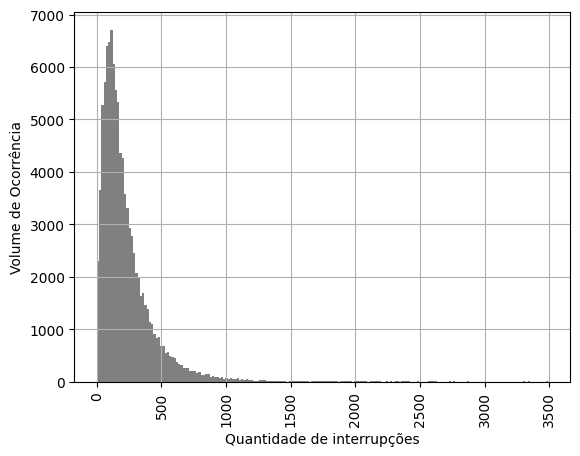

In [ ]:
# Histogram of the values
fig, ax = plt.subplots()

ax.tick_params(axis='x', labelrotation = 90)
ax.set_ylabel('Volume de Ocorrência')
ax.set_xlabel('Quantidade de interrupções')
df.FLAG_INTERRUPCOES.hist(bins=200, color='gray')

count    6435.000000
mean      145.245066
std        85.277619
min         6.000000
25%        88.000000
50%       126.000000
75%       181.000000
max       812.000000
Name: FLAG_INTERRUPCOES, dtype: float64


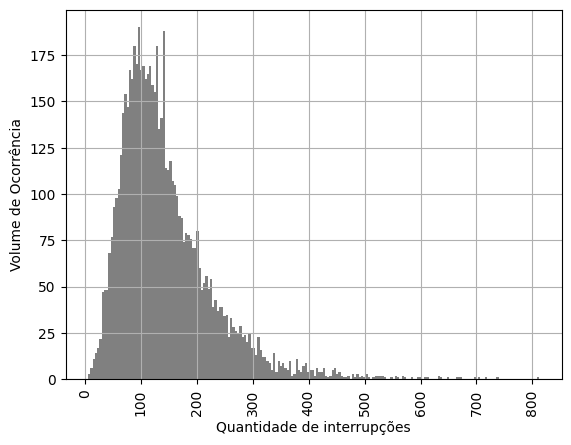

In [ ]:
# Note 1. Due to the high error of CPFL, check the dispertion only for this utility

cpfl_df = df[df.DscConjUndConsumidoras.isin(test_set_json_cpfl['conjuntos'])]

# Histogram of the values
fig, ax = plt.subplots()

ax.tick_params(axis='x', labelrotation = 90)
ax.set_ylabel('Volume de Ocorrência')
ax.set_xlabel('Quantidade de interrupções')
cpfl_df.FLAG_INTERRUPCOES.hist(bins=200, color='gray')

# Median and Interruptions - its checked the median, mean std and quantile of the distribuition
print(cpfl_df.FLAG_INTERRUPCOES.describe())

In [ ]:
# Amount Units per State
df_uf_unit_cons_count = pd.DataFrame(df.groupby("UF")["DscConjUndConsumidoras"].count().sort_values(ascending=False)).rename(columns={"DscConjUndConsumidoras": "quantidade_un_cons"})
df_uf_unit_cons_count["total"] = df_uf_unit_cons_count.quantidade_un_cons.sum()
# df_uf_unit_cons_count["percentage"] = df_uf_unit_cons_count
df_uf_unit_cons_count["percentage"] = (df_uf_unit_cons_count["quantidade_un_cons"] / df_uf_unit_cons_count["total"])*100
df_uf_unit_cons_count

,quantidade_un_cons,total,percentage
UF,,,
SP,19813,100216,19.770296
MG,12094,100216,12.067933
BA,6870,100216,6.855193
RJ,6453,100216,6.439092
GO,5544,100216,5.532051
RS,5254,100216,5.242676
PR,5227,100216,5.215734
SC,4428,100216,4.418456
PA,4335,100216,4.325657


In [ ]:
print(df.FLAG_INTERRUPCOES.kurtosis())

26.276677581640694


In [ ]:
df.DscConjUndConsumidoras.unique()[0:6]

array(['ABAETETUBA I', 'ABAETETUBA II', 'ACAILANDIA', 'ACARAPE', 'ACARAÚ',
       'ACARI'], dtype=object)

In [ ]:
# Order by year_month
df = df.sort_values(by="year_month")

Conuntos plotados ['Liberdade' 'Mangueiral' 'IGUATEMI' 'São Francisco' 'IACIARA S1'
 'Pontinha' 'SÃO FELIX II' 'Guararapes 1' 'LUCENA' 'NÚCLEO BANDEIRANTE'
 'ARROIO GRANDE' 'SÃO FELIX I' 'QUELUZ' 'Canoas 1']


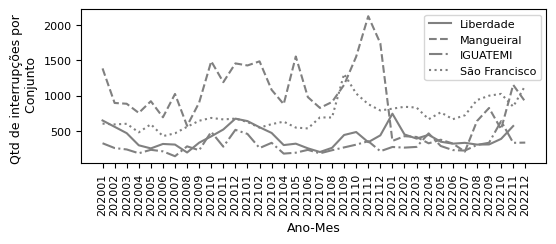

In [ ]:
# Time serie of the values with the examples
conjs = df.DscConjUndConsumidoras.unique()[250:264]
fig, ax = plt.subplots(figsize=(6,2))
ax.tick_params(axis='x', labelrotation = 90)
ax.set_ylabel('Qtd de interrupções por \n Conjunto', fontsize =9)
ax.set_xlabel('Ano-Mes', fontsize = 9)
ax.xaxis.set_tick_params(labelsize=8)
ax.yaxis.set_tick_params(labelsize=8)

print('Conuntos plotados', conjs)

ax.plot(df[df.DscConjUndConsumidoras == conjs[0]]["year_month"], df[df.DscConjUndConsumidoras == conjs[0]]["FLAG_INTERRUPCOES"], color='grey')
ax.plot(df[df.DscConjUndConsumidoras == conjs[1]]["year_month"], df[df.DscConjUndConsumidoras == conjs[1]]["FLAG_INTERRUPCOES"], color='grey', linestyle='dashed')
ax.plot(df[df.DscConjUndConsumidoras == conjs[2]]["year_month"], df[df.DscConjUndConsumidoras == conjs[2]]["FLAG_INTERRUPCOES"], color='grey', linestyle='dashdot')
ax.plot(df[df.DscConjUndConsumidoras == conjs[3]]["year_month"], df[df.DscConjUndConsumidoras == conjs[3]]["FLAG_INTERRUPCOES"], color='grey', linestyle='dotted')


ax.legend(conjs, fontsize =8)

In [ ]:
# Teste t de student
mean = df['FLAG_INTERRUPCOES'].mean()

means = []

for i in range(1000):
  means.append(df['FLAG_INTERRUPCOES'].sample(50).mean())

<Axes: >

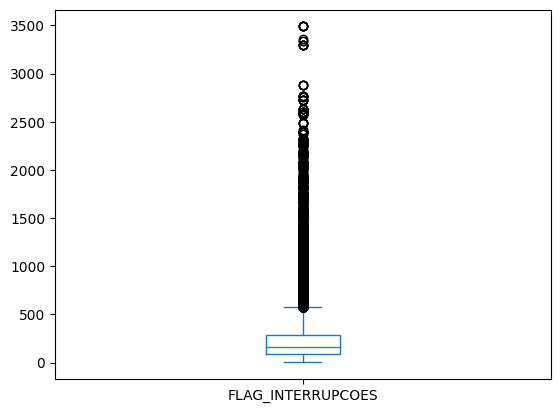

In [ ]:
# Muitas regioes apresentam quantidades altas de Interrupcoes
df.FLAG_INTERRUPCOES.plot.box()

<Axes: >

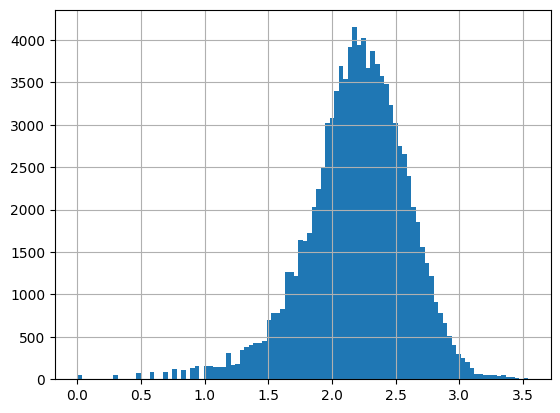

In [ ]:
# Log transform cause the serie have long tail
# https://www.itl.nist.gov/div898/handbook/eda/section3/eda33e6.htm
df['FLAG_INTERRUPCOES_lognorm'] = np.log10(df['FLAG_INTERRUPCOES'])
df['FLAG_INTERRUPCOES_lognorm'].hist(bins=100)

In [ ]:
# Check the quantity of sets que estao sendo considerados para o modelo (ou seja apresentam as informacoes coletadas)
len(df.DscConjUndConsumidoras.unique())

2871

In [ ]:
# Check if the time serie have some tendency that can be

<ipython-input-29-2f15931dec10>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(7, 5))


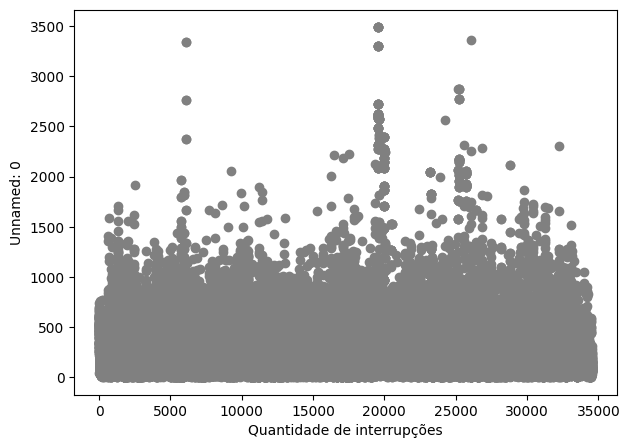

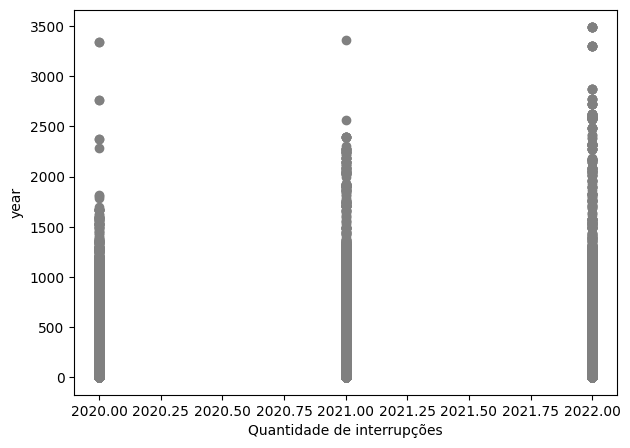

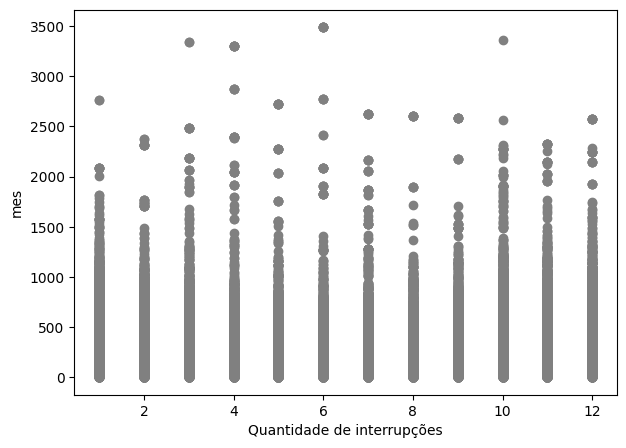

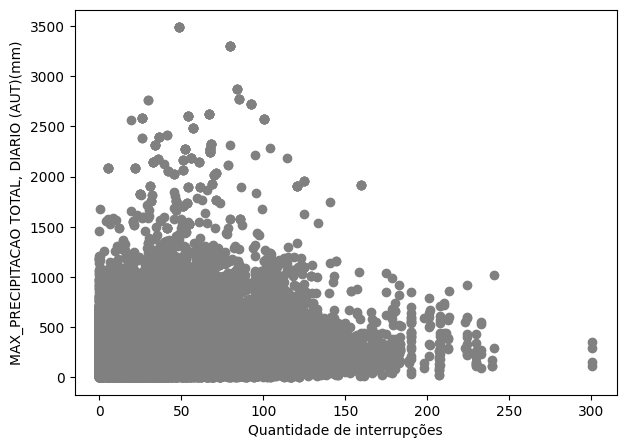

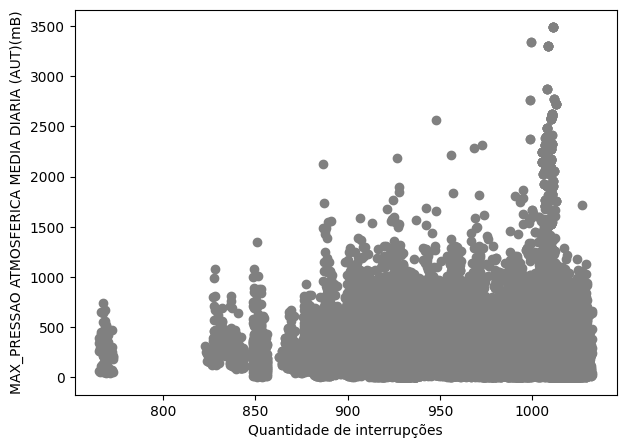

...

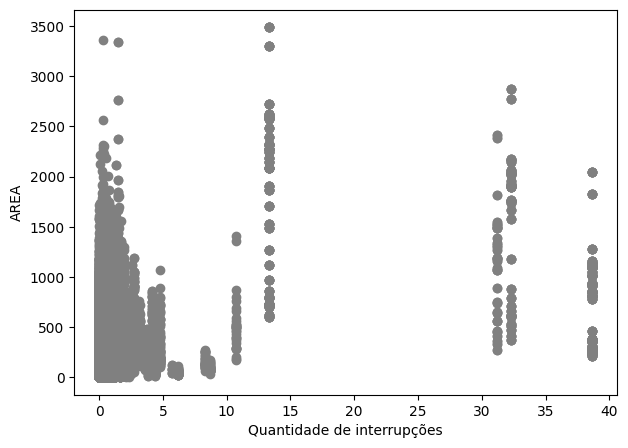

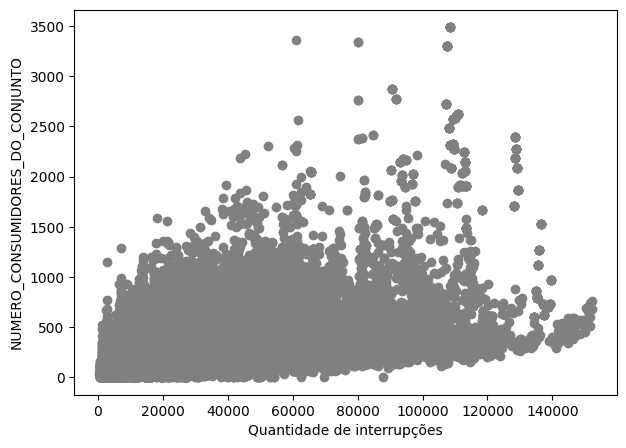

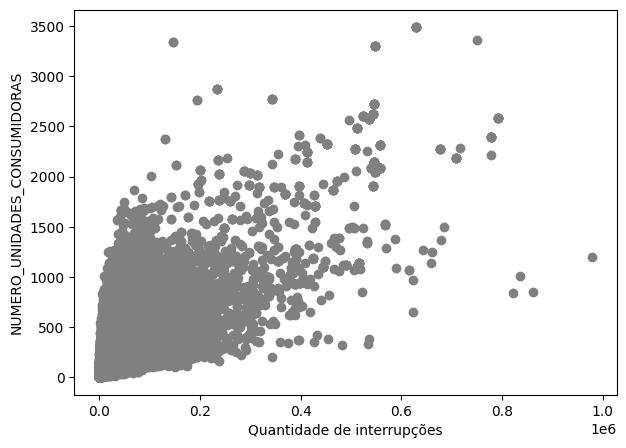

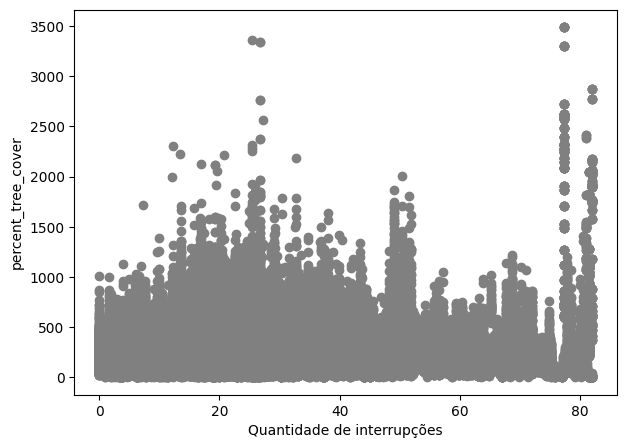

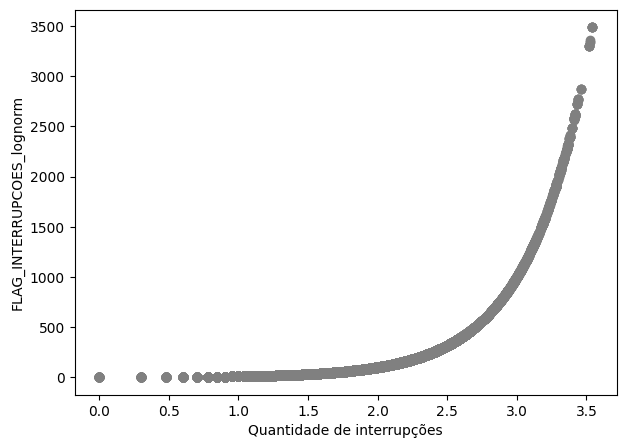

In [ ]:
# Scatter plot of variables
cols = df.select_dtypes(np.number).columns
cols = [c for c in cols if c not in ["FLAG_INTERRUPCOES"]]


for i, f in enumerate(cols):
  fig, ax = plt.subplots(figsize=(7, 5))
  ax.scatter(df[f], df["FLAG_INTERRUPCOES"], color='grey') # s=5 parameter in ax.scatter() controls the size of the bubbles
  ax.set_xlabel("Quantidade de interrupções")
  ax.set_ylabel(f)

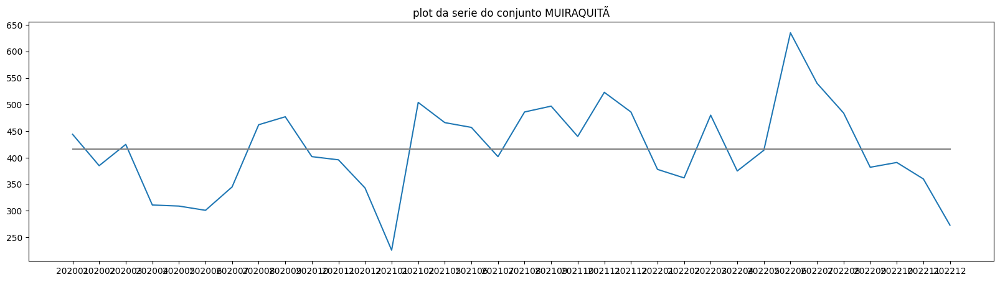

In [ ]:
# Plot da quantidade de interrupcoes por conjunto no Brasil

# Coleta 20 conjuntos aleatoriamente no Dataframe
conjuntos = np.random.choice(df.DscConjUndConsumidoras.unique(), size=1)

# Plota algumas serias para verificar o comportamento
for conjunto in conjuntos:
  fig, ax = plt.subplots(figsize=(20,5))

  # Title
  ax.set_title("plot da serie do conjunto {}".format(conjunto))
  # Mean
  mean = np.mean(df[df.DscConjUndConsumidoras == conjunto]["FLAG_INTERRUPCOES"])
  # Plot Serie
  ax.plot(df[df.DscConjUndConsumidoras == conjunto]["year_month"], df[df.DscConjUndConsumidoras == conjunto]["FLAG_INTERRUPCOES"])
  # Plot Mean
  df_size = len(df[df.DscConjUndConsumidoras == conjunto]["year_month"])
  ax.plot(df[df.DscConjUndConsumidoras == conjunto]["year_month"], [mean]*df_size, color='gray')

<ipython-input-31-ee2f549a8c3a>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


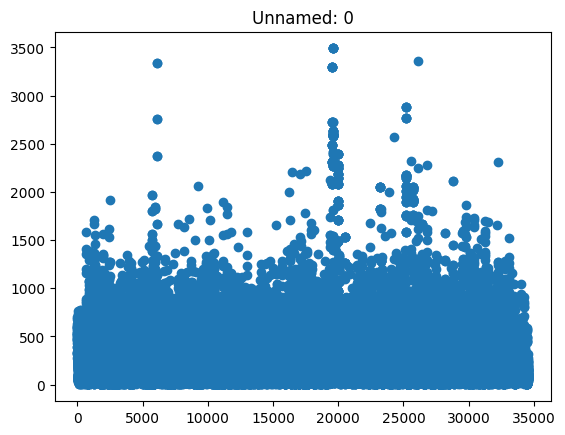

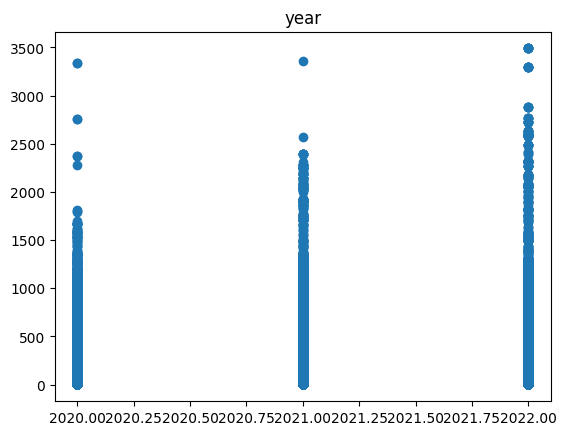

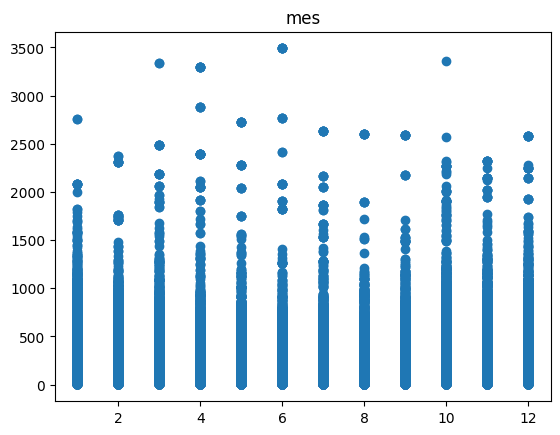

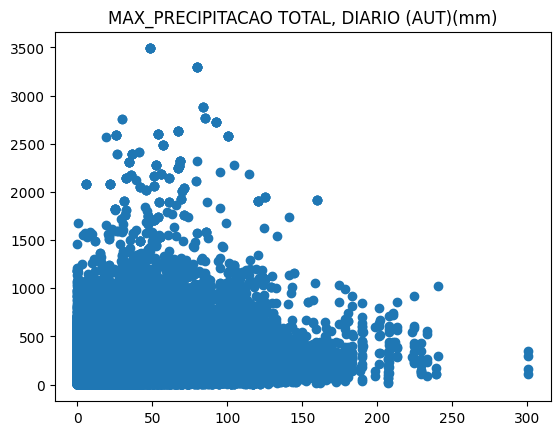

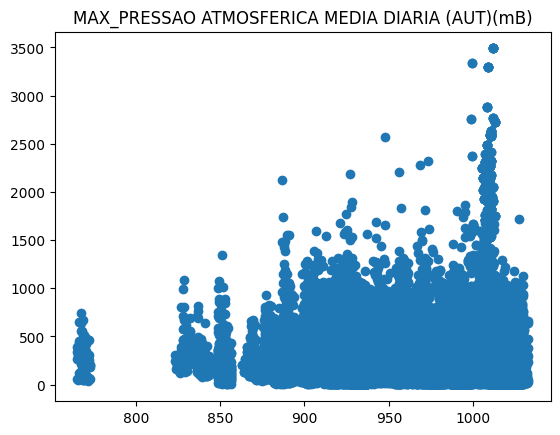

...

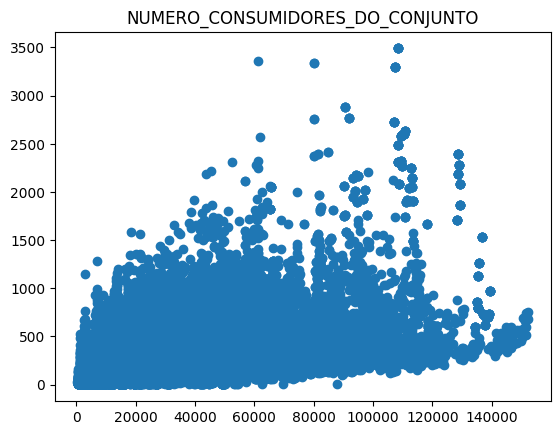

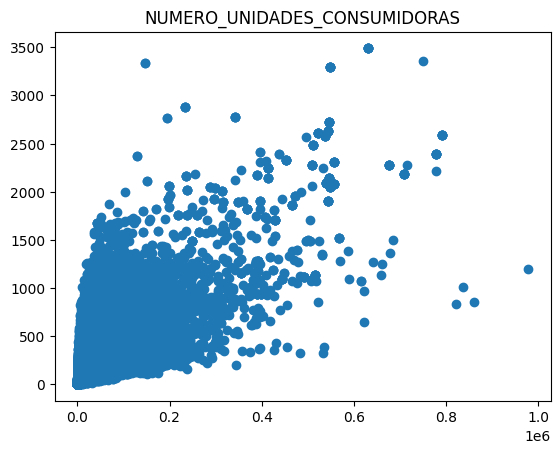

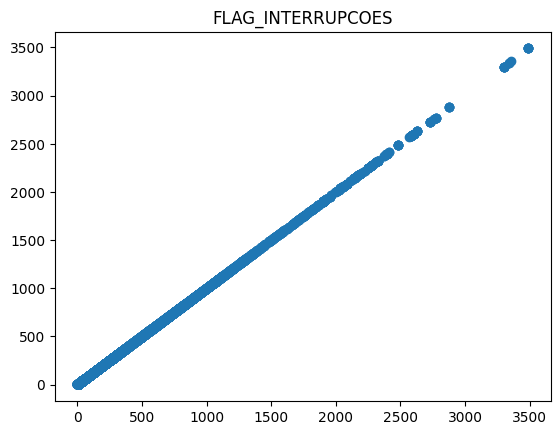

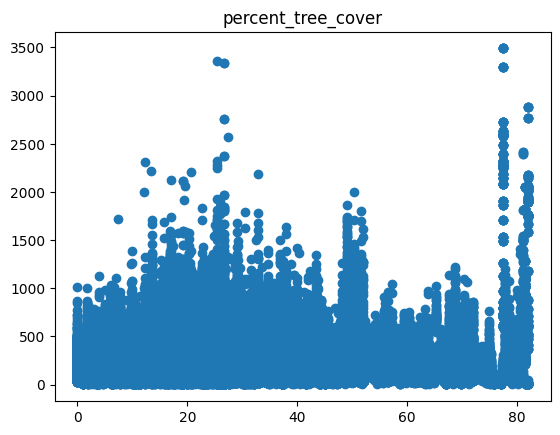

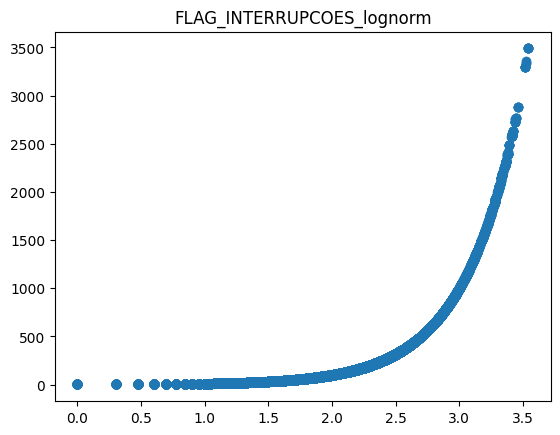

In [ ]:
# Analise de quanto cada coluna tem de Correlacao linear com a quantidade de Interrupcoes

for feature in df.select_dtypes(include=np.number).columns:
  fig, ax = plt.subplots()
  ax.set_title(feature)
  plt.scatter(df[feature], df.FLAG_INTERRUPCOES, axes=ax)

In [ ]:
# Plota a matrix de correlacao entre os atribuostos da base de dados. Apos salva em excel para a dissertacao.
df.corr().to_excel(base_path + "/Ordens_servico/matrix_de_correlacao.xlsx")

<ipython-input-43-3f6c58e45fcc>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr().to_excel(base_path + "/Ordens_servico/matrix_de_correlacao.xlsx")


In [ ]:
import geopandas as gpd
gdf = gpd.read_file('https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/brazil-states.geojson', driver='GeoJSON')
gdf.head(1)

,id,name,sigla,regiao_id,codigo_ibg,cartodb_id,created_at,updated_at,geometry
0,1,Acre,AC,3,12,1,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-73.60818 -7.20194, -72.86963 ..."


In [ ]:
# Faz o plot do mapa de calor de religamentos por cada estado - obs. minas nao esta aparecendo na analise (verificar)

colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
              "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
              "#08519c","#0b4083","#08306b"]

states_df = df.groupby("UF")["FLAG_INTERRUPCOES"].sum().reset_index()
# save the dataset for external plot
states_df.to_excel(base_path + 'Ordens_servico/states_int_amount.xlsx')
fig_cloropleth = px.choropleth(states_df, geojson=counties, locations='UF', scope='south america', hover_name ="FLAG_INTERRUPCOES", labels={'FLAG_INTERRUPCOES':'FLAG_INTERRUPCOES'}, featureidkey="properties.sigla", color_continuous_scale="gray_r",
                               color="FLAG_INTERRUPCOES",  width = 1000 , height=1000,
)
fig_cloropleth.layout.coloraxis.colorbar.len = 0.6
fig_cloropleth.layout.coloraxis.colorbar.title = 'Quantidade Interrupcoes'
fig_cloropleth.layout.coloraxis.colorbar.titlefont.size = 15
fig_cloropleth.update_layout(
    title_text = 'Quantidade de Interrupcoes por estado do Brasil - 2020, 2021 e 2022 - ANEEL',
)

fig_cloropleth.show()
print("Media de Religamentos nos estados:", np.mean(states_df))
print("Desvio Padrao de Religamentos nos estados:", np.std(states_df))

Media de Religamentos nos estados: FLAG_INTERRUPCOES    874692.230769
dtype: float64
Desvio Padrao de Religamentos nos estados: FLAG_INTERRUPCOES    755406.36196
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3571: FutureWarning:

The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



In [ ]:
states_df.sort_values(by='FLAG_INTERRUPCOES', ascending= False)

,UF,FLAG_INTERRUPCOES
24,SP,3013401
9,MG,2895677
17,RJ,1792562
16,PR,1623666
7,GO,1503052
21,RS,1448710
12,PA,1012560
4,CE,947791
2,AM,911193
8,MA,873717


In [ ]:
# Filtra apenas uma amostra dos dados para fazer os testes.
# df = df[df.uf == "RJ"]
# # Apenas para o Rio de Janeiro no conjunto tem-se 1066357 interrupcoes e 22 municios
# df.FLAG_INTERRUPCOES.sum(), len(df.NOME_MUNICIPIO.unique())

Correlation - Check the dispertion of each variable with the target

<ipython-input-67-3d538f085860>:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



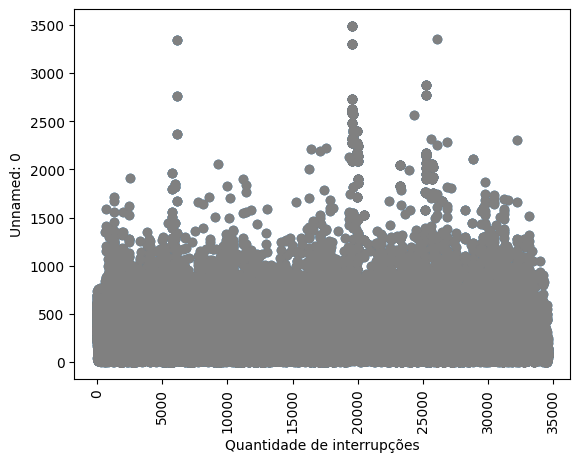

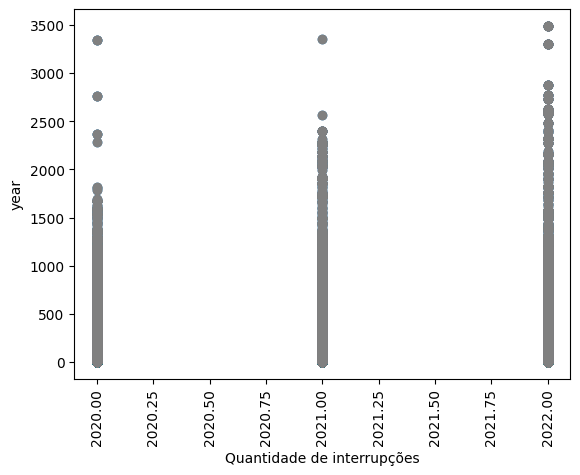

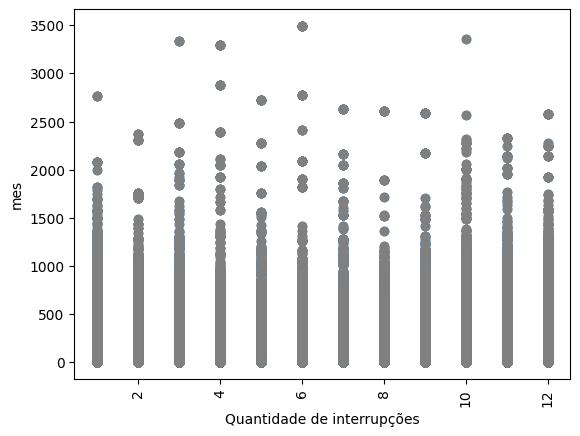

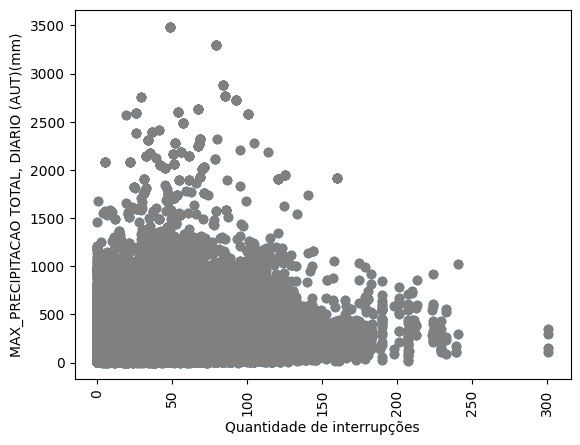

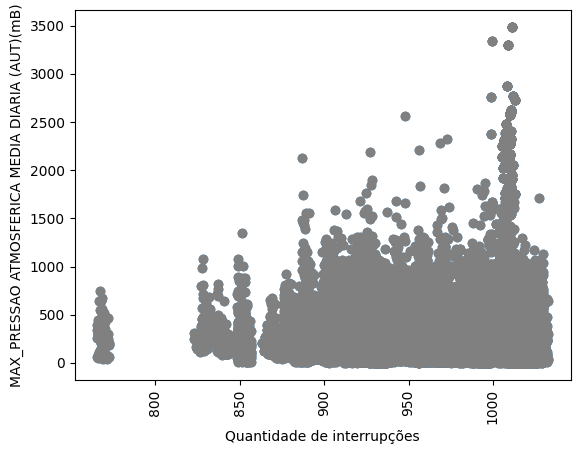

...

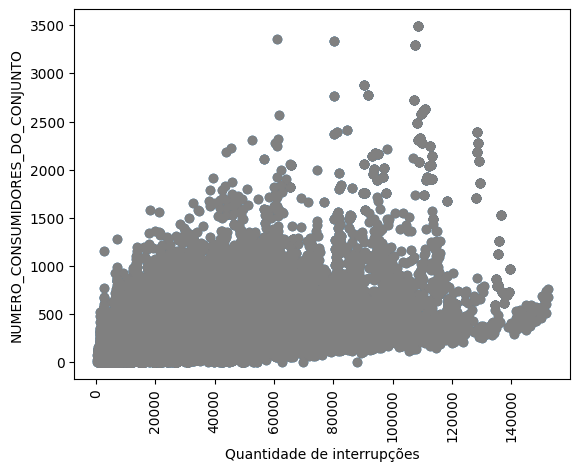

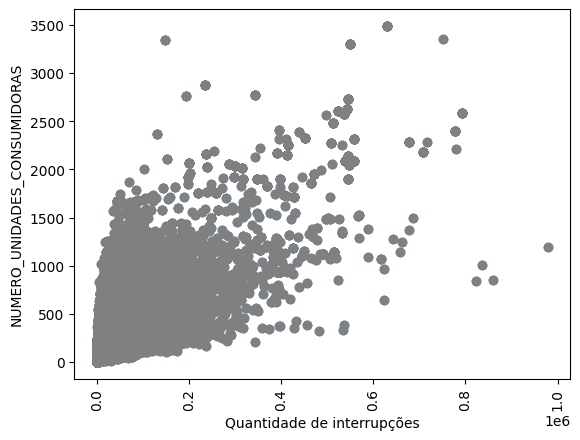

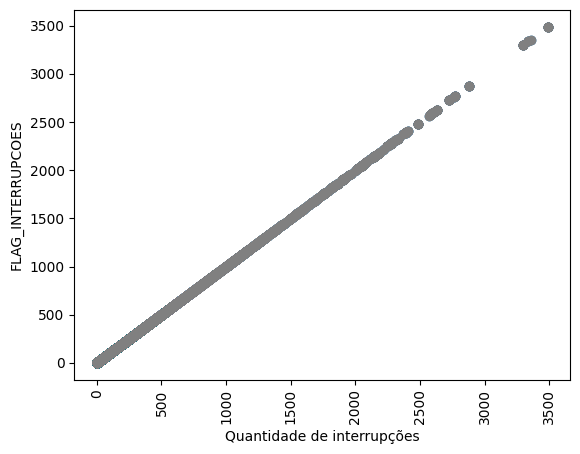

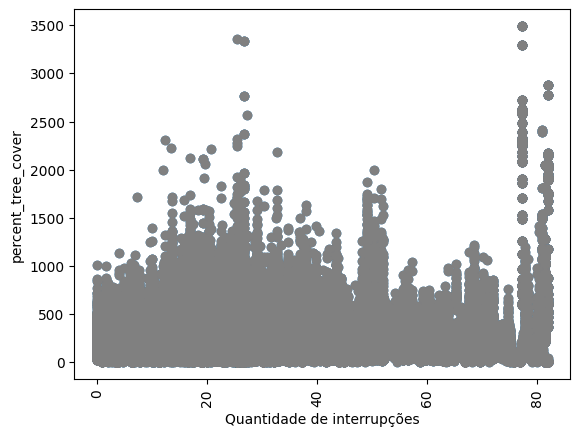

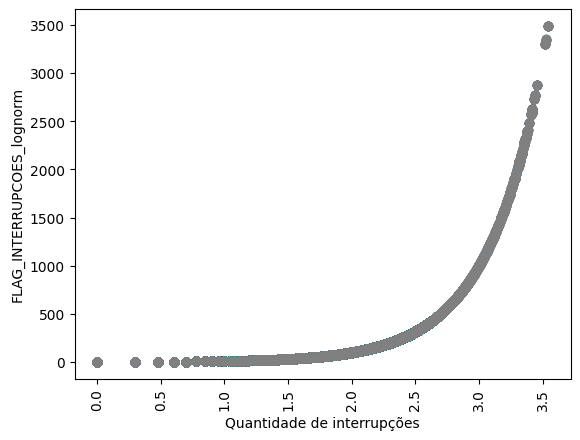

In [ ]:
# Scatter only is defined with numerical cols
num_cols = df.select_dtypes(np.number).columns

for col in num_cols:
  fig, ax = plt.subplots()
  ax.scatter(df[col], df.FLAG_INTERRUPCOES)
  ax.tick_params(axis='x', labelrotation = 90)
  ax.set_ylabel(col)
  ax.set_xlabel('Quantidade de interrupções')
  ax.scatter(df[col], df.FLAG_INTERRUPCOES, color='gray')

## 2 - Preprocess

Para o modelo entender os dados passados, eh necessario transformar as variaveis categoricas em numericas. Ja as variaveis numericas pode ser necessarios algum tratamento (como normalizacao, ou padronizacao).

### Retira os outliers

<Axes: >

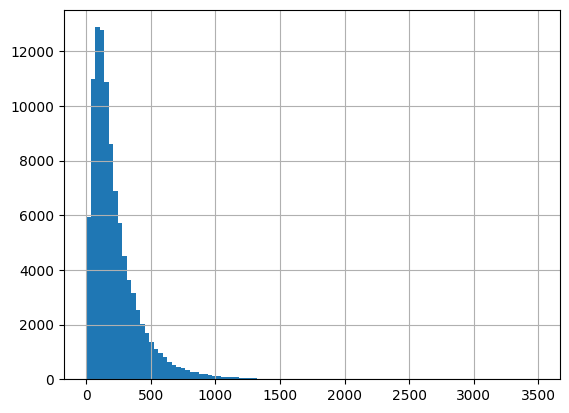

In [ ]:
# Plota o histograma de interrupcoes para ver
df.FLAG_INTERRUPCOES.hist(bins=100)

{'whiskers': [<matplotlib.lines.Line2D at 0x78e8abc37eb0>,
 'caps': [<matplotlib.lines.Line2D at 0x78e8a3e7c310>,
 'boxes': [<matplotlib.lines.Line2D at 0x78e8abc37c10>],
 'medians': [<matplotlib.lines.Line2D at 0x78e8a3e7c850>],
 'fliers': [<matplotlib.lines.Line2D at 0x78e8a3e7caf0>],
 'means': []}

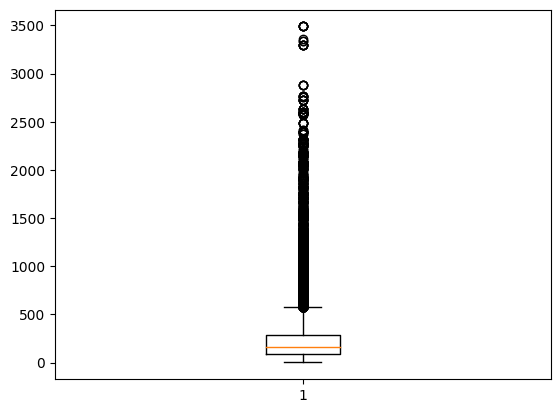

In [ ]:
plt.boxplot(df.FLAG_INTERRUPCOES)

In [ ]:
df.FLAG_INTERRUPCOES.quantile(0.1)

50.0

In [ ]:
df = treat_outliers(df)

quantidade registros extremos retirados


10073

<Axes: >

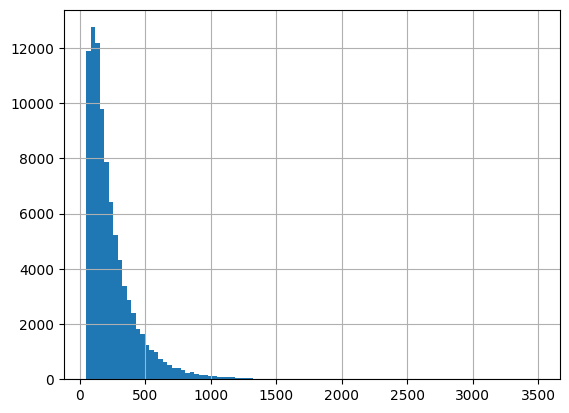

In [ ]:
df.FLAG_INTERRUPCOES.hist(bins=100)

### Tratamento dos Valores Nulos

In [ ]:
# Algumas colunas parecem apresentar valores nulos. O que pode ser um problema para o modelo
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91019 entries, 22381 to 14047
Data columns (total 72 columns):
 #   Column                                                                           Non-Null Count  Dtype  
---  ------                                                                           --------------  -----  
 0   Unnamed: 0                                                                       91019 non-null  int64  
 1   year                                                                             91019 non-null  int64  
 2   DscConjUndConsumidoras                                                           91019 non-null  object 
 3   mes                                                                              91019 non-null  int64  
 4   MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)                                         65972 non-null  float64
 5   MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)                                   71929 non-null  float64
 6   MA

In [ ]:
# Parece que a coluna referente a regiao metropolitana tem dados faltantes quando o municipio nao eh caracterizado desta forma. Essa informacao eh importante porque uma Região metropolitana eh composta por
# um nucleo urbano densamente povoado.
df[df["Região Metropolitana"].notnull()]

,Unnamed: 0,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover,year_month,FLAG_INTERRUPCOES_lognorm
8448,8448,2020,CURITIBANOS DISTRITO INDUSTRIAL,1,26.2,909.679167,19.570833,32.3,24.129167,19.8,91.458333,80.0,11.1,2.745833,3.393548,903.494624,15.882930,26.658065,20.570968,16.509677,77.026882,49.387097,7.916129,1.801613,105.2,4216800.0,SÃO JOSÉ DO CERRITO,-50.581386,-27.668587,4216800.0,São José do Cerrito,SC,8054.0,2 - 5001 até 10000,Região Metropolitana de Lages,4 - Sul,Sul,Serrana,Campos de Lages,Lages,do Entorno,Lages,do Entorno,NaN,NaN,NaN,Centro Local,Centro Local,Região Rural da Metrópole de Porto Alegre,Região Rural de Metrópole,Não,Não,Não,1.859641e+05,8.155563e+03,1.941196e+05,23751.33,0.0,16059,SÃO JOSÉ DO CERRITO,SC,0.307218,0.096561,4737,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,CURITIBANOS DISTRITO INDUSTRIAL,3357.945946,7884,74,42.975309,202001,1.869232
13409,13409,2020,IBURA,1,21.8,1012.891667,23.550000,33.5,28.654167,26.6,78.458333,63.0,NaN,NaN,1.890323,1011.419618,21.671686,32.687097,27.924696,23.932258,70.049965,48.806452,NaN,NaN,58.6,2607901.0,JABOATÃO DOS GUARARAPES,-34.921173,-8.165391,2607901.0,Jaboatão dos Guararapes,PE,711330.0,7 - Maior que 500000,Região Metropolitana do Recife,2 - Nordeste,Nordeste,Metropolitana de Recife,Recife,Recife,do Entorno,Recife,do Entorno,Recife/PE,Grande concentração urbana,Recife/PE,Integrante de Metrópole,Metrópole,Região Rural da Metrópole de Recife,Região Rural de Metrópole,Não,Não,Não,1.094719e+07,2.348589e+06,1.329578e+07,18809.45,1.0,14167,JABOATÃO DOS GUARARAPES,PE,0.037551,0.002308,71,Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o c...,IBURA,69549.000000,9528,207,16.500000,202001,2.315970
30886,30886,2020,TABOÃO DA SERRA,1,48.8,931.433333,21.782609,34.5,26.258333,22.1,92.708333,82.0,17.5,3.720833,7.935484,925.043817,18.647534,27.903226,22.168683,18.958065,82.475105,57.870968,9.629032,2.023387,246.0,3552

In [ ]:
# Parece pelos dados que o municipios com baixa concentracao urbana estao sem classificacao. Por hora vamos marcar como nao classificados
df[df["Tipo Concentração Urbana"].notnull()]["Tipo Concentração Urbana"].unique()

array(['Grande concentração urbana', 'Média concentração urbana'],
      dtype=object)

In [ ]:
# Faz a verificacao de registros nulos nos dados de vegetacao
df[df["veg_class"].isnull()]["veg_class"].shape[0]

0

In [ ]:
df = fill_null(df)

### Inclui as variaveis de clusters

In [ ]:
df = add_clusters_info(df)

In [ ]:
df.shape

(91019, 74)

In [ ]:
# 1256 registros de clusters sao nulos
df[df.labels.isnull()].shape

(2008, 74)

In [ ]:
# Completa os registros com labels de cluster vazios com uma nova classe

In [ ]:
df.columns

Index(['Unnamed: 0', 'year', 'DscConjUndConsumidoras', 'mes',
       'MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)',
       'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
       'MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)',
       'MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)',
       'MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'MED_UMIDADE RELATIVA DO AR, MEDIA 

Define as caracteristicas do modelo

In [ ]:
df = select_features(df, index, cols)

TypeError: select_features() missing 2 required positional arguments: 'index' and 'cols'

In [ ]:
df.head()

mes  \
year_month DscConjUndConsumidoras                 
202001     PARELHAS                           1   
           CURITIBANOS DISTRITO INDUSTRIAL    1   
           IBURA                              1   
           TABOÃO DA SERRA                    1   
           Pitanga                            1   

                                            MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                              4.4   
           CURITIBANOS DISTRITO INDUSTRIAL                                      26.2   
           IBURA                                                                21.8   
           TABOÃO DA SERRA                                                      48.8   
           Pitanga                                                              36.0   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                               18.6   
           CURITIBANOS DISTRITO INDUSTRIAL                                       105.2   
           IBURA                                                                  58.6   
           TABOÃO DA SERRA                                                       246.0   
           Pitanga                                                                76.8   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.600000   
           CURITIBANOS DISTRITO INDUSTRIAL                                  3.393548   
           IBURA                                                            1.890323   
           TABOÃO DA SERRA                                                  7.935484   
           Pitanga                                                          4.800000   

                                            MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)  \
year_month DscConjUndConsumidoras                                                            
202001     PARELHAS                                                             993.283333   
           CURITIBANOS DISTRITO INDUSTRIAL                                      909.679167   
           IBURA                                                               1012.891667   
           TABOÃO DA SERRA                                                      931.433333   
           Pitanga                                                              942.841667   

                                            MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  \
year_month DscConjUndConsumidoras                                                                         
202001     PARELHAS                                                                 21.416667             
           CURITIBANOS DISTRITO INDUSTRIAL                                          19.570833             
           IBURA                                                                    23.550000             
           TABOÃO DA SERRA                                                          21.782609             
           Pitanga                                                                  23.500000             

                                            MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)  \
year_month DscConjUndConsumidoras                                                       
202001     PARELHAS                                                              38.8   
           CURITIBANOS DISTRITO INDUSTRIAL                                       32.3   
           IBURA                                        

In [ ]:
df = drop_duplic(df)

mes  \
year_month DscConjUndConsumidoras                 
202001     PARELHAS                           1   
           CURITIBANOS DISTRITO INDUSTRIAL    1   
           IBURA                              1   
           TABOÃO DA SERRA                    1   
           Pitanga                            1   
...                                         ...   
202212     DELMIRO GOUVEIA                   12   
           Bandeirantes                      12   
           VARGEM GRANDE DO SUL              12   
           Brumadinho                        12   
           ITAQUERA                          12   

                                            MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                              4.4   
           CURITIBANOS DISTRITO INDUSTRIAL                                      26.2   
           IBURA                                                                21.8   
           TABOÃO DA SERRA                                                      48.8   
           Pitanga                                                              36.0   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                      57.2   
           Bandeirantes                                                         13.0   
           VARGEM GRANDE DO SUL                                                 15.6   
           Brumadinho                                                           80.4   
           ITAQUERA                                                             36.8   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                               18.6   
           CURITIBANOS DISTRITO INDUSTRIAL                                       105.2   
           IBURA                                                                  58.6   
           TABOÃO DA SERRA                                                       246.0   
           Pitanga                                                                76.8   
...                                                                                ...   
202212     DELMIRO GOUVEIA                                                        83.0   
           Bandeirantes                                                           23.6   
           VARGEM GRANDE DO SUL                                                  134.6   
           Brumadinho                                                            300.0   
           ITAQUERA                                                              166.2   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.600000   
           CURITIBANOS DISTRITO INDUSTRIAL                                  3.393548   
           IBURA                                                            1.890323   
           TABOÃO DA SERRA                                                  7.935484   
           Pitanga                                                          4.800000   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  3.074074   
           Bandeirantes                                                     1.573333   
           VARGEM GRANDE DO SUL                                             4.341935   
           Brumadinho                                                      10.000000   
        

In [ ]:
# Vamos analisar os dados outliers. Dessa forma, vamos plotar o histograma (barras em variaveis de categorias) de todas as variaveis do conjunto. E enteder se tem algum conjunto fora do padrao esperado
# columns = df.columns

# for col in columns:
#   fig, ax = plt.subplots(figsize=(20, 4))
#   fig.suptitle("{} histogram".format(col), fontsize=10)
#   ax.hist(df[col].values)
#   plt.show()
#   plt.close()

# Populacao estimada - Populacao estimada parece apresentar alguns casos acima do padrao, porem pelo que analisado parece ser um municipio grande (Ex. Rio de Janeiro), nao justifica neste caso a retirada de outliers
# Max preciptacao - A precipitacao maxima possui grande parte dos valores na faixa de 0 a 60, porem alguns poucas casos (em relacao a base de dados) apresentam valores proximos de 100.
# para esse caso foi decidido nao retirar esses registros por nao ser um valor altamente discrepante
# Flag interrucoes -  A flag que marca o output do modelo - quantidade de interrupcoes -
# apresenta alguns casos acima do padrao, porem pelo que analisado parece ser um municipio grande (Ex. Rio de Janeiro), nao se justifica neste caso a retirada de outliers

In [ ]:
df

mes  \
year_month DscConjUndConsumidoras                 
202001     PARELHAS                           1   
           CURITIBANOS DISTRITO INDUSTRIAL    1   
           IBURA                              1   
           TABOÃO DA SERRA                    1   
           Pitanga                            1   
...                                         ...   
202212     DELMIRO GOUVEIA                   12   
           Bandeirantes                      12   
           VARGEM GRANDE DO SUL              12   
           Brumadinho                        12   
           ITAQUERA                          12   

                                            MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                              4.4   
           CURITIBANOS DISTRITO INDUSTRIAL                                      26.2   
           IBURA                                                                21.8   
           TABOÃO DA SERRA                                                      48.8   
           Pitanga                                                              36.0   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                      57.2   
           Bandeirantes                                                         13.0   
           VARGEM GRANDE DO SUL                                                 15.6   
           Brumadinho                                                           80.4   
           ITAQUERA                                                             36.8   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                               18.6   
           CURITIBANOS DISTRITO INDUSTRIAL                                       105.2   
           IBURA                                                                  58.6   
           TABOÃO DA SERRA                                                       246.0   
           Pitanga                                                                76.8   
...                                                                                ...   
202212     DELMIRO GOUVEIA                                                        83.0   
           Bandeirantes                                                           23.6   
           VARGEM GRANDE DO SUL                                                  134.6   
           Brumadinho                                                            300.0   
           ITAQUERA                                                              166.2   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.600000   
           CURITIBANOS DISTRITO INDUSTRIAL                                  3.393548   
           IBURA                                                            1.890323   
           TABOÃO DA SERRA                                                  7.935484   
           Pitanga                                                          4.800000   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  3.074074   
           Bandeirantes                                                     1.573333   
           VARGEM GRANDE DO SUL                                             4.341935   
           Brumadinho                                                      10.000000   
        

In [ ]:
df[df[label] == df[label].max()][label]

year_month  DscConjUndConsumidoras
202206      MÉDIO E BAIXO AMAZONAS    3489
Name: FLAG_INTERRUPCOES, dtype: int64

In [ ]:
# Teste - Passa o mes para variavel categorica
def transform_month(df):
  df["mes"] = df["mes"].astype('str')
  return df

df = transform_month(df)

In [ ]:
cat_cols = df.select_dtypes(include=['object']).columns
cat_cols

Index(['mes', 'UF', 'Amazônia Legal', 'Semiárido', 'veg_class', 'labels'], dtype='object')

In [ ]:
# Vamos verificar o numero de possiveis valores de serem encontrados em cada categoria
for col in df[cat_cols]:
  print(col, len(df[col].unique()))

mes 12
UF 27
Amazônia Legal 3
Semiárido 3
veg_class 39
labels 5


In [ ]:
df = one_hot_econding(df)

In [ ]:
df

In [ ]:
df =   fill_null_mean_tratment(df, integer_null_cols_dict)

### Cria variáveis de Series Temporais

- Variaveis de lag (quantidade de interrupcoes em meses passados) - somente eh criado para com a variavel dependente

In [ ]:
df = time_shift(df)

,,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",FLAG_LIT,MUN_MINIMUM_BOUND_RADIO,AREA,NUMERO_CONSUMIDORES_DO_CONJUNTO,FLAG_INTERRUPCOES,percent_tree_cover,mes_10,mes_11,mes_12,mes_2,mes_3,mes_4,mes_5,mes_6,mes_7,mes_8,mes_9,UF_AL,UF_AM,UF_BA,UF_CE,UF_DF,UF_ES,UF_GO,UF_MA,UF_MG,UF_MS,UF_MT,UF_PA,UF_PB,UF_PE,UF_PI,UF_PR,UF_RJ,UF_RN,UF_RO,UF_RR,UF_RS,UF_SC,UF_SE,UF_SP,UF_TO,Amazônia Legal_Sim,Semiárido_Sim,veg_class_Campinarana Arborizada,veg_class_Campinarana Florestada,veg_class_Campinarana Gramineo-Lenhosa,veg_class_Estepe Gramineo-Lenhosa,veg_class_Estepe Parque,veg_class_Floresta OmbrÃ³fila/Floresta Estacional,veg_class_Floresta Estacional Decidual Montana,veg_class_Floresta Estacional Decidual Submontana,veg_class_Floresta Estacional Semidecidual Montana,veg_class_Floresta Estacional Semidecidual Submontana,veg_class_Floresta Estacional/FormaÃ§Ãµes Pioneiras,veg_class_Floresta OmbrÃ³fila Densa Aluvial,veg_class_Floresta OmbrÃ³fila Densa Montana,veg_class_Floresta OmbrÃ³fila Densa Submontana,veg_class_Floresta OmbrÃ³fila Densa Terras Baixas,veg_class_Floresta OmbrÃ³fila Densa/Floresta OmbrÃ³fila Mista,veg_class_Floresta OmbrÃ³fila Mista Montana,veg_class_Massa Dagua Continental,"veg_class_Massa Dagua Costeira - Mar Territorial, 12 milhas",veg_class_Savana Arborizada,veg_class_Savana EstÃ©pica/Floresta Estacional,veg_class_Savana Florestada,veg_class_Savana Gramineo-Lenhosa,veg_class_Savana Parque,veg_class_Savana-EstÃ©pica Arborizada,veg_class_Savana-EstÃ©pica Florestada,veg_class_Savana-EstÃ©pica Gramineo-Lenhosa,veg_class_Savana-EstÃ©pica Parque,veg_class_Savana/ Floresta Estacional,veg_class_Savana/Floresta OmbrÃ³fila,veg_class_Savana/Savana EstÃ©pica,veg_class_Savana/Savana EstÃ©pica/Floresta Estacional,veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Submontana,veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Terras Baixas,veg_class_VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Fluvial e/ou Lacustre,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Fluvio- marinha,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Marinha,labels_1,labels_2,labels_3
year_month,DscConjUndConsumidoras,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
202001,ABAETETUBA I,66.4,465.6,15.520000,1010.613043,24.362500,34.2,27.212500,24.8,90.500000,76.0,13.400000,1.129167,1009.080320,23.226419,31.623333,26.150623,23.676667,84.733177,59.967742,7.841935,0.691995,0.0,0.201296,0.065269,31993.0,531,56.898305,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
202002,ABAETETUBA I,93.8,553.8,19.096552,1011.054167,24.295833,33.2,27.695833,24.9,92.125000,89.0,13.100000,1.433333,1009.202836,23.366517,31.079310,26.008040,23.762069,85.974325,63.586207,7.403448,0.697632,0.0,0.201296,0.065269,32034.0,591,56.898305,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

In [ ]:
df = year_seasons(df)

In [ ]:
# Retira as colunas dos dois primeiros meses por conterem valores nulos apos a inclusao do lag
# last_month = df.reset_index().year_month.astype(int).min()
# second_last_month = last_month + 1

# df = df[df.index.get_level_values(0).astype(int) > second_last_month]

In [ ]:
df

MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                              4.4   
           CURITIBANOS DISTRITO INDUSTRIAL                                      26.2   
           IBURA                                                                21.8   
           TABOÃO DA SERRA                                                      48.8   
           Pitanga                                                              36.0   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                      57.2   
           Bandeirantes                                                         13.0   
           VARGEM GRANDE DO SUL                                                 15.6   
           Brumadinho                                                           80.4   
           ITAQUERA                                                             36.8   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                               18.6   
           CURITIBANOS DISTRITO INDUSTRIAL                                       105.2   
           IBURA                                                                  58.6   
           TABOÃO DA SERRA                                                       246.0   
           Pitanga                                                                76.8   
...                                                                                ...   
202212     DELMIRO GOUVEIA                                                        83.0   
           Bandeirantes                                                           23.6   
           VARGEM GRANDE DO SUL                                                  134.6   
           Brumadinho                                                            300.0   
           ITAQUERA                                                              166.2   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.600000   
           CURITIBANOS DISTRITO INDUSTRIAL                                  3.393548   
           IBURA                                                            1.890323   
           TABOÃO DA SERRA                                                  7.935484   
           Pitanga                                                          4.800000   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  3.074074   
           Bandeirantes                                                     1.573333   
           VARGEM GRANDE DO SUL                                             4.341935   
           Brumadinho                                                      10.000000   
           ITAQUERA                                                         5.361290   

                                            MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)  \
year_month DscConjUndConsumidoras                                                            
202001     PARELHAS                                                             993.283333   
           CURITIBANOS DISTRITO INDUSTRIAL                                      909.679167   
           IBURA                                                               1012.891667   
           TABOÃO DA SERRA                                                      931.433333   
           Pitanga 

### Normaliza os dados das caracteristica

Normalizacao utilizada: min, max

In [ ]:
df = norm_data(df)

In [ ]:
df

MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.014637   
           CURITIBANOS DISTRITO INDUSTRIAL                                  0.087159   
           IBURA                                                            0.072522   
           TABOÃO DA SERRA                                                  0.162342   
           Pitanga                                                          0.119760   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  0.190286   
           Bandeirantes                                                     0.043247   
           VARGEM GRANDE DO SUL                                             0.051896   
           Brumadinho                                                       0.267465   
           ITAQUERA                                                         0.122422   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                           0.011252   
           CURITIBANOS DISTRITO INDUSTRIAL                                    0.063642   
           IBURA                                                              0.035451   
           TABOÃO DA SERRA                                                    0.148820   
           Pitanga                                                            0.046461   
...                                                                                ...   
202212     DELMIRO GOUVEIA                                                    0.050212   
           Bandeirantes                                                       0.014277   
           VARGEM GRANDE DO SUL                                               0.081428   
           Brumadinho                                                         0.181488   
           ITAQUERA                                                           0.100544   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.006660   
           CURITIBANOS DISTRITO INDUSTRIAL                                  0.037670   
           IBURA                                                            0.020984   
           TABOÃO DA SERRA                                                  0.088088   
           Pitanga                                                          0.053283   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  0.034124   
           Bandeirantes                                                     0.017465   
           VARGEM GRANDE DO SUL                                             0.048198   
           Brumadinho                                                       0.111005   
           ITAQUERA                                                         0.059513   

                                            MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)  \
year_month DscConjUndConsumidoras                                                            
202001     PARELHAS                                                               0.852653   
           CURITIBANOS DISTRITO INDUSTRIAL                                        0.539826   
           IBURA                                                                  0.926022   
           TABOÃO DA SERRA                                                        0.621225   
           Pitanga 

In [ ]:
# Persiste o conjunto de dados tratado
df.to_excel(base_path + "/Ordens_servico/preprocess.xlsx")

In [ ]:
# Persiste a base preprocessada dividida em 4 modelos a partir dos clusters definidos
# clusters = [c for c in df.columns if 'label' in c]

# for cluster in clusters:
#   df[df[cluster] == 1].to_excel(base_path + "/Ordens_servico/preprocess_cluster_{}.xlsx".format(cluster))

# 3- Modelagem - Aplicacao dos Algoritmos

Apos ser realizado tratamento dos dados e a coodificacao das variaveis para a entrada no modelo. Eh realizada aplicacao dos algoritmos. Tendo como objetivo realizar a previsao da quantidade de ordens de servico no mes/municipio (ou agregacao territorial - obs. atualmente o modelo esta por municipio, porem eh possivel outras agregacoes, como o Conjunto)

In [ ]:
modeling_df = pd.read_excel(base_path + "Ordens_servico/preprocess.xlsx", index_col=[0,	1])
# Le os conjuntos de cada clusters
modeling_clusters_df = []
clusters = [c for c in modeling_df.columns if 'label' in c]
for cluster in clusters:
  modeling_clusters_df.append(pd.read_excel(base_path + "/Ordens_servico/preprocess_cluster_{}.xlsx".format(cluster), index_col=[0,	1]))

In [ ]:
# For Energisa sergipe validation the model performance without the clusters variables is better
# modeling_df = modeling_df.drop(columns=clusters)

In [ ]:
modeling_df

MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.014637   
           CURITIBANOS DISTRITO INDUSTRIAL                                  0.087159   
           IBURA                                                            0.072522   
           TABOÃO DA SERRA                                                  0.162342   
           Pitanga                                                          0.119760   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  0.190286   
           Bandeirantes                                                     0.043247   
           VARGEM GRANDE DO SUL                                             0.051896   
           Brumadinho                                                       0.267465   
           ITAQUERA                                                         0.122422   

                                            TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                        
202001     PARELHAS                                                           0.011252   
           CURITIBANOS DISTRITO INDUSTRIAL                                    0.063642   
           IBURA                                                              0.035451   
           TABOÃO DA SERRA                                                    0.148820   
           Pitanga                                                            0.046461   
...                                                                                ...   
202212     DELMIRO GOUVEIA                                                    0.050212   
           Bandeirantes                                                       0.014277   
           VARGEM GRANDE DO SUL                                               0.081428   
           Brumadinho                                                         0.181488   
           ITAQUERA                                                           0.100544   

                                            MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                                      
202001     PARELHAS                                                         0.006660   
           CURITIBANOS DISTRITO INDUSTRIAL                                  0.037670   
           IBURA                                                            0.020984   
           TABOÃO DA SERRA                                                  0.088088   
           Pitanga                                                          0.053283   
...                                                                              ...   
202212     DELMIRO GOUVEIA                                                  0.034124   
           Bandeirantes                                                     0.017465   
           VARGEM GRANDE DO SUL                                             0.048198   
           Brumadinho                                                       0.111005   
           ITAQUERA                                                         0.059513   

                                            MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)  \
year_month DscConjUndConsumidoras                                                            
202001     PARELHAS                                                               0.852653   
           CURITIBANOS DISTRITO INDUSTRIAL                                        0.539826   
           IBURA                                                                  0.926022   
           TABOÃO DA SERRA                                                        0.621225   
           Pitanga 

In [ ]:
# Calculate the MAPE error
def MAPE(y_true, y_ext):
  "Calculater MAPE error"
  value = ( np.sum(np.absolute(y_true - y_ext)/ y_true) / len(y_true) )*100
  return value

# Calculate the SSE error
def MSE(y_true, y_ext):
  "Calculater MAPE error"
  value = ( np.sum(np.absolute(y_true - y_ext)**2) / len(y_true) )
  return value

## 3.1 - Baseline

Para verificar a qualidade dos demais modelo, é sabido que é necessário ter um modelo comparativo simples. Dessa forma, é criado um modelo base. Com isso, inicialmente vamos testar um modelo simples e verificar se melhora a métrica de Previsão baseline sobre a media. O primeiro modelo que vamos utilizar é uma previsão de Naive Sazonal.

In [ ]:
# Create a baseline metrics, which the values for the next year are the last one
def last_year_interruptions(modeling_df):
  modeling_df = modeling_df.reset_index()

  modeling_df["mes"] = modeling_df.year_month.astype('str').str[4 :].astype('int')
  modeling_df["year"] = modeling_df.year_month.astype('str').str[0: 4].astype('int')

  modeling_df = modeling_df.sort_values(['year', 'mes'])
  modeling_df["FLAG_INTERRUPCOES_SET_LAST_YEAR"] = modeling_df.groupby(["mes", "DscConjUndConsumidoras"])["FLAG_INTERRUPCOES"].shift(1)

  # Order values by month to check
  modeling_df = modeling_df.sort_values(['mes'])
  modeling_df = modeling_df.drop(columns = 'year')
  modeling_df = modeling_df.drop(columns = 'mes')

  modeling_df = modeling_df.set_index(["year_month",	"DscConjUndConsumidoras"])

  return modeling_df

In [ ]:
modeling_df = last_year_interruptions(modeling_df)

for ind, cluster_df in enumerate(modeling_clusters_df):
  modeling_clusters_df[ind] = last_year_interruptions(cluster_df)

In [ ]:
def baseline(modeling_df, separe_type='general'):
  # Baseline for Naive Sazonal Method

  # Baseline 1.1
  if separe_type == "general":
    # Check the result for the two last months in 2022
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int').isin([202211, 202212])]
    title = "Quantidade de casos de interrupções real vs. inferência modelo - nov-dez/2022"


  # Baseline 1.2
  if separe_type == "energisa_se":
    # Check the result for the inference of 2021, 2022 for the sets that are supplied  by Energisa SE
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = test_df[test_df.index.get_level_values(1).isin(test_set_json['conjuntos'])]
    print("Quantidade de Conjuntos Energisa SE", len(np.unique(test_set_json['conjuntos'])))
    q_sets = len(np.unique(test_set_json['conjuntos']))
    title = "Quantidade de casos de interrupções real vs. inferência \n nov-dez/2022 - {} Conjuntos - Resultado do Baseline".format(q_sets)

  # Baseline 1.3
  if separe_type == "light":
  # Check the result for the inference of 2021, 2022 for the sets that are supplied  by Light
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = test_df[test_df.index.get_level_values(1).isin(test_set_json_light['conjuntos'])]
    print("Quantidade de Conjuntos Light", len(np.unique(test_set_json_light['conjuntos'])))
    q_sets = len(np.unique(test_set_json_light['conjuntos']))
    title = "Quantidade de casos de interrupções real vs. inferência \n nov-dez/2022 - {} Conjuntos - Resultado do Baseline".format(q_sets)

  # Baseline 1.4
  if separe_type == "cemig":
  # Check the result for the inference of 2021, 2022 for the sets that are supplied  by Cemig
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = test_df[test_df.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])]
    print("Quantidade de Conjuntos cemig", len(np.unique(test_set_json_cemig['conjuntos'])))
    q_sets = len(np.unique(test_set_json_cemig['conjuntos']))
    title = "Quantidade de casos de interrupções real vs. inferência \n nov-dez/2022 - {} Conjuntos - Resultado do Baseline".format(q_sets)

  # Baseline 1.5
  if separe_type == "copel":
  # Check the result for the inference of 2021, 2022 for the sets that are supplied  by Cemig
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = test_df[test_df.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])]
    print("Quantidade de Conjuntos copel", len(np.unique(test_set_json_copel['conjuntos'])))
    q_sets = len(np.unique(test_set_json_copel['conjuntos']))
    title = "Quantidade de casos de interrupções real vs. inferência \n nov-dez/2022 - {} Conjuntos - Resultado do Baseline".format(q_sets)

  # Baseline 1.6
  if separe_type == "cpfl":
  # Check the result for the inference of 2021, 2022 for the sets that are supplied  by Cemig
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202200]
    test_df = test_df[test_df.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])]
    print("Quantidade de Conjuntos cpfl", len(np.unique(test_set_json_cpfl['conjuntos'])))
    q_sets = len(np.unique(test_set_json_cpfl['conjuntos']))
    title = "Quantidade de casos de interrupções real vs. inferência \n nov-dez/2022 - {} Conjuntos - Resultado do Baseline".format(q_sets)



  # Some months are without data to 2021, so dont have data to 2022, therefore its needed to drop this cases
  test_df = test_df.dropna()


  fig, ax = plt.subplots()
  title = "Valores Previstos vs. Observados - Baseline"
  ax.scatter(test_df["FLAG_INTERRUPCOES"], test_df["FLAG_INTERRUPCOES_SET_LAST_YEAR"], s=15,color='black')
  ax.set_title(title, loc='left',fontsize=10)
  ax.tick_params(axis='x', labelrotation = 90)
  ax.set_xlabel('Interrupcoes Reais')
  ax.set_ylabel('Interrupcoes Previstas')
  # Plot a diagonal line
  ax.plot([0, 1], [0, 1], transform=ax.transAxes, color='grey')



  # R2 and MAPE to the baseline
  print("baseline metrics R2, MAPE and MSE",
        r2_score(test_df["FLAG_INTERRUPCOES"], test_df["FLAG_INTERRUPCOES_SET_LAST_YEAR"]),
        MAPE(test_df["FLAG_INTERRUPCOES"], test_df["FLAG_INTERRUPCOES_SET_LAST_YEAR"]),
        MSE(test_df["FLAG_INTERRUPCOES"], test_df["FLAG_INTERRUPCOES_SET_LAST_YEAR"])
        )

## 3.2 - Regressão Linear

Para ter uma comparacao inicial vamos verificar conseguimos solucionar o problema utilizando um algoritmo de regressão linear, sendo este o primeiro modelo que iremos testar. A sua forma é tal que:



$
V_{1}C_{1} + V_{2}C_{2} + V_{3}C_{3} + V_{4}C_{4} ... V_{n}C_{n} = y
$

Sendo V as caracteristicas de relação do problema e C referente aos coeficientes da Regreessao Linear.

In [ ]:
# https://www.hindawi.com/journals/tswj/2014/509429/ -  Techiniques
# http://pzs.dstu.dp.ua/DataMining/mls/bibl/Nonlinear%20regression.pdf - Nonlinear Regression
# https://omyllymaki.medium.com/gauss-newton-algorithm-implementation-from-scratch-55ebe56aac2e - gauss newton algorithm
# https://cs.stanford.edu/~ermon/cs325/slides/ml_nonlin_reg.pdf - non linear models - Stanford edu
# https://pieriantraining.com/nonlinear-regression-in-machine-learning-python/ - Nonlinear Regression with sklearn in python

In [ ]:
label = "FLAG_INTERRUPCOES"

In [ ]:
# dropna
# Comment cause the column interruption in last year have nulls to 2021, check how to solve
# modeling_df = modeling_df.dropna()

In [ ]:
modeling_df

MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                             
202001     PARELHAS                                                0.014637   
202201     IRACEMA                                                 0.113795   
           IRACEMAPOLIS                                            0.113795   
           CARUARU                                                 0.113795   
           INMETRO                                                 0.392548   
...                                                                     ...   
202112     FERNANDOPOLIS                                           0.113795   
           ARAGUAINA III                                           0.222222   
           FERRAZ DE VASCONCELOS                                   0.133067   
           FERRONORTE                                              0.113795   
202212     ITAQUERA                                                0.122422   

                                   TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                               
202001     PARELHAS                                                  0.011252   
202201     IRACEMA                                                   0.000000   
           IRACEMAPOLIS                                              0.000000   
           CARUARU                                                   0.000000   
           INMETRO                                                   0.205324   
...                                                                       ...   
202112     FERNANDOPOLIS                                             0.000000   
           ARAGUAINA III                                             0.271506   
           FERRAZ DE VASCONCELOS                                     0.101391   
           FERRONORTE                                                0.000000   
202212     ITAQUERA                                                  0.100544   

                                   MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)  \
year_month DscConjUndConsumidoras                                             
202001     PARELHAS                                                0.006660   
202201     IRACEMA                                                 0.046263   
           IRACEMAPOLIS                                            0.046263   
           CARUARU                                                 0.046263   
           INMETRO                                                 0.121533   
...                                                                     ...   
202112     FERNANDOPOLIS                                           0.046263   
           ARAGUAINA III                                           0.160707   
           FERRAZ DE VASCONCELOS                                   0.060015   
           FERRONORTE                                              0.046263   
202212     ITAQUERA                                                0.059513   

                                   MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)  \
year_month DscConjUndConsumidoras                                                   
202001     PARELHAS                                                      0.852653   
202201     IRACEMA                                                       0.745850   
           IRACEMAPOLIS                                                  0.745850   
           CARUARU                                                       0.745850   
           INMETRO                                                       0.936125   
...                                                                           ...   
202112     FERNANDOPOLIS                                                 0.725589   
           ARAGUAINA III                                                 0.801406   
           FERRAZ DE VASCONCELOS                                         0.

In [ ]:
# Separe the base in train / test

def sep_train_test(modeling_df, separe_type='general', testyear='2023'):
  # Utilizando um algoritmo linear sklearn - https://medium.com/datadenys/using-polynomial-linear-regression-for-nonlinear-data-with-python-scikit-8ccfc235edc9
  label = "FLAG_INTERRUPCOES"

  # Its a time series, so for prediction we have to order the data by date (we will include districty too)
  modeling_df = modeling_df.sort_values(["year_month", "DscConjUndConsumidoras"])

  # Because we are using the information of the last year outages in the model, have to exclude the null values of the first year (2020)
  modeling_df = modeling_df[modeling_df.index.get_level_values(0).astype('int') > 202100]

  # Drop null values
  modeling_df = modeling_df.dropna()

  X = modeling_df.drop(columns=label)
  Y = modeling_df[label]


  # Divisoes da base de treinamento e teste
  # 1. 20% teste
  # X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=101, shuffle=False)


  # 2. Ultimos 2 meses para o teste
  if separe_type ==  'general':
    max_value = 202212  # X.reset_index().year_month.max()
    second_max_value = 202211 # X[X.index.get_level_values(0) != max_value].reset_index().year_month.max()
    test_filter = [x in [max_value, second_max_value] for x in X.index.get_level_values(0)]


    X_train = X[[not x for x in test_filter]  ]
    X_test = X[test_filter]
    y_train = Y[ [not x for x in test_filter]  ]
    y_test = Y[test_filter]

  # 3. Base de teste pronta SE / 2022
  if separe_type ==  'energisa_se':
    X_train = X[~X.index.get_level_values(1).isin(test_set_json['conjuntos'])]
    X_test = X[(X.index.get_level_values(1).isin(test_set_json['conjuntos'])) & (X.index.get_level_values(0).astype('str').str.contains(testyear))]
    y_train = Y[~Y.index.get_level_values(1).isin(test_set_json['conjuntos'])]
    y_test = Y[(Y.index.get_level_values(1).isin(test_set_json['conjuntos'])) & (Y.index.get_level_values(0).astype('str').str.contains(testyear))]


  if separe_type == 'light':
    X_train = X[~X.index.get_level_values(1).isin(test_set_json_light['conjuntos'])]
    X_test = X[(X.index.get_level_values(1).isin(test_set_json_light['conjuntos'])) & (X.index.get_level_values(0).astype('str').str.contains(testyear))]
    y_train = Y[~Y.index.get_level_values(1).isin(test_set_json_light['conjuntos'])]
    y_test = Y[(Y.index.get_level_values(1).isin(test_set_json_light['conjuntos'])) & (Y.index.get_level_values(0).astype('str').str.contains(testyear))]

  if separe_type == 'cemig':
    X_train = X[~X.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])]
    X_test = X[(X.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])) & (X.index.get_level_values(0).astype('str').str.contains(testyear))]
    y_train = Y[~Y.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])]
    y_test = Y[(Y.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])) & (Y.index.get_level_values(0).astype('str').str.contains(testyear))]

  if separe_type == 'copel':
    X_train = X[~X.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])]
    X_test = X[(X.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])) & (X.index.get_level_values(0).astype('str').str.contains(testyear))]
    y_train = Y[~Y.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])]
    y_test = Y[(Y.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])) & (Y.index.get_level_values(0).astype('str').str.contains(testyear))]

  if separe_type == 'cpfl':
    X_train = X[~X.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])]
    X_test = X[(X.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])) & (X.index.get_level_values(0).astype('str').str.contains(testyear))]
    y_train = Y[~Y.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])]
    y_test = Y[(Y.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])) & (Y.index.get_level_values(0).astype('str').str.contains(testyear))]


  # Check the shape of train and test and the sets
  print("Qtd de Registros de Treino", "Qtd de Registros de Teste", X_train.shape[0], X_test.shape[0])
  print("Qtd de Conjuntos de Treino", "Qtd de Conjuntos de Teste", X_train.index.get_level_values(1).unique().shape[0], X_test.index.get_level_values(1).unique().shape[0])

  # Model
  # Dropnull from train
  train = pd.concat([X_train, y_train], axis=1)
  train = train.dropna()
  X_train = train.drop(columns=label)
  y_train = train[label]

  model = LinearRegression(fit_intercept=True)
  model.fit(X_train, y_train)
  return model, X_train, X_test, y_train, y_test

In [ ]:
def inference(X_test, y_test, prefix='', simulation=False):
  y_test = pd.DataFrame(y_test)
  y_test["y_p"] = model.predict(X_test)

  if not simulation:
    real_predict_plot(y_test, prefix)
    residuals_plot(y_test, prefix)
    residuals_boxplot(y_test, prefix)
    resuduals_time_serie(y_test, prefix='')
    # r2 score and MAPE
    print("R2", r2_score(y_test[label], y_test["y_p"]),  "MAPE", MAPE(y_test[label], y_test.y_p), "MSE", MSE(y_test[label], y_test.y_p))

  return y_test

In [ ]:
def real_predict_plot(y_test, prefix=''):
  fig, ax = plt.subplots()
  q_sets = len(np.unique(test_set_json['conjuntos']))
  if prefix == '':
    title = "Valores Previstos vs. Observados"
  else:
    title = "Valores Previstos vs. Observados - {}".format(prefix)

  ax.scatter(y_test[label], y_test["y_p"], s=15,color='black')
  ax.set_title(title, loc='left',fontsize=10)
  ax.tick_params(axis='x', labelrotation = 90)
  ax.set_xlabel('Interrupcoes Reais')
  ax.set_ylabel('Interrupcoes Previstas')
  # Plot a diagonal line
  ax.plot([0, 1], [0, 1], transform=ax.transAxes, color='grey')

In [ ]:
def residuals_plot(y_test, prefix=''):
  # Histrogram of residuals
  fig, ax = plt.subplots()
  y_test["error"] = y_test["y_p"] - y_test[label]

  ax.hist(y_test.error, bins=100, color="k", alpha=0.8)

  if prefix == '':
    title = "Histograma dos Resíduos de Previsão"
  else:
    title = "Histograma dos Resíduos de Previsão - {}".format(prefix)

  ax.set_title(title, loc='left',fontsize=10)
  ax.tick_params(axis='x', labelrotation = 90)
  ax.set_xlabel('Resíduo')
  ax.set_ylabel('')
  print("Assimetria - Skew:", y_test.error.skew())

In [ ]:
# Plot error Dispersion
def residuals_boxplot(y_test, prefix=''):
  fig, ax = plt.subplots()

  y_test["error"] = y_test.FLAG_INTERRUPCOES - y_test.y_p
  y_test["percent_error"] = np.abs(y_test.FLAG_INTERRUPCOES - y_test.y_p)*100 / y_test.FLAG_INTERRUPCOES

  ax.boxplot(y_test["percent_error"])

  # ax.set_title(title, loc='left',fontsize=10)
  ax.tick_params(axis='x', labelrotation = 90)

  ax.set_ylabel("Variação Percentual do Real vs. a Previsão")
  print(y_test["percent_error"].median())

In [ ]:
# Plot the time serie of the residuals
def resuduals_time_serie(y_test, prefix=''):
  fig, ax = plt.subplots()

  time_sr_df = pd.DataFrame(y_test.reset_index().groupby('year_month')['error'].mean()).rename(columns={'error': 'mean_error'})
  months = time_sr_df.shape[0]

  ax.plot(np.arange(1, months + 1), time_sr_df.mean_error, color='black')

  if prefix == '':
    title = "Serie temporal dos residuos de previsão"
  else:
    title = "Serie temporal dos residuos de previsão - {}".format(prefix)

  ax.set_title(title, loc='left',fontsize=10)
  ax.tick_params(axis='x', labelrotation = 90)
  ax.set_xlabel('Mês')
  ax.set_ylabel('Resíduo')

## 3.2.1 - Aplica o modelo a nível Nacional

baseline metrics R2, MAPE and MSE 0.7877525247136624 25.583380812853324 10035.313981518682
Qtd de Registros de Treino Qtd de Registros de Teste 52702 4978
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2703 2535
Assimetria - Skew: -0.1073665925068508
18.99197116131444
R2 0.8242857851406826 MAPE 26.38828161076653 MSE 8307.977820468295


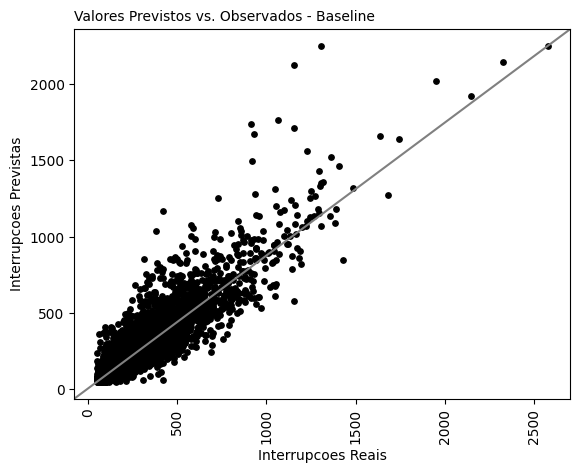

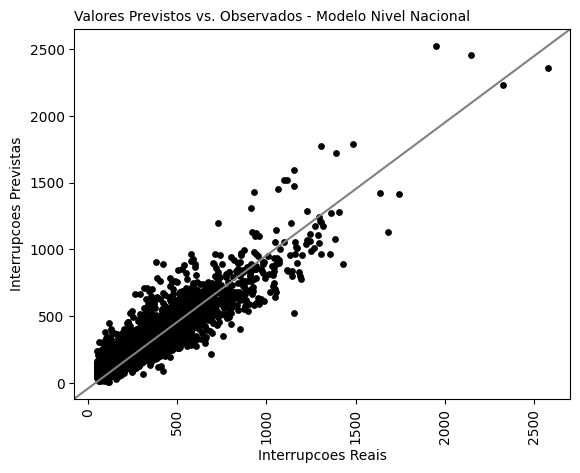

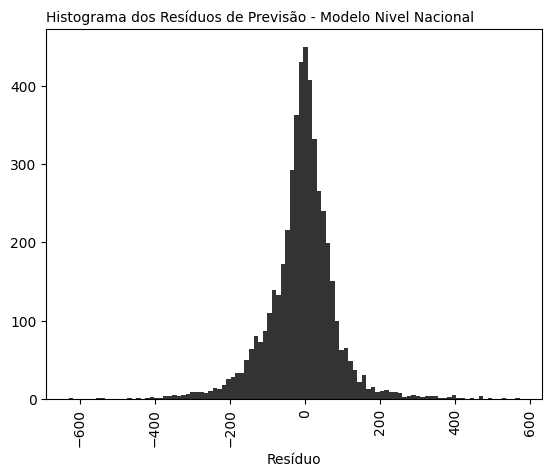

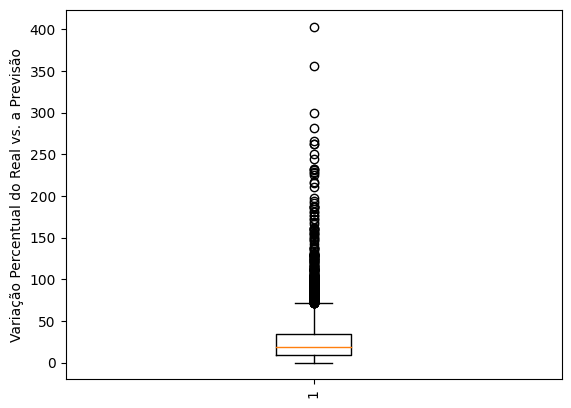

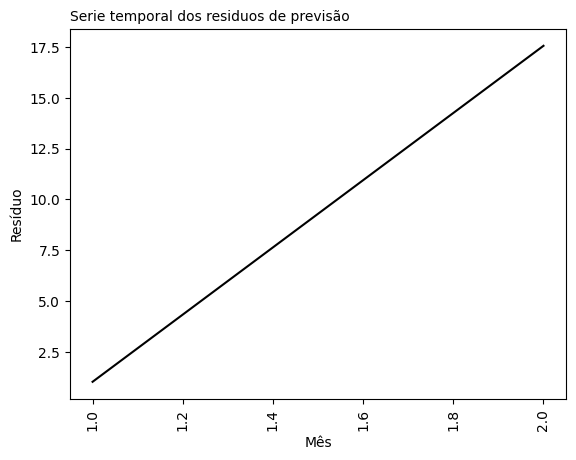

In [ ]:
baseline(modeling_df)
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df)
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test, "Modelo Nivel Nacional")

In [ ]:
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]

## 3.2.1 - Aplica o Modelo para Energisa Sergipe

Quantidade de Conjuntos Energisa SE 31
baseline metrics R2, MAPE and MSE 0.6964308627356608 17.882835329466257 1823.7623456790122
Qtd de Registros de Treino Qtd de Registros de Teste 57033 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2687 27
Assimetria - Skew: -0.5192000089447167
13.121272796066958
R2 0.7905266152249153 MAPE 14.999512871661214 MSE 1258.46018148436


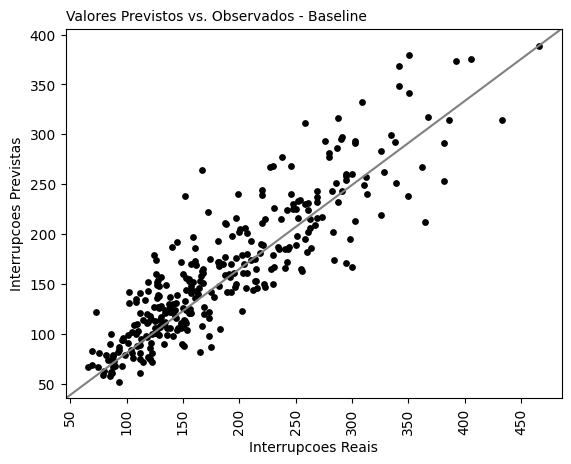

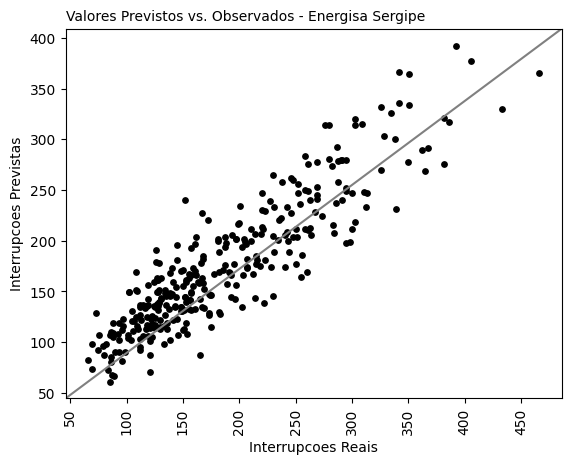

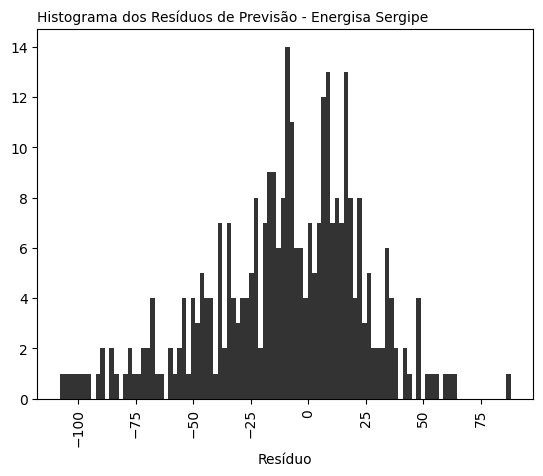

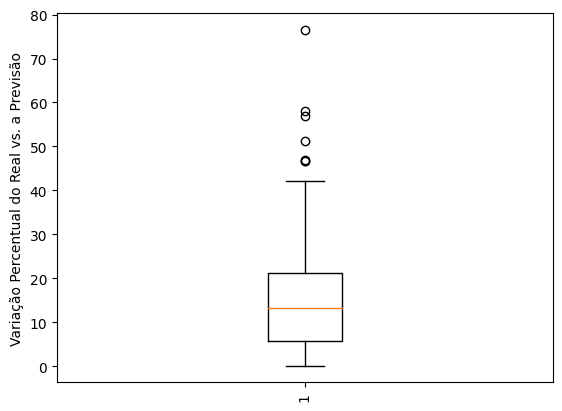

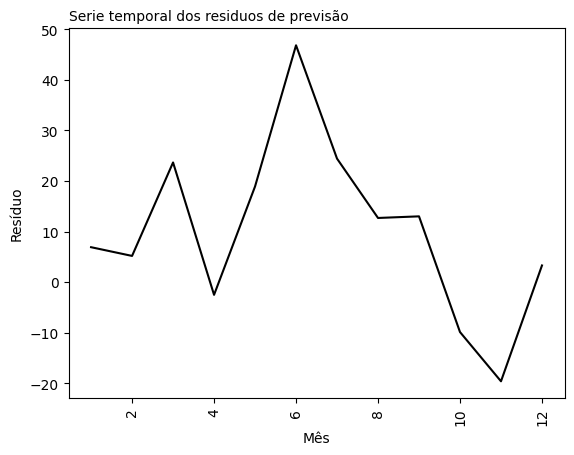

In [ ]:
baseline(modeling_df, separe_type='energisa_se')
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='energisa_se')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test, "Energisa Sergipe")

## 3.2.1 Aplica o modelo para Distribuidora Light

Quantidade de Conjuntos Light 107
baseline metrics R2, MAPE and MSE 0.7253604925773339 23.762264603195284 6734.980088495575
Qtd de Registros de Treino Qtd de Registros de Teste 55882 904
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2636 78
Assimetria - Skew: -1.2914196829625697
17.975844242587428
R2 0.7804952376267374 MAPE 26.256344160853573 MSE 5382.911649483489


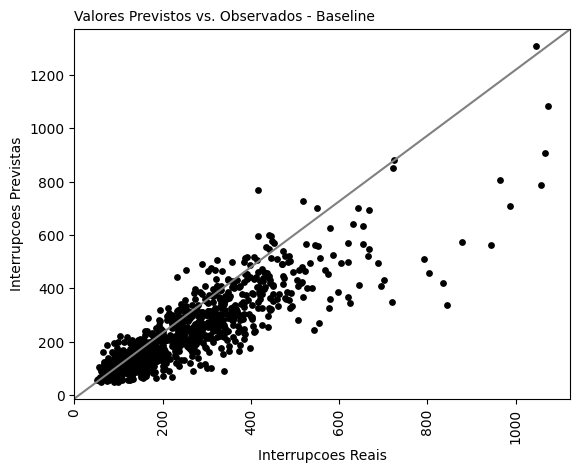

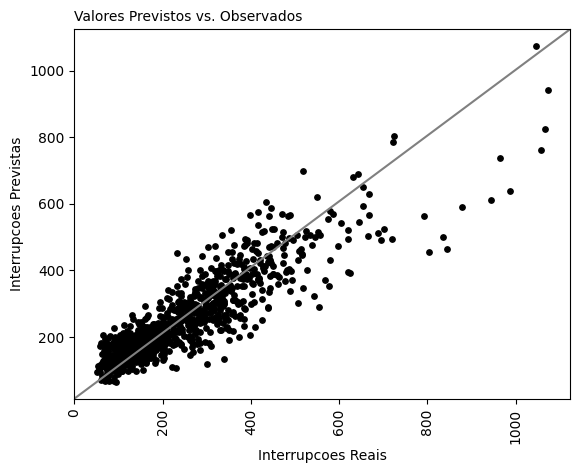

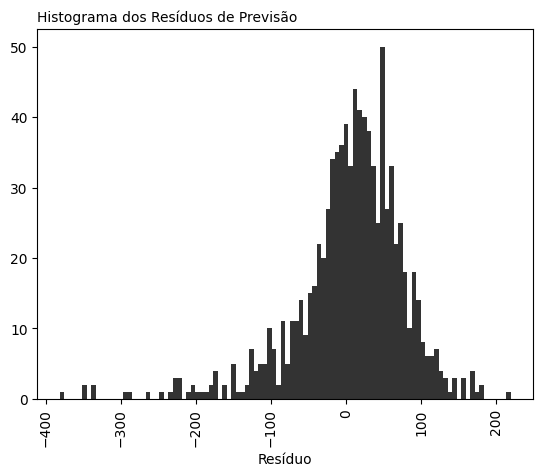

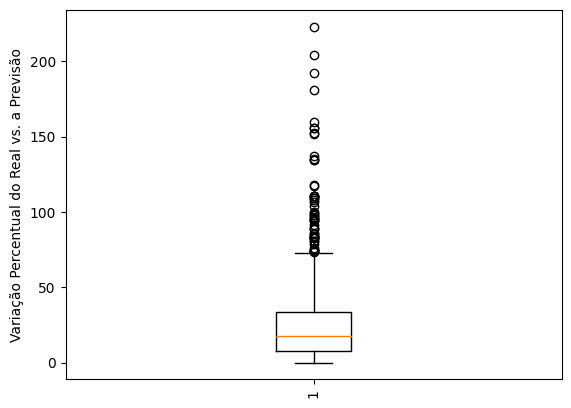

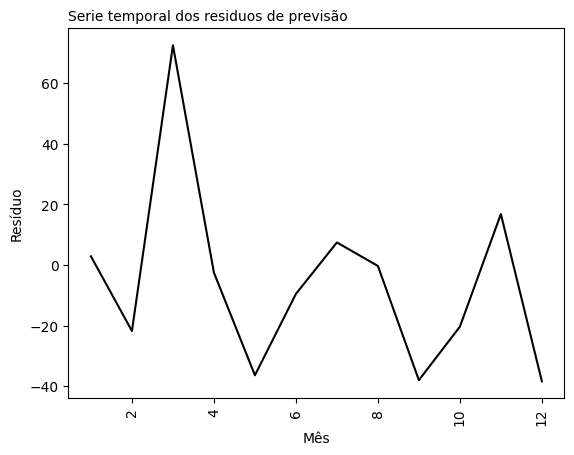

In [ ]:
baseline(modeling_df, separe_type='light')
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='light')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

In [ ]:
y_test.sort_values(by='percent_error', ascending=False).head(60)

FLAG_INTERRUPCOES         y_p  \
year_month DscConjUndConsumidoras                                     
202209     LEOPOLDO AEREO                            64  206.744409   
           RIO COMPRIDO AEREO                        60  182.392821   
           ALDEIA CAMPISTA                           59  172.231875   
202210     RIO COMPRIDO AEREO                        69  194.045072   
           URUGUAI AEREO                             75  194.767541   
202212     URUGUAI AEREO                             89  227.682512   
           JARDIM BOTANICO AEREO                     66  168.784499   
           ALDEIA CAMPISTA                           72  181.501160   
202202     RIO COMPRIDO AEREO                        80  201.140038   
202212     ZONA INDUSTRIAL                           74  175.308802   
202209     URUGUAI AEREO                             76  178.712859   
202208     ALDEIA CAMPISTA                           63  147.768999   
202202     ALDEIA CAMPISTA                           67  157.126536   
202210     ALDEIA CAMPISTA                           77  167.673105   
202209     FREI CANECA AEREO                         92  199.916848   
202210     JARDIM BOTANICO AEREO                     73  153.710507   
202204     URUGUAI AEREO                            112  235.734737   
202209     ROCHA FREIRE AEREO MT/MT                  69  145.227034   
202202     URUGUAI AEREO                             89  187.170282   
202201     ALDEIA CAMPISTA                           87  182.289613   
202209     TRIAGEM AEREO                             54  113.088159   
           VILAR DOS TELES AEREO                     85  176.702650   
202202     JARDIM BOTANICO AEREO                     75  154.927222   
           CACHAMBI AEREO                           130  265.006640   
202211     CAMPO MARTE AEREO                         57  114.151375   
202203     CAMPO MARTE AEREO                         64  127.588150   
202204     SANTA CECILIA AEREO AT/MT                 97  192.252540   
202210     ZONA INDUSTRIAL                           66  130.713509   
202205     SAO JOAO                                 104  204.405491   
202212     LEOPOLDO AEREO                           102  199.975125   
202201     BAEPENDI AEREO                            62  121.200831   
202206     ITAPEBA AEREO URBANO                      88  171.538826   
202212     TAQUARA AEREO                            232  451.565546   
202203     SANTA CECILIA AEREO AT/MT                109  211.372807   
202212     RIO COMPRIDO AEREO                       132  252.785232   
202202     LEOPOLDO AEREO                            96  182.073131   
202205     VILAR DOS TELES AEREO                     99  186.926149   
202211     RIO COMPRIDO AEREO                        97  182.979959   
           LEOPOLDO AEREO                            87  161.801246   
202212     BAEPENDI AEREO                            51   94.585386   
202208     BAEPENDI AEREO                            58  106.805543   
           RIO COMPRIDO AEREO                       103  189.472190   
202209     BOCA DO MATO AEREO                       127  232.793768   
202206     ROCHA FREIRE AEREO MT/MT                  56  102.566963   
202209     CACHAMBI AEREO                           160  292.469735   
202206     LEOPOLDO AEREO                            76  138.876901   
202201     JARDIM BOTANICO AEREO                     92  168.090602   
202202     CAMPO MARTE AEREO                         68  122.959573   
202212     MERITI                                   120  216.479742   
202210     CAMPO MARTE AEREO                         69  123.134940   
202211     ALDEIA CAMPISTA                           96  169.219697   
202210     FREI CANECA AEREO                        119  207.988782   
202212     ITAPEBA AEREO URBANO                     120  209.374950   
202210     ROCHA FREIRE AEREO MT/MT                  95  165.637381   
202206     SANTA CECILIA AEREO AT/MT                 69  120.1

## 3.2.1 Aplica o modelo para Distribuidora Cemig

Quantidade de Conjuntos cemig 295
baseline metrics R2, MAPE and MSE 0.7664632694876212 22.095344476244204 7658.612452720396
Qtd de Registros de Treino Qtd de Registros de Teste 50849 3437
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2422 292
Assimetria - Skew: -0.9114481708111418
17.449048293785523
R2 0.8113461603345129 MAPE 20.469934079654507 MSE 6186.721217453342


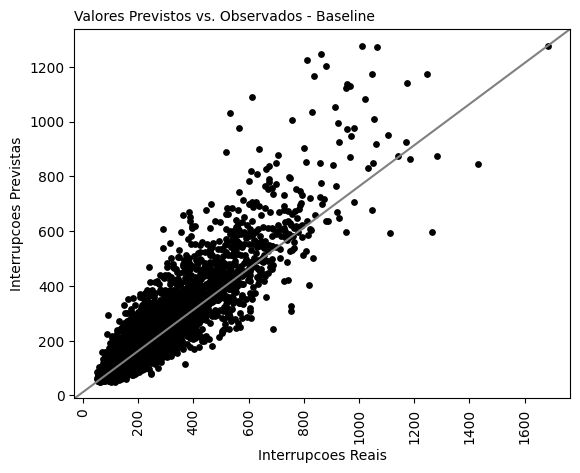

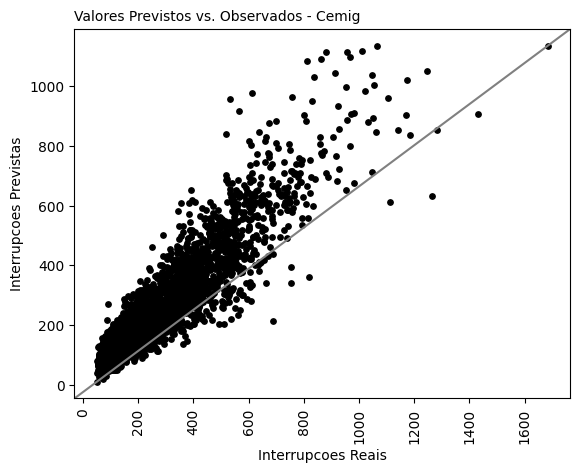

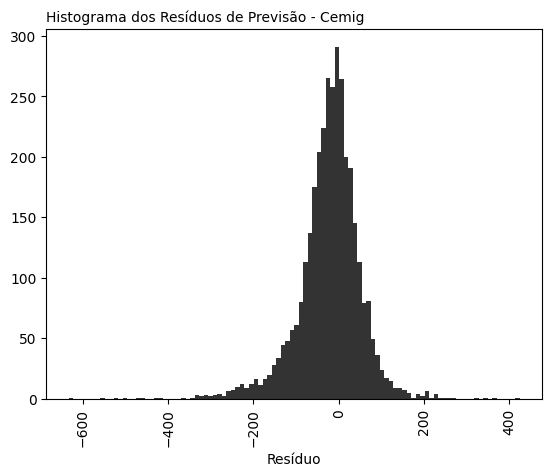

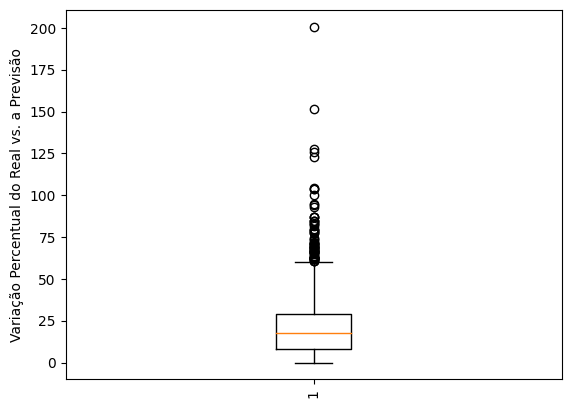

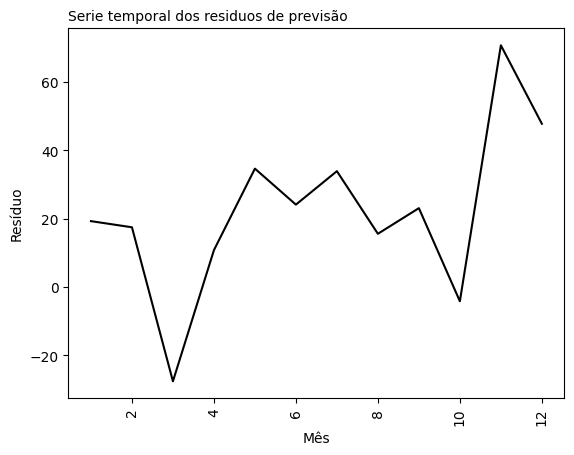

In [ ]:
baseline(modeling_df, separe_type='cemig')
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='cemig')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test, "Cemig")

In [ ]:
y_test.sort_values(by='percent_error', ascending=False).head(20)

,,FLAG_INTERRUPCOES,y_p,error,percent_error
year_month,DscConjUndConsumidoras,,,,
202203,Campanário,90,270.686054,-180.686054,200.762282
202204,Jordânia,87,218.876136,-131.876136,151.581765
202210,Carlos Chagas 2,57,129.856069,-72.856069,127.817665
202201,Nova Lima 7,56,126.512645,-70.512645,125.915437
202210,Carmo da Mata,70,156.167030,-86.167030,123.095757
202204,Frei Inocêncio,72,147.276720,-75.276720,104.551000
202210,Martinho Campos,80,163.056796,-83.056796,103.820995
202204,Rio do Prado,88,179.073631,-91.073631,103.492763
202201,Centralina,68,135.920547,-67.920547,99.883158


## 3.2.1 Aplica o modelo para Distribuidora Copel

Quantidade de Conjuntos copel 157
baseline metrics R2, MAPE and MSE 0.6370492964141437 28.6534860150174 26364.889204545456
Qtd de Registros de Treino Qtd de Registros de Teste 54837 1408
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2586 128
Assimetria - Skew: -1.1372528470745853
22.795858451142777
R2 0.7400205135185745 MAPE 27.175190565156104 MSE 18885.01741095539


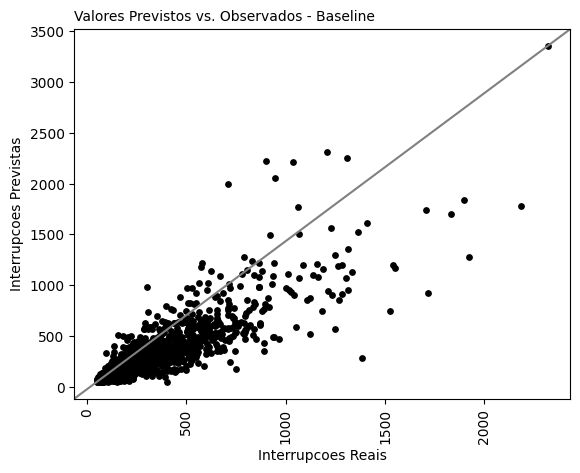

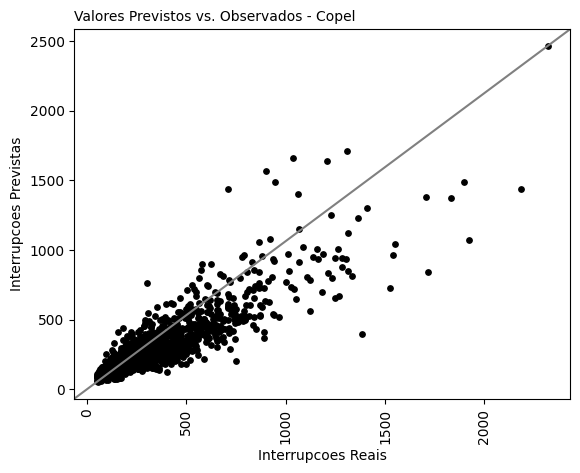

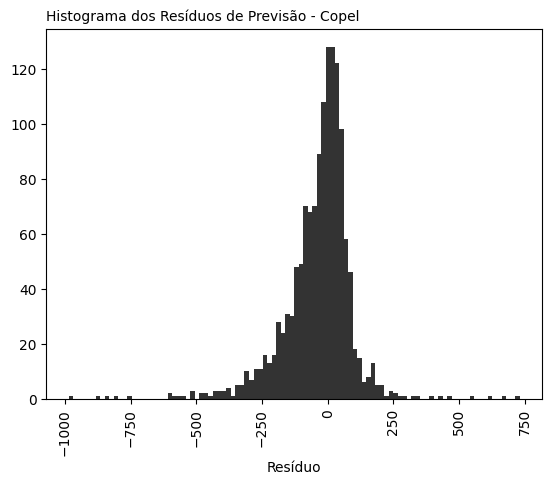

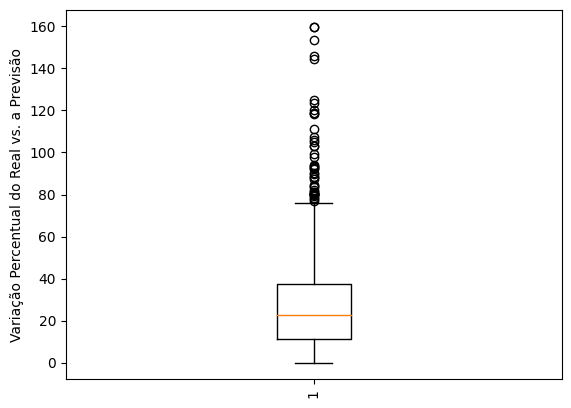

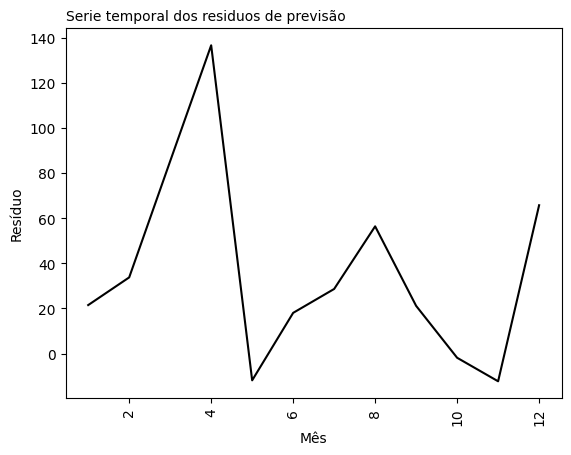

In [ ]:
baseline(modeling_df, separe_type='copel')
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='copel')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test, "Copel")

## 3.2.1 Aplica o modelo para Distribuidora cpfl

Quantidade de Conjuntos cpfl 179
baseline metrics R2, MAPE and MSE 0.3278007907098085 26.92775758633732 5454.952498762988
Qtd de Registros de Treino Qtd de Registros de Teste 53698 2021
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2536 178
Assimetria - Skew: -1.3248386270956434
21.983742728169425
R2 0.42270987189657805 MAPE 26.485456596346385 MSE 4684.757410134784


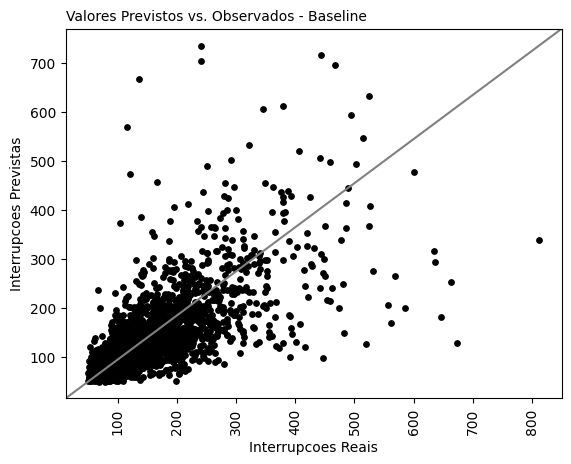

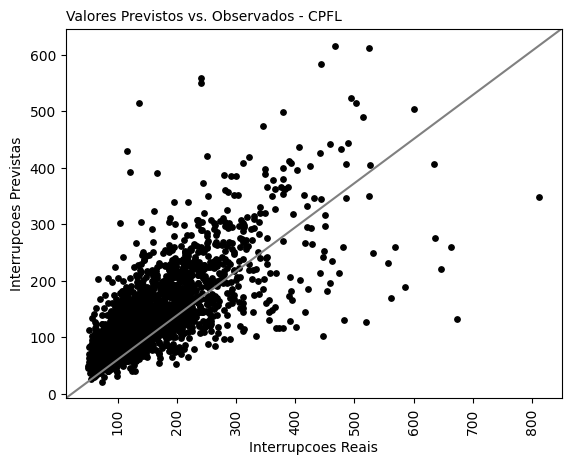

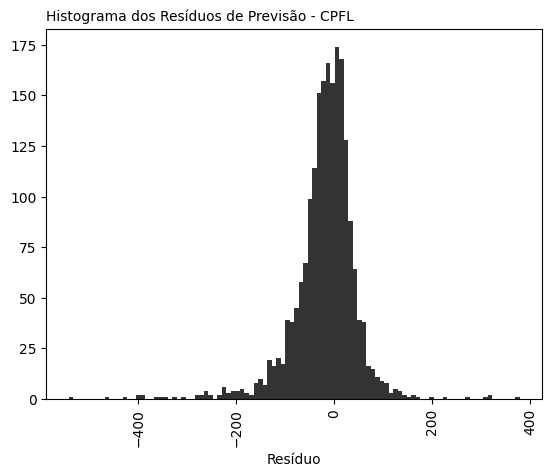

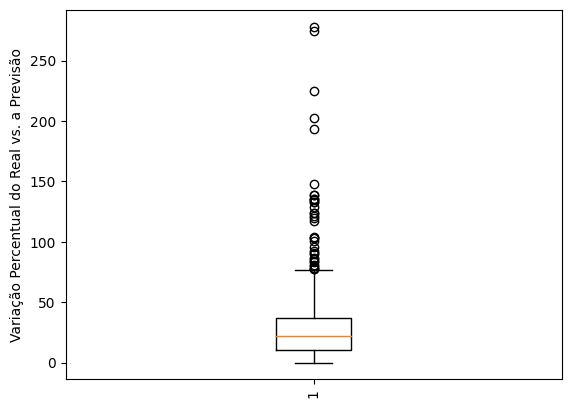

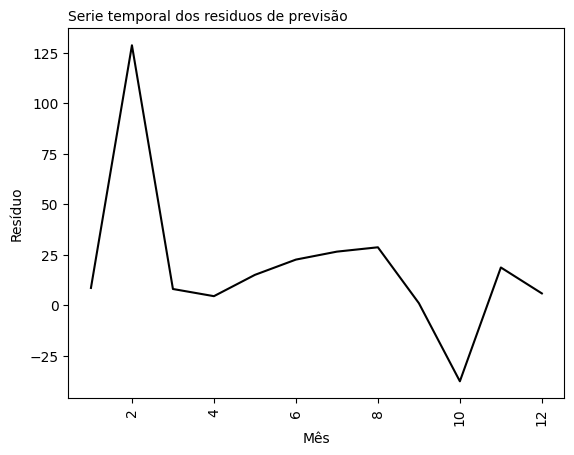

In [ ]:
baseline(modeling_df, separe_type='cpfl')
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='cpfl')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test, "CPFL")

## 3.2.1 - Aplica o modelo para o conjunto dividido por clusters

Qtd de Registros de Treino Qtd de Registros de Teste 12340 1161
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 618 591
Assimetria - Skew: 9.99711251759395
19.456117123252533
R2 0.6347944023934553 MAPE 26.285611243175033 MSE 10817.207387016699
Qtd de Registros de Treino Qtd de Registros de Teste 17656 1728
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 898 878
Assimetria - Skew: -0.35173448143680985
18.63350022260846
R2 0.7029692710684513 MAPE 26.83914784522412 MSE 6144.859521498711
Qtd de Registros de Treino Qtd de Registros de Teste 4080 376
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 190 188
Assimetria - Skew: 0.41349513345066713
15.657922801880336
R2 0.5847632009300077 MAPE 20.917569270770272 MSE 36390.70878320718


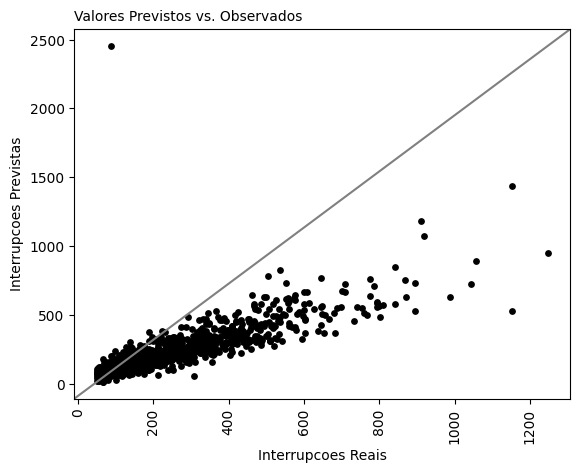

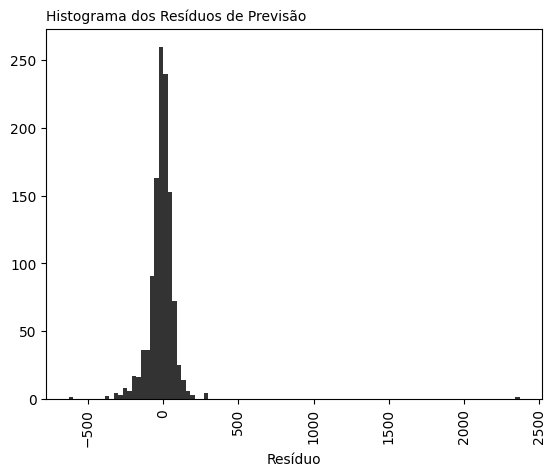

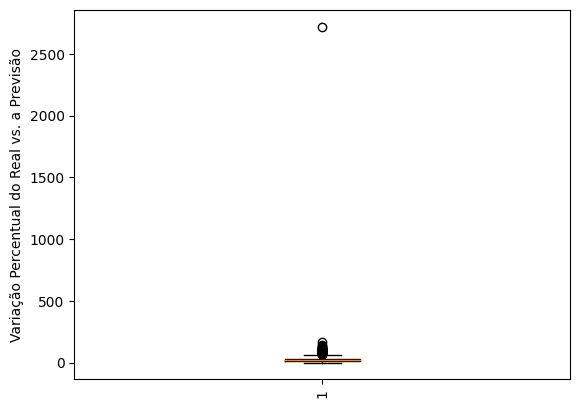

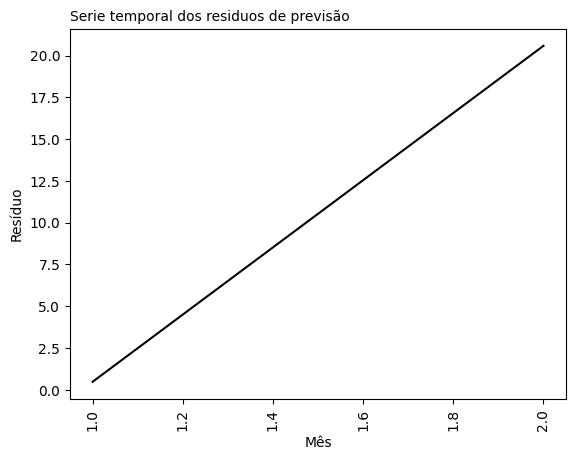

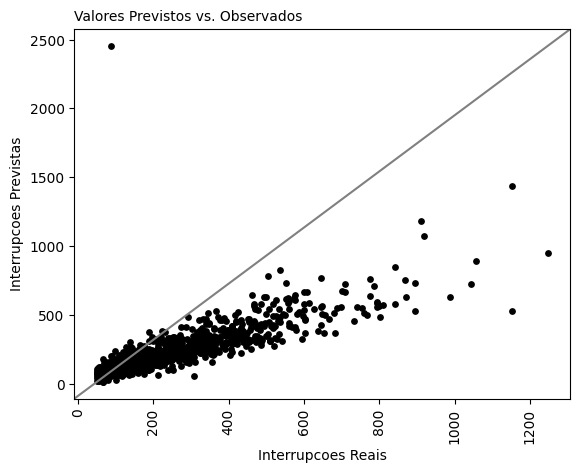

...

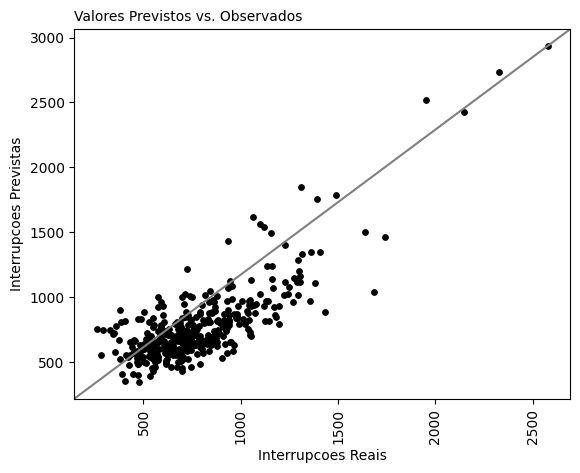

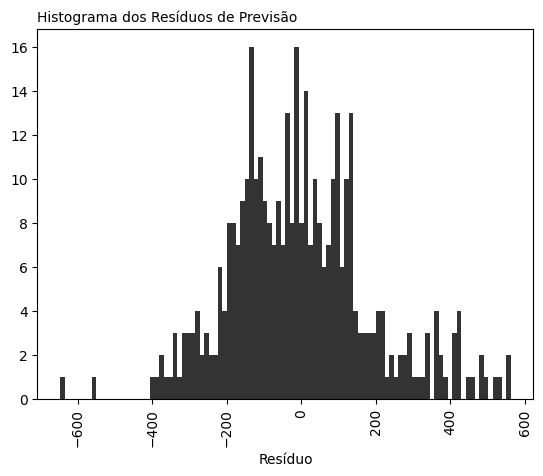

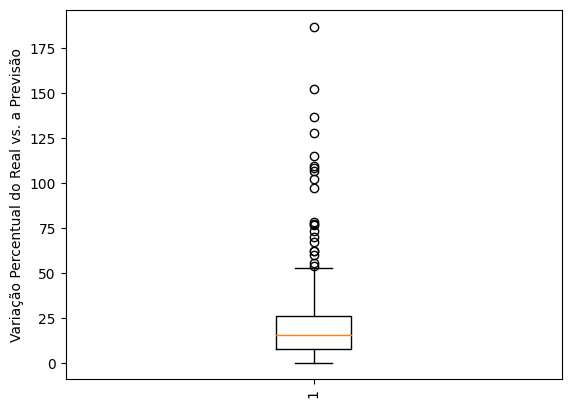

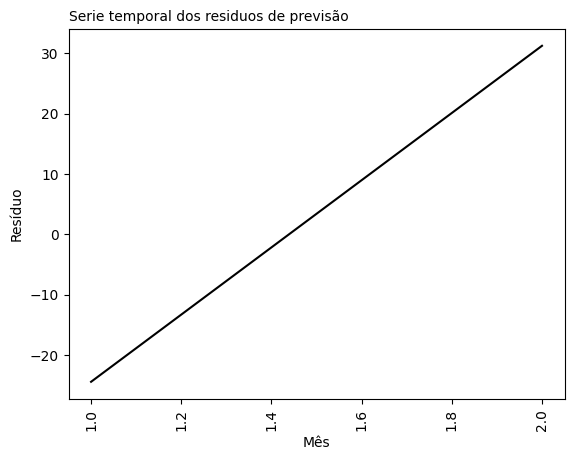

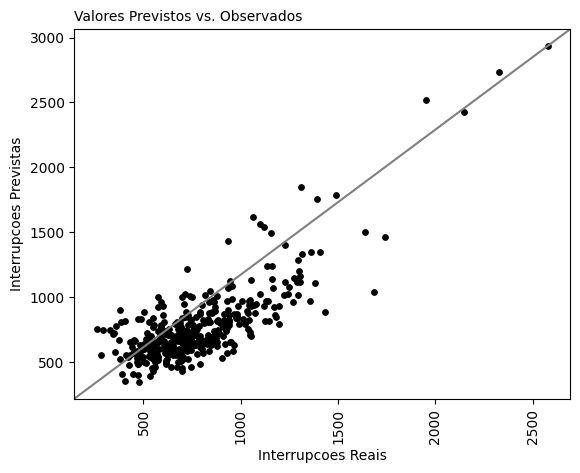

In [ ]:
for cluster_df in modeling_clusters_df:

  try:
    model, X_train, X_test, y_train, y_test = sep_train_test(cluster_df)
    y_test = inference(X_test, y_test)
    real_predict_plot(y_test)
  except:
    pass
    print("train fail")

### 3.2.1 -  Estatistica F - Teste de hipotese realizado para o modelo

O teste F é um teste estatística que avalia a variancia entre distribuições. Ele pode ser utilizada em diversas aplicações. E uma delas é o teste se um modelo se ajusta aos dados.

In [ ]:
from scipy.stats import ttest_ind

O teste é aplicado em conjunto do o teste realizado com a estatística T. Foi escolhida esta forma de aplicação dado que a biblioteca utilizada faz a geração de um relatório completo que contém tanto a estatística T, quanto F.

### 3.2.2 - Selecao de Variaveis - Test T de Student to analyze the p-value to each variable
Após aplicada a estatistica F é então aplicado o Teste T para verificar a relevancia de cada uma das variaveis para o modelo.

É importante que, após a aplicado do teste T, seja recriado o modelo com as variáveis que foram selecionadas e avaliada a estatística F novamente. Este processo de aplicação da estatística T e F é feito recursivamente até que não se tenha nenhuma variável a ser retirada no teste T.

### Modelo a Nível Nacional

In [ ]:
number_drop_variables = None
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df)
selected_variables = X_train.columns

while number_drop_variables != 0:

  X = X_train[selected_variables]
  y = y_train

  X2 = sm.add_constant(X)
  est = sm.OLS(y, X2)
  est2 = est.fit()
  print(est2.summary())

  ols_sumary = pd.DataFrame(est2.summary().tables[1].data[1:], columns=est2.summary().tables[1].data[0])
  ols_sumary["P>|t|"] = ols_sumary["P>|t|"].astype('float')
  print("Quantidade de variaveis antes e apos a selecao")
  print(ols_sumary.shape[0] - 1, ols_sumary[ols_sumary["P>|t|"] < 0.05].shape[0] - 1)
  selected_variables = ols_sumary[ols_sumary["P>|t|"] < 0.05][''].iloc[1:].values
  selected_variables

  # Create a new variable containing the number of variables that was droped in the feature selection
  number_drop_variables = len(X.columns) - len(selected_variables)
  print("quantidade de variaveis retirados do estimador", number_drop_variables)

print("Lista de variaveis selecionadas")
for attr in selected_variables:
  print(attr)

Qtd de Registros de Treino Qtd de Registros de Teste 52702 4978
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2703 2535
                            OLS Regression Results                            
Dep. Variable:      FLAG_INTERRUPCOES   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     2036.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):               0.00
Time:                        03:01:53   Log-Likelihood:            -3.1107e+05
No. Observations:               52702   AIC:                         6.224e+05
Df Residuals:                   52597   BIC:                         6.233e+05
Df Model:                         104                                         
Covariance Type:            nonrobust                                         
                                                                                   

baseline metrics R2, MAPE and MSE 0.7877525247136624 25.583380812853324 10035.313981518682
Qtd de Registros de Treino Qtd de Registros de Teste 52702 4978
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2703 2535
Assimetria - Skew: -0.10735315189611598
18.869101426646246
R2 0.8242761134866605 MAPE 26.604812933905777 MSE 8308.435107815067


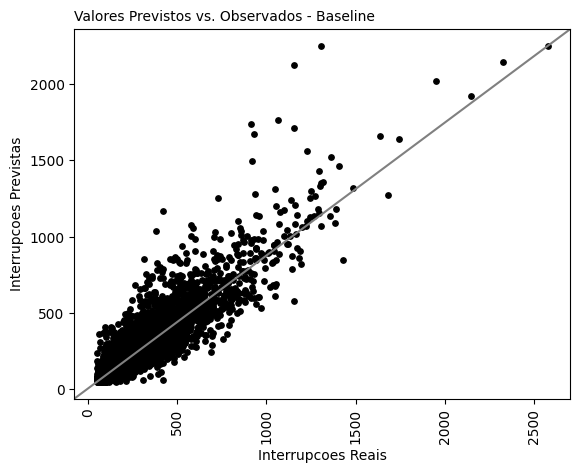

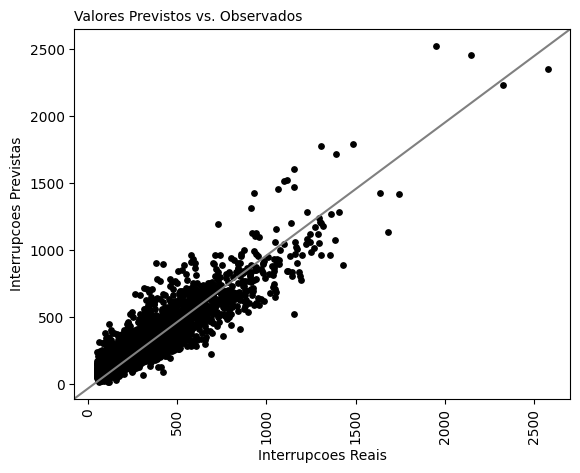

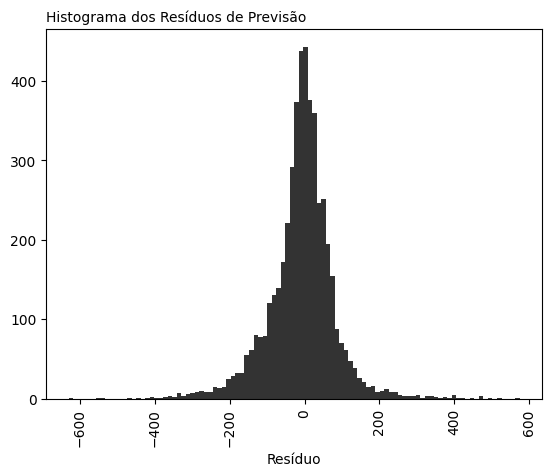

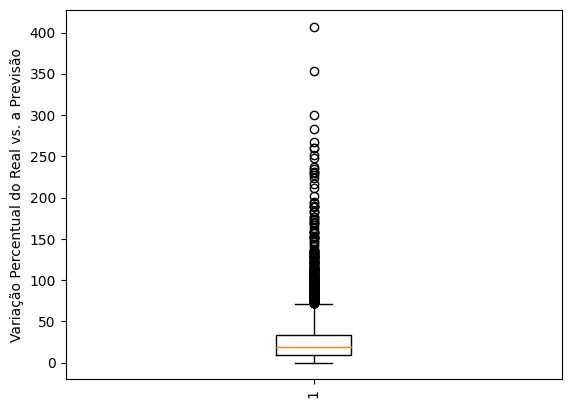

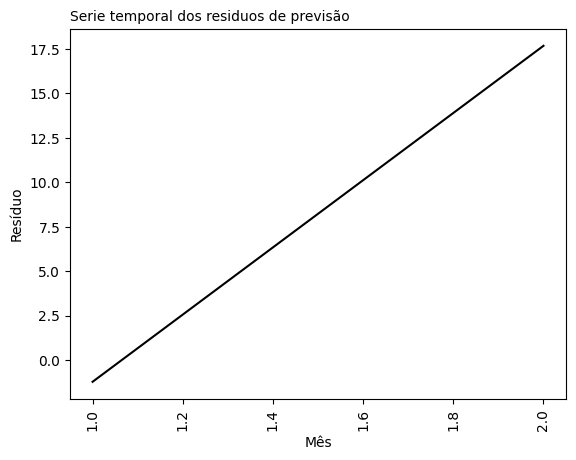

In [ ]:
baseline(modeling_df)
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df[np.append(selected_variables, label)])
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

### Energisa SE

In [ ]:
number_drop_variables = None
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='energisa_se')
selected_variables = X_train.columns

while number_drop_variables != 0:

  X = X_train[selected_variables]
  y = y_train

  X2 = sm.add_constant(X)
  est = sm.OLS(y, X2)
  est2 = est.fit()
  print(est2.summary())

  ols_sumary = pd.DataFrame(est2.summary().tables[1].data[1:], columns=est2.summary().tables[1].data[0])
  ols_sumary["P>|t|"] = ols_sumary["P>|t|"].astype('float')
  print("Quantidade de variaveis antes e apos a selecao")
  print(ols_sumary.shape[0] - 1, ols_sumary[ols_sumary["P>|t|"] < 0.05].shape[0] - 1)
  selected_variables = ols_sumary[ols_sumary["P>|t|"] < 0.05][''].iloc[1:].values
  selected_variables

  # Create a new variable containing the number of variables that was droped in the feature selection
  number_drop_variables = len(X.columns) - len(selected_variables)
  print("quantidade de variaveis retirados do estimador", number_drop_variables)

print("Lista de variaveis selecionadas")
for attr in selected_variables:
  print(attr)
df = pd.DataFrame(selected_variables)
df.to_excel(base_path + '/Ordens_servico/selected_variables_energisa_se.xlsx')

Qtd de Registros de Treino Qtd de Registros de Teste 57033 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2687 27
                            OLS Regression Results                            
Dep. Variable:      FLAG_INTERRUPCOES   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     2229.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):               0.00
Time:                        03:45:58   Log-Likelihood:            -3.3695e+05
No. Observations:               57033   AIC:                         6.741e+05
Df Residuals:                   56927   BIC:                         6.751e+05
Df Model:                         105                                         
Covariance Type:            nonrobust                                         
                                                                                      

Qtd de Registros de Treino Qtd de Registros de Teste 57033 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2687 27
Assimetria - Skew: -0.49473974409196897
13.053292708484733
R2 0.7819323525710977 MAPE 14.98123070132066 MSE 1310.0922174619157


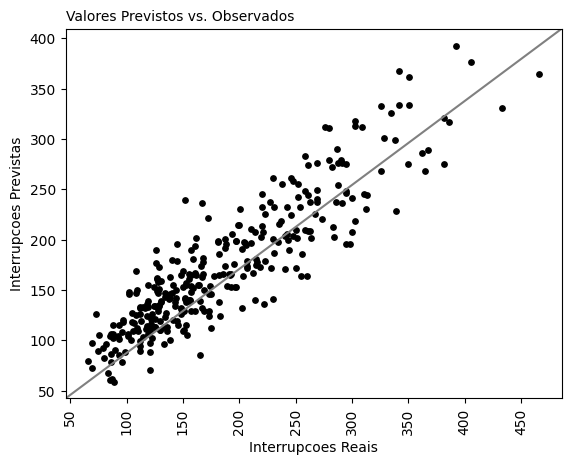

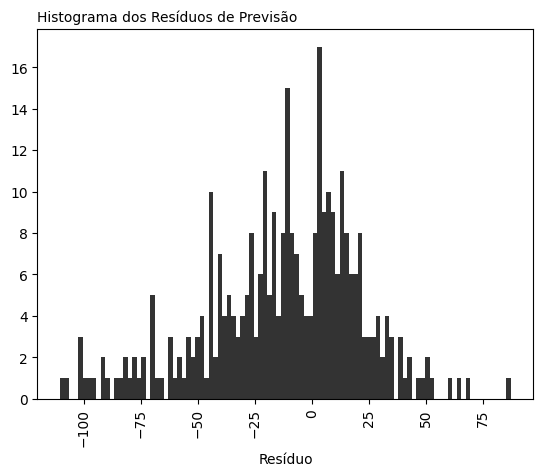

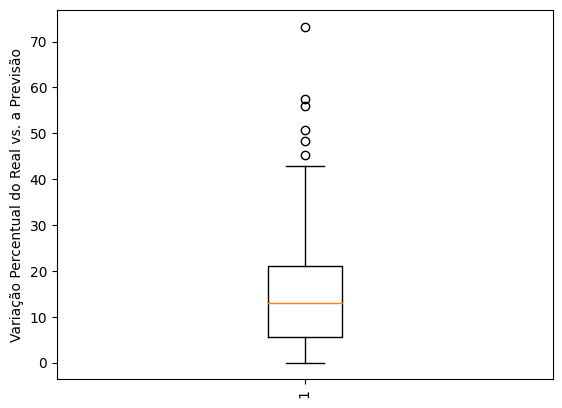

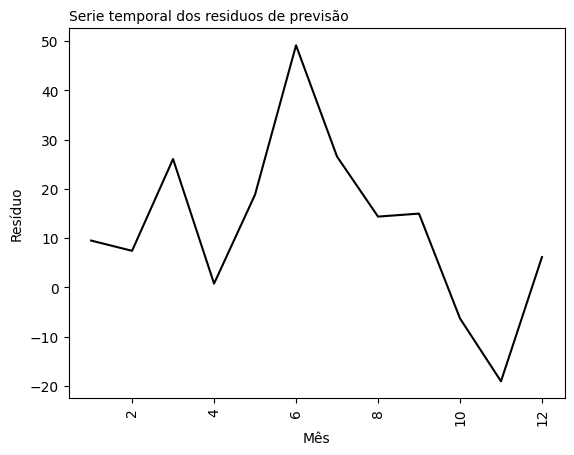

In [ ]:
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df[np.append(selected_variables, label)], separe_type='energisa_se')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

### Cemig

In [ ]:
number_drop_variables = None
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='cemig')
selected_variables = X_train.columns

while number_drop_variables != 0:

  X = X_train[selected_variables]
  y = y_train

  X2 = sm.add_constant(X)
  est = sm.OLS(y, X2)
  est2 = est.fit()
  print(est2.summary())

  ols_sumary = pd.DataFrame(est2.summary().tables[1].data[1:], columns=est2.summary().tables[1].data[0])
  ols_sumary["P>|t|"] = ols_sumary["P>|t|"].astype('float')
  print("Quantidade de variaveis antes e apos a selecao")
  print(ols_sumary.shape[0] - 1, ols_sumary[ols_sumary["P>|t|"] < 0.05].shape[0] -1)
  selected_variables = ols_sumary[ols_sumary["P>|t|"] < 0.05][''].iloc[1:].values
  selected_variables

  # Create a new variable containing the number of variables that was droped in the feature selection
  number_drop_variables = len(X.columns) - len(selected_variables)
  print("quantidade de variaveis retirados do estimador", number_drop_variables)

print("Lista de variaveis selecionadas")
for attr in selected_variables:
  print(attr)
df = pd.DataFrame(selected_variables)
df.to_excel(base_path + '/Ordens_servico/selected_variables_cemig.xlsx')

Qtd de Registros de Treino Qtd de Registros de Teste 50849 3437
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2422 292
                            OLS Regression Results                            
Dep. Variable:      FLAG_INTERRUPCOES   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     1959.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):               0.00
Time:                        03:46:19   Log-Likelihood:            -3.0126e+05
No. Observations:               50849   AIC:                         6.027e+05
Df Residuals:                   50743   BIC:                         6.037e+05
Df Model:                         105                                         
Covariance Type:            nonrobust                                         
                                                                                    

Qtd de Registros de Treino Qtd de Registros de Teste 50849 3437
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2422 292
Assimetria - Skew: -0.922687858509802
16.654235974784612
R2 0.8184187357911951 MAPE 20.27100637098146 MSE 5954.7829080212005


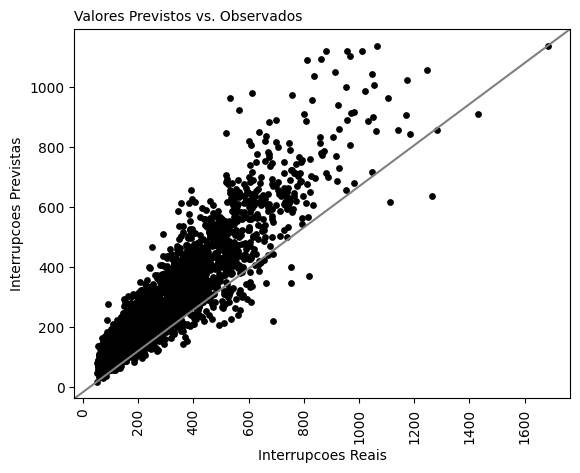

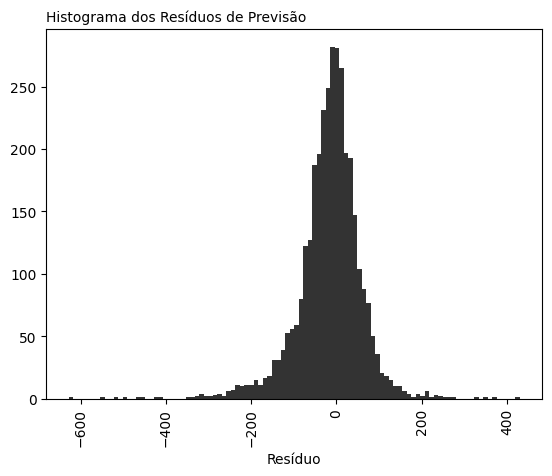

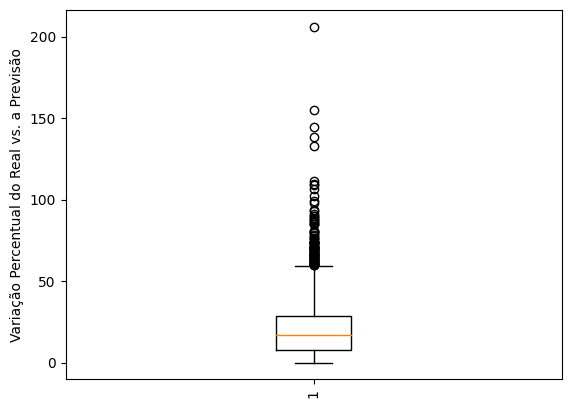

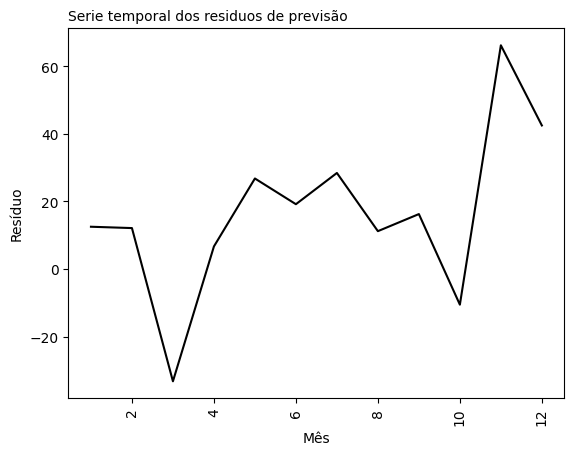

In [ ]:
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df[np.append(selected_variables, label)], separe_type='cemig')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

### Copel

In [ ]:
number_drop_variables = None
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='copel')
selected_variables = X_train.columns

while number_drop_variables != 0:

  X = X_train[selected_variables]
  y = y_train

  X2 = sm.add_constant(X)
  est = sm.OLS(y, X2)
  est2 = est.fit()
  print(est2.summary())

  ols_sumary = pd.DataFrame(est2.summary().tables[1].data[1:], columns=est2.summary().tables[1].data[0])
  ols_sumary["P>|t|"] = ols_sumary["P>|t|"].astype('float')
  print("Quantidade de variaveis antes e apos a selecao")
  print(ols_sumary.shape[0] - 1, ols_sumary[ols_sumary["P>|t|"] < 0.05].shape[0] - 1)
  selected_variables = ols_sumary[ols_sumary["P>|t|"] < 0.05][''].iloc[1:].values
  selected_variables

  # Create a new variable containing the number of variables that was droped in the feature selection
  number_drop_variables = len(X.columns) - len(selected_variables)
  print("quantidade de variaveis retirados do estimador", number_drop_variables)

print("Lista de variaveis selecionadas")
for attr in selected_variables:
  print(attr)
df = pd.DataFrame(selected_variables)
df.to_excel(base_path + '/Ordens_servico/selected_variables_copel.xlsx')

Qtd de Registros de Treino Qtd de Registros de Teste 54837 1408
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2586 128
                            OLS Regression Results                            
Dep. Variable:      FLAG_INTERRUPCOES   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     2241.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):               0.00
Time:                        03:46:37   Log-Likelihood:            -3.2091e+05
No. Observations:               54837   AIC:                         6.420e+05
Df Residuals:                   54731   BIC:                         6.430e+05
Df Model:                         105                                         
Covariance Type:            nonrobust                                         
                                                                                    

Qtd de Registros de Treino Qtd de Registros de Teste 54837 1408
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2586 128
Assimetria - Skew: -1.1351680837860632
23.051165976103732
R2 0.7408767511189422 MAPE 27.322378735557606 MSE 18822.819957572796


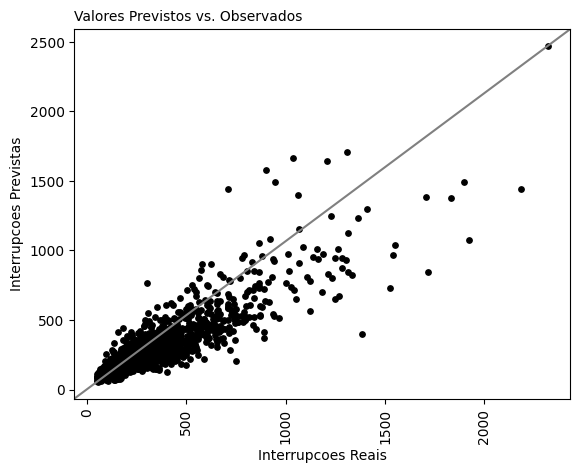

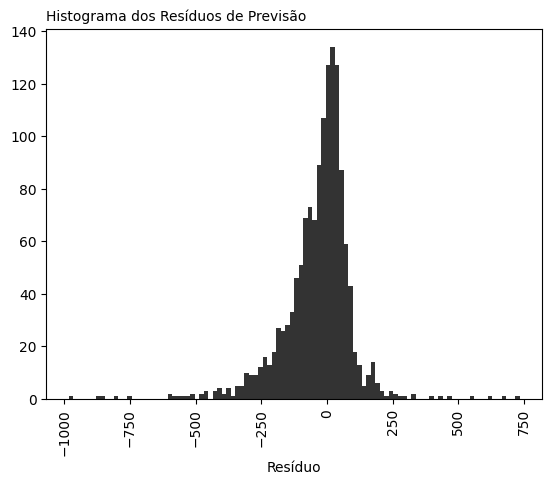

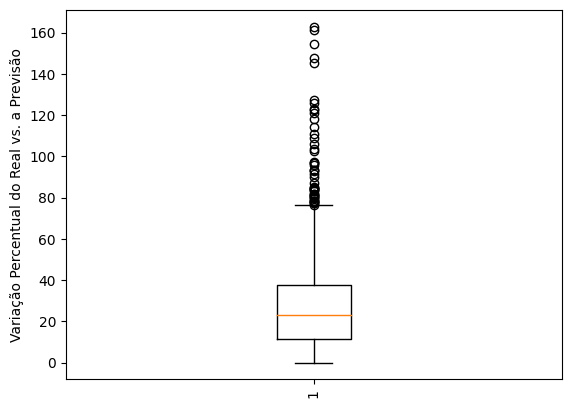

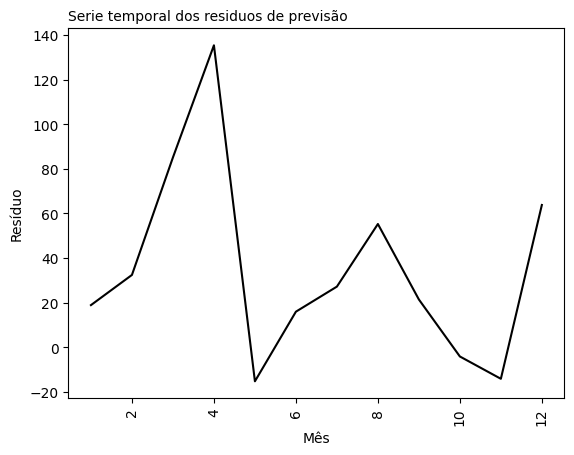

In [ ]:
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df[np.append(selected_variables, label)], separe_type='copel')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

### CPFL

In [ ]:
number_drop_variables = None
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df, separe_type='cpfl')
selected_variables = X_train.columns

while number_drop_variables != 0:

  X = X_train[selected_variables]
  y = y_train

  X2 = sm.add_constant(X)
  est = sm.OLS(y, X2)
  est2 = est.fit()
  print(est2.summary())

  ols_sumary = pd.DataFrame(est2.summary().tables[1].data[1:], columns=est2.summary().tables[1].data[0])
  ols_sumary["P>|t|"] = ols_sumary["P>|t|"].astype('float')
  print("Quantidade de variaveis antes e apos a selecao")
  print(ols_sumary.shape[0] - 1, ols_sumary[ols_sumary["P>|t|"] < 0.05].shape[0] - 1)
  selected_variables = ols_sumary[ols_sumary["P>|t|"] < 0.05][''].iloc[1:].values
  selected_variables

  # Create a new variable containing the number of variables that was droped in the feature selection
  number_drop_variables = len(X.columns) - len(selected_variables)
  print("quantidade de variaveis retirados do estimador", number_drop_variables)

print("Lista de variaveis selecionadas")
for attr in selected_variables:
  print(attr)
df = pd.DataFrame(selected_variables)
df.to_excel(base_path + '/Ordens_servico/selected_variables_cpfl.xlsx')

Qtd de Registros de Treino Qtd de Registros de Teste 53698 2021
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2536 178
                            OLS Regression Results                            
Dep. Variable:      FLAG_INTERRUPCOES   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     2120.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):               0.00
Time:                        03:46:52   Log-Likelihood:            -3.1796e+05
No. Observations:               53698   AIC:                         6.361e+05
Df Residuals:                   53592   BIC:                         6.371e+05
Df Model:                         105                                         
Covariance Type:            nonrobust                                         
                                                                                    

Qtd de Registros de Treino Qtd de Registros de Teste 53698 2021
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2536 178
Assimetria - Skew: -1.3184869293043406
22.078393214227738
R2 0.4291974463030047 MAPE 26.375550538567193 MSE 4632.110204172407


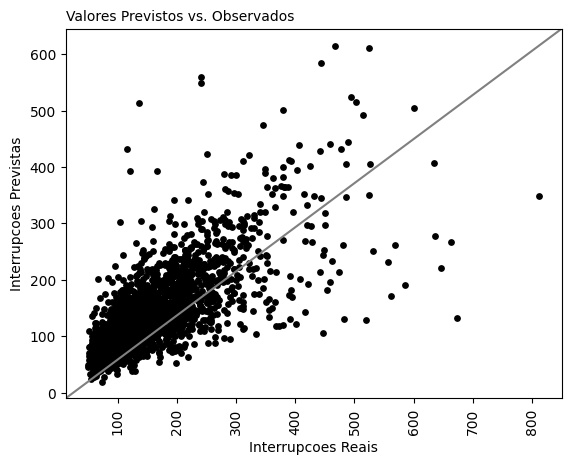

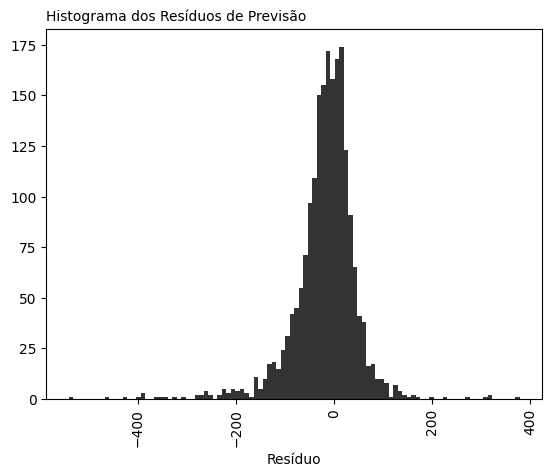

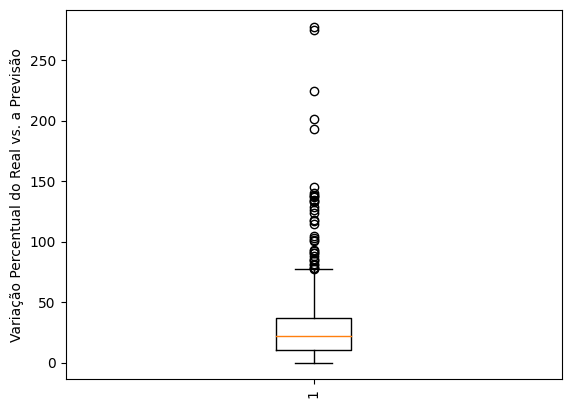

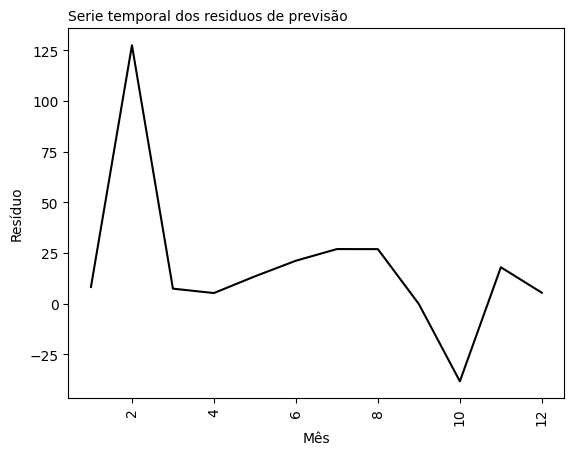

In [ ]:
model, X_train, X_test, y_train, y_test = sep_train_test(modeling_df[np.append(selected_variables, label)], separe_type='cpfl')
# Retorna os dados de volta da transformacao logaritmica
# y_test[label] = 10**y_test[label]
# y_test["y_p"] = 10**y_test["y_p"]
y_test = inference(X_test, y_test)

### 3.2.3 - Persistência do Resultado

In [ ]:
hour = datetime.datetime.now().strftime("%Y_%m_%d_%H")

In [ ]:
# Verifica a importancia de cada variavel na previsao, o modelo parece estar sobre ajustado pois os resultados foram acima do esperado para
# o modelo de regressao linear

feat_import_dic = {}
# Get feature_name and importance in a dict, and show
for feat, importance in zip(model.feature_names_in_, model.coef_):
  feat_import_dic[feat] =  importance

# Salva o dicionario de features importance em um excel
feat_import_df = pd.DataFrame(data=feat_import_dic, index=[0]).T.reset_index()
feat_import_df.columns = ["Feat", "Coef"]
feat_import_df.to_excel(base_path + "/Ordens_servico/feat_imp_linear_model_{}.xlsx".format(hour))

dict(sorted(feat_import_dic.items(), key=lambda item: item[1]))
# feat_import_dic

{'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': -433.05516750494263,
 'labels_3': -169.18214215719962,
 'veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Terras Baixas': -123.46825655446143,
 'labels_0': -100.14873344644565,
 'UF_BA': -47.76087880569657,
 'UF_PA': -37.99320128450776,
 'UF_RR': -31.943616368807717,
 'UF_SC': -31.576190677684053,
 'MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': -25.658259183443533,
 'veg_class_Savana Parque': -24.740427839908463,
 'UF_SP': -22.039145290049902,
 'veg_class_Savana-EstÃ©pica Florestada': -21.01768996504864,
 'UF_DF': -20.59582051729609,
 'veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Submontana': -20.357751871460916,
 'UF_PI': -19.524947594076167,
 'UF_MS': -16.205403178584618,
 'UF_AL': -15.1395846697392,
 'UF_RS': -14.372404763811815,
 'mes_6': -14.108983435223342,
 'UF_PR': -13.299954927638083,
 'mes_7': -11.691154237237964,
 'UF_RJ': -9.72517494821205,
 'UF_MA': -9.137922825328673,
 'UF_PE': -8.108171129391081,
 'INVERNO': -4.478807915033112,
 'OUTONO'

In [ ]:
# Persiste o modelo e os dados de previsao
# https://scikit-learn.org/stable/model_persistence.html - model persistence in sklearn

import pickle

with open(base_path + "/Ordens_servico/linear_model_{}.pk".format(hour), 'wb') as file:

  pickle.dump(model, file)

test = X_test.join(y_test)
test.to_csv(base_path + "/Ordens_servico/linear_model_test_data_{}.csv".format(hour))

### 3.2.4 - Verificacao erro por conjunto da Energisa Sergipe

Apos realizar a estimacao, e ter as informacoes de previsao para os dados de teste. Verfica o resultado para cada conjunto (em separado) da distribuidora Energisa Sergipe

In [ ]:
# Include the X_test last year interruptions in the dataset to check the error to this mensure to
y_test["FLAG_INTERRUPCOES_SET_LAST_YEAR"] = X_test["FLAG_INTERRUPCOES_SET_LAST_YEAR"]

In [ ]:
conjuntos  = np.unique(test_set_json['conjuntos'])  # Unique sets
sheet_results = {}

for conjunto in conjuntos:
  y_test_c = y_test[y_test.index.get_level_values(1) == conjunto]
  print(conjunto)
  try:
    print(MAPE(y_test_c["FLAG_INTERRUPCOES"], y_test_c["y_p"]))
    print(r2_score(y_test_c["FLAG_INTERRUPCOES"], y_test_c["y_p"]))
    print(MAPE(y_test_c["FLAG_INTERRUPCOES"], y_test_c["FLAG_INTERRUPCOES_SET_LAST_YEAR"]))
    sheet_results[conjunto] = (MAPE(y_test_c["FLAG_INTERRUPCOES"], y_test_c["y_p"]), r2_score(y_test_c["FLAG_INTERRUPCOES"], y_test_c["y_p"]), MAPE(y_test_c["FLAG_INTERRUPCOES"], y_test_c["FLAG_INTERRUPCOES_SET_LAST_YEAR"]))
  except Exception:
    print("Not finded info to set:", conjunto)
    pass


ARACAJU
9.219400283214801
-1.5350526709708188
20.818970559821658
ATALAIA
12.085522965195137
0.4332621908859319
9.618362947363158
CABRITA
18.476945117163094
-4.732842082449106
21.94059970316359
CAJAÍBA
15.28258920129846
-0.46216162388242665
15.662813378236315
CARMÓPOLIS
31.24292617462131
-8.81082525990542
17.622835923767102
CARRAPICHO
11.150092163455517
-0.1485607892408889
22.392107642534707
CONTORNO
29.00976280379845
-10.346116839592868
17.94347361686108
FREI PAULO
8.779106910680493
0.2334441717502842
17.66548426586647
GRACCHO CARDOSO
13.866438795257604
-0.48281545683074434
18.583041693313618
GRAGERU
25.933974851920528
-3.855195466235327
16.792633868175912
ITABAIANA
nan
Not finded info to set: ITABAIANA
ITAPORANGA
nan
Not finded info to set: ITAPORANGA
LAGARTO
8.778526636788701
0.4786364371825209
10.014290000045529
MARUIM
9.00099001648021
0.42424649993365604
13.027921575048277
MOITA BONITA
17.13717951042763
-2.979309199891548
21.31026073589071
MONTE ALEGRE
22.728682619470465
-0.4351325

<ipython-input-62-668816cbd008>:4: RuntimeWarning:

invalid value encountered in double_scalars

<ipython-input-62-668816cbd008>:4: RuntimeWarning:

invalid value encountered in double_scalars

<ipython-input-62-668816cbd008>:4: RuntimeWarning:

invalid value encountered in double_scalars

<ipython-input-62-668816cbd008>:4: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
energisa_sergipe_data = pd.DataFrame(sheet_results).T.rename(columns={0: 'MAPE', 1: "R2", 2: "MAPE BASELINE"})

,MAPE,R2,MAPE BASELINE
ATALAIA,12.085523,0.433262,9.618363
CARMÓPOLIS,31.242926,-8.810825,17.622836
CONTORNO,29.009763,-10.346117,17.943474
GRAGERU,25.933975,-3.855195,16.792634
NOSSA SENHORA DAS DORES,16.318368,-0.303059,12.429034
PORTO,19.861149,-0.271684,15.069476
POÇO VERDE,21.036980,-0.765158,19.067260


In [ ]:
energisa_sergipe_data.to_excel(base_path + "Ordens_servico/output/test_energisa_sergipe.xlsx")

In [ ]:
# Check the percentage of time when MAPE is greater then the MAPE BASELINE
energisa_sergipe_data[np.absolute(energisa_sergipe_data.MAPE) < np.absolute(energisa_sergipe_data["MAPE BASELINE"])].shape

(20, 3)

In [ ]:
1 -(7/27)

0.7407407407407407

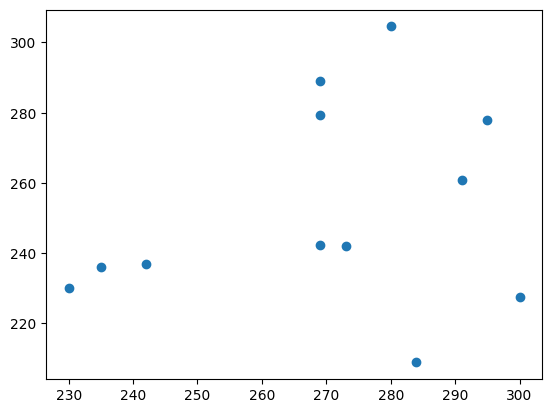

In [ ]:
conjunto_data = y_test[y_test.index.get_level_values(1) == "ARACAJU"]
plt.scatter(conjunto_data["FLAG_INTERRUPCOES"], conjunto_data["y_p"])

### 3.2.5 - Aplicacao de um modelo por Estado

Dado a alta variabilidade do territorio Brasileiro é treinado um modelo por estado e verificado o resultado em relacao ao modelo geral para 2 estados brasileiros, RJ e SE.

In [ ]:
modeling_df = pd.read_excel(base_path + "/Ordens_servico/preprocess.xlsx", index_col=[0,	1])
# Le os conjuntos de teste da Energisa Sergipe
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_ENERGISA_SERGIPE.json", 'r') as f:
  test_set_json = json.load(f)
with open("/content/drive/MyDrive/Mestrado/Ordens_servico/Ordens_servico/CONJUNTOS_LIGHT.json", 'r') as f:
  test_set_json_light = json.load(f)

In [ ]:
test_set_json_light

NameError: ignored

In [ ]:
modeling_df

,,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",FLAG_LIT,MUN_MINIMUM_BOUND_RADIO,AREA,NUMERO_CONSUMIDORES_DO_CONJUNTO,FLAG_INTERRUPCOES,mes_1,mes_10,mes_11,mes_12,mes_2,mes_3,mes_4,mes_5,mes_6,mes_7,mes_8,mes_9,UF_AC,UF_AL,UF_AM,UF_BA,UF_CE,UF_DF,UF_ES,UF_GO,UF_MA,UF_MG,UF_MS,UF_MT,UF_PA,UF_PB,UF_PE,UF_PI,UF_PR,UF_RJ,UF_RN,UF_RO,UF_RR,UF_RS,UF_SC,UF_SE,UF_SP,UF_TO,Amazônia Legal_Não,Amazônia Legal_Sim,Semiárido_Não,Semiárido_Sim,veg_class_Atividades AgrÃ¡rias,veg_class_Campinarana Arborizada,veg_class_Campinarana Florestada,veg_class_Campinarana Gramineo-Lenhosa,veg_class_Estepe Gramineo-Lenhosa,veg_class_Estepe Parque,veg_class_Floresta OmbrÃ³fila/Floresta Estacional,veg_class_Floresta Estacional Decidual Montana,veg_class_Floresta Estacional Decidual Submontana,veg_class_Floresta Estacional Semidecidual Montana,veg_class_Floresta Estacional Semidecidual Submontana,veg_class_Floresta Estacional/FormaÃ§Ãµes Pioneiras,veg_class_Floresta OmbrÃ³fila Densa Aluvial,veg_class_Floresta OmbrÃ³fila Densa Montana,veg_class_Floresta OmbrÃ³fila Densa Submontana,veg_class_Floresta OmbrÃ³fila Densa Terras Baixas,veg_class_Floresta OmbrÃ³fila Densa/Floresta OmbrÃ³fila Mista,veg_class_Floresta OmbrÃ³fila Mista Montana,veg_class_Massa Dagua Continental,"veg_class_Massa Dagua Costeira - Mar Territorial, 12 milhas","veg_class_Massa Dagua Costeira - Zona EconÃ´mica Exclusiva, 200 milhas",veg_class_Savana Arborizada,veg_class_Savana EstÃ©pica/Floresta Estacional,veg_class_Savana Florestada,veg_class_Savana Gramineo-Lenhosa,veg_class_Savana Parque,veg_class_Savana-EstÃ©pica Arborizada,veg_class_Savana-EstÃ©pica Florestada,veg_class_Savana-EstÃ©pica Gramineo-Lenhosa,veg_class_Savana-EstÃ©pica Parque,veg_class_Savana/ Floresta Estacional,veg_class_Savana/Floresta OmbrÃ³fila,veg_class_Savana/Savana EstÃ©pica,veg_class_Savana/Savana EstÃ©pica/Floresta Estacional,veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Submontana,veg_class_VegetaÃ§Ã£o OmbrÃ³fila Aberta Terras Baixas,veg_class_VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Fluvial e/ou Lacustre,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Fluvio- marinha,veg_class_Ãreas das FormaÃ§Ãµes Pioneiras VegetaÃ§Ã£o com InfluÃªncia Marinha,VERAO,OUTONO,INVERNO,PRIMAVERA
year_month,DscConjUndConsumidoras,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
202201,ABAETETUBA I,0.132402,0.918321,0.722148,0.676471,0.691726,0.784314,0.943208,0.784946,0.213483,0.052747,0.112781,0.926557,0.864033,0.758919,0.771731,0.866432,0.906456,0.586889,0.322732,0.065566,0.184392,0.0,0.031920,0.001688,0.250336,518,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
202202,ABAETETUBA I,0.170326,0.913675,0.731259,0.722222,0.740888,0.827451,0.904589,0.709677,0.321529,0.160289,0.109261,0.923583,0.869268,0.798728,0.800020,0.882

In [ ]:
# Separe the base in train / test

# Utilizando um algoritmo linear sklearn - https://medium.com/datadenys/using-polynomial-linear-regression-for-nonlinear-data-with-python-scikit-8ccfc235edc9
label = "FLAG_INTERRUPCOES"

# Its a time series, so for prediction we have to order the data by date (we will include districty too)
modeling_df = modeling_df.sort_values(["year_month", "DscConjUndConsumidoras"])


# 1. Base de teste pronta RJ / 2022

# model_df = modeling_df[modeling_df.UF_RJ == 1]

# X = model_df.drop(columns=label)
# Y = model_df[label]

# X_train, y_train, X_text, y_test = train_test_split(test_size=0.3, random_stage=20)

# 2. Base de teste pronta com todos os Estados do Sergipe / 2022

model_df = modeling_df[(modeling_df.UF_SE == 1)]

# 3. Base de teste pronta com todos os Estados do Nordeste / 2022

# model_df = modeling_df[(modeling_df.UF_SE == 1) | (modeling_df.UF_BA == 1) | (modeling_df.UF_MA == 1) | (modeling_df.UF_PI == 1) | (modeling_df.UF_CE == 1) &
#                        (modeling_df.UF_RN == 1) | (modeling_df.UF_PB == 1) | (modeling_df.UF_PE == 1) | (modeling_df.UF_AL == 1)
#                        ]


# Divide the test and train data (Teste com ENERGISA)
# X = model_df.drop(columns=label)
# Y = model_df[label]
# X_train = X[~X.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# X_test = X[X.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# y_train = Y[~Y.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# y_test = Y[Y.index.get_level_values(1).isin(test_set_json['conjuntos'])]


# Divide the test and train data (Teste com LIGHT)
# X = model_df.drop(columns=label)
# Y = model_df[label]
# X_train = X[~X.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# X_test = X[X.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# y_train = Y[~Y.index.get_level_values(1).isin(test_set_json['conjuntos'])]
# y_test = Y[Y.index.get_level_values(1).isin(test_set_json['conjuntos'])]

model = LinearRegression(fit_intercept=True)
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
X_train.shape, X_test.shape

((120, 111), (648, 111))

In [ ]:
y_test = pd.DataFrame(y_test)
y_test["y_p"] = model.predict(X_test)

In [ ]:
y_test

FLAG_INTERRUPCOES     y_p
year_month DscConjUndConsumidoras                           
202101     ARACAJU                               172  234.75
           ATALAIA                               291  344.75
           CABRITA                               112  202.75
           CAJAÍBA                               106   76.25
           CARMÓPOLIS                             67  130.25
...                                              ...     ...
202212     SERIGY                                121  165.50
           SIMÃO DIAS                            188  175.25
           SÃO CRISTOVÃO                         124  111.00
           TAIÇOCA                               300  286.00
           URUBU                                 362  382.50

[648 rows x 2 columns]

Text(0.0, 1.0, 'Quantidade de casos de interrupções real vs. inferência modelo - nov-dez/2022 - Regressao linear')

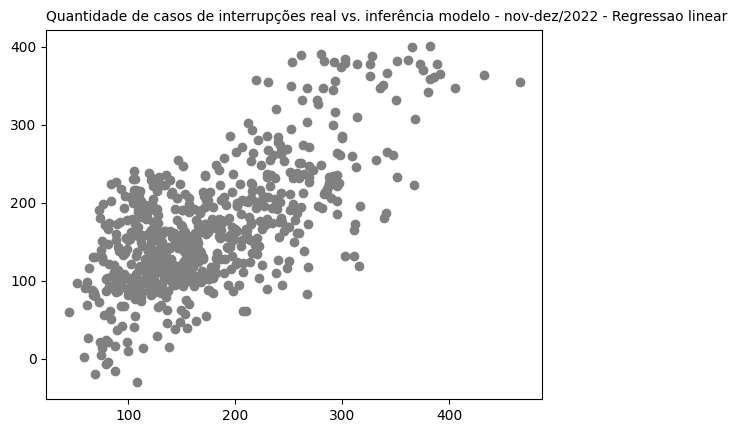

In [ ]:
fig, ax = plt.subplots()

ax.scatter(y_test[label], y_test["y_p"], color='gray')
ax.set_title("Quantidade de casos de interrupções real vs. inferência modelo - nov-dez/2022 - Regressao linear", loc='left',fontsize=10)

In [ ]:
# r2 score
r2_score(y_test[label], y_test["y_p"])

0.33402402915383855

In [ ]:
MAPE(y_test[label], y_test.y_p)

32.06531192572653

In [ ]:
hour = datetime.datetime.now().strftime("%Y_%m_%d_%H")

In [ ]:
# Verifica a importancia de cada variavel na previsao, o modelo parece estar sobre ajustado pois os resultados foram acima do esperado para
# o modelo de regressao linear

feat_import_dic = {}
# Get feature_name and importance in a dict, and show
for feat, importance in zip(model.feature_names_in_, model.coef_):
  feat_import_dic[feat] =  importance

# Salva o dicionario de features importance em um excel
feat_import_df = pd.DataFrame(data=feat_import_dic, index=[0]).T.reset_index()
feat_import_df.columns = ["Feat", "Coef"]
feat_import_df.to_excel(base_path + "/Ordens_servico/feat_imp_linear_model_test_train_state_SE_{}.xlsx".format(hour))

dict(sorted(feat_import_dic.items(), key=lambda item: item[1]))
# feat_import_dic

{'MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)': -372007640665580.94,
 'MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': -316087102752011.0,
 'MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)': -228905193047817.56,
 'MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)': -195326391804243.3,
 'MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': -180787858047465.0,
 'MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)': -97947086106172.12,
 'MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)': -84870330294293.25,
 'TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': -83379369781691.31,
 'MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)': -77212346594008.81,
 'MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': -72960661767675.72,
 'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': -46140511894960.21,
 'mes_8': -22399674812059.04,
 'mes_7': -20386314714262.15,
 'INVERNO': -19225897189749.242,
 'mes_6': -18651636144605.688,
 'OUTONO': -4721704067949.0625,
 'mes_3': -3704822030008.728,
 'mes_11': -2787206254679.2827,
 'mes_12': -2620595785934.5703

## 3.4- Aplicacao de Modelo de Regressão nao linear

Apos o teste com a aplicacao modelo linear, aplica um modelo nao linear para verificar a qualidade do ajuste. Para o primeiro teste sera utilizado um modelo de arvore de decisao. Para o caso de uma variavel enteira de resposta a arvore de decisao gera a media das n resultados opos ser realizada a subdiviao.

In [ ]:
from sklearn.tree import DecisionTreeRegressor

Pontos importantes na arvore de decisao:
- Verificar o funcao de erro.
- Verifica se tem alguma coluna com valores nulos.


In [ ]:
# Verfica se existe algum outlier no conjunto de dados. Se ha eh necessario realizar um tratamento para a retirada dos valores nulos para o modelo.
df.isnull().any().to_list()

In [ ]:
# Apply the next model (non-linear) - The linear model had a good result of r2, but is not feeting the problem very well, the MAPE is low
# We applie the Friedman RSME. - https://lup.lub.lu.se/luur/download?func=downloadFile&recordOId=8954429&fileOId=8954430
model = DecisionTreeRegressor(random_state=2, criterion="friedman_mse")

# Its a time series, so for prediction we have to order the data by date (we will include districty too)
modeling_df = modeling_df.sort_values(["year_month"])

X = modeling_df.drop(columns="FLAG_INTERRUPCOES")
y = df["FLAG_INTERRUPCOES"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=30, shuffle=False)

In [ ]:
model.fit(X_train, y_train)

In [ ]:
X_test

In [ ]:
X_test["y_pred"] = model.predict(X_test)
X_test["y_true"] = y_test

In [ ]:
X_test[["y_pred", "y_true"]]

# 4 - Simulacão

Realiza a simulação referente a previsao da quantidade de interrupções para casos futuros. Diferentemente da seção anterior em que é realizada a comparação com casos passados, observados.

Definições

In [ ]:
variaveis_meteor = [
    'MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)', 'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)', 'MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)', 'MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)','MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
      'MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)','MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)','MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)','MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)','MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)','MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)','MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)', 'MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)','MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
       'MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)','MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)','TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)'
]
variaveis_not_meteor = ['GEOCODIGO_MUNICIPIO',
       'NOME_MUNICIPIO', 'LONGITUDE', 'LATITUDE', 'CodMun', 'Mun', 'UF',
       'Pop estimada 2021', 'Faixa_pop', 'Região Metropolitana', 'Regiao',
       'Nome da Grande Região', 'Nome da Mesorregião', 'Nome da Microrregião',
       'Nome da Região Geográfica Imediata',
       'Município da Região Geográfica Imediata',
       'Nome da Região Geográfica Intermediária',
       'Município da Região Geográfica Intermediária',
       'Nome Concentração Urbana', 'Tipo Concentração Urbana',
       'Nome Arranjo Populacional', 'Hierarquia Urbana',
       'Hierarquia Urbana (principais categorias)', 'Nome da Região Rural',
       'Região rural (segundo classificação do núcleo)', 'Amazônia Legal',
       'Semiárido', 'Cidade-Região de São Paulo',
       'Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)',
       'Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)',
       'Produto Interno Bruto, \na preços correntes\n(R$ 1.000)',
       'Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)',
       'FLAG_LIT', 'IdeConjUndConsumidoras', 'ds_munic', 'ds_uf',
       'MUN_MINIMUM_BOUND_RADIO', 'AREA', 'MUN_NUMBER_OF_BOUNDARYS',
       'veg_class', 'DscConjuntoUnidadeConsumidora',
       'NUMERO_CONSUMIDORES_DO_CONJUNTO', 'NUMERO_UNIDADES_CONSUMIDORAS',
       'FLAG_INTERRUPCOES', 'percent_tree_cover']

variaveis_meteor = dict.fromkeys(variaveis_meteor, 'mean')
variaveis_not_meteor = dict.fromkeys(variaveis_not_meteor, 'last')
d = {**variaveis_meteor, **variaveis_not_meteor}
d

{'MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': 'mean',
 'MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': 'mean',
 'MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)': 'mean',
 'MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)': 'mean',
 'MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)': 'mean',
 'MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)': 'mean',
 'MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': 'mean',
 'MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)': 'mean',
 'MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)': 'mean',
 'MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)': 'mean',
 'MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': 'mean',
 'MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': 'mean',
 'MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)': 'mean',
 'MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)': 'mean',
 'MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)': 'mean',
 'MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)': 'mean',
 'MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': 'mean',
 'MED_UMID

## 4.1 - Anos Anteriores

In [ ]:
# Leitura do conjunto de dados para o modelo
data_paths = list(dir_path.glob("Ordens_servico/base_2*"))

df = pd.concat([pd.read_excel(path, index_col=None) for path in data_paths])

In [ ]:
df

,Unnamed: 0,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover
0,0,2021,ABAETETUBA I,1,49.2,1009.025000,24.070833,34.3,27.650000,24.6,90.291667,77.0,12.9,1.316667,13.592308,1007.455864,23.356173,32.944444,26.510031,23.596429,84.060185,55.333333,8.140000,0.688426,353.4,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35348.0,14755,278,56.898305
1,1,2021,ABAETETUBA I,2,74.6,1010.075000,24.058333,34.5,28.158333,24.8,94.250000,83.0,11.7,0.900000,22.635714,1007.926637,23.476935,31.592857,25.956696,23.410714,87.183036,60.571429,7.921429,0.551488,633.8,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35730.0,52755,602,56.898305
2,2,2021,ABAETETUBA I,5,92.0,1010.612500,24.495833,34.7,28.441667,24.8,98.041667,79.0,13.9,1.254167,16.064516,1009.366532,23.997850,32.570968,26.678226,23.696774,86.889785,56.483871,7.432258,0.700806,498.0,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentraçã

Criando o conjunto de dados de 2023

In [ ]:
# Esta sendo agrupado 3 meses de dados do conjunto. Porem caso nao haja dado para o ano anterior para contruir o lag, o conjunto sera retirado na inferencia.
df_fut = df[df.year.isin([2020, 2021, 2022])]
df_fut = df_fut.sort_values(by='year').groupby(['DscConjUndConsumidoras', 'mes']).agg(d).reset_index()
df_fut['year'] = 2023
# Input null for interruptions
df_fut["FLAG_INTERRUPCOES"] = np.nan
df_fut

,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover,year
0,ABAETETUBA I,1,51.800000,1010.157125,24.275000,34.466667,27.481944,24.700000,91.861111,77.666667,11.933333,1.148611,13.090769,1008.367835,23.388686,32.269259,26.202398,23.512143,85.517613,58.960573,7.758562,0.695466,374.600000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,None,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,38383.0,31801,NaN,56.898305,2023
1,ABAETETUBA I,2,73.200000,1010.240278,24.370833,34.666667,28.234722,25.166667,92.541667,81.666667,12.400000,1.166667,17.191708,1008.299311,23.535794,32.020484,26.218904,23.630213,86.034532,60.826355,7.662438,0.624560,487.733333,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,None,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,38346.0,34367,NaN,56.898305,2023
2,ABAETETUBA I,3,125.900000,1009.952084,24.510416,34.350000,27.549095,24.800000,93.889881,85.000000,7.000000,0.570833,24.910282,1008.361309,23.598380,31.803831,25.987186,23.836190,86.812063,63.012545,5.426316,0.385142,526.500000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste Para

In [ ]:
df_fut = df_fut[df.drop(columns=['Unnamed: 0']).columns]
df = df.append(df_fut)

<ipython-input-36-884f59be68fc>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df_fut)


Criando o conjunto de dados de 2024

In [ ]:
df_fut = df[df.year.isin([2021, 2022, 2023])]
df_fut = df_fut.sort_values(by='year').groupby(['DscConjUndConsumidoras', 'mes']).agg(d).reset_index()
df_fut['year'] = 2024
df_fut

,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover,year
0,ABAETETUBA I,1,46.933333,1010.005153,24.245833,34.555556,27.571759,24.666667,92.314815,78.222222,11.444444,1.155093,12.281026,1008.130340,23.442776,32.484568,26.219656,23.457302,85.779091,58.624851,7.730771,0.696624,344.266667,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,None,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,38383.0,31801,518.0,56.898305,2024
1,ABAETETUBA I,2,66.333333,1009.968982,24.395833,35.155556,28.414352,25.255556,92.680556,79.222222,12.050000,1.033333,16.556760,1007.998135,23.592219,32.334209,26.289193,23.586262,86.054601,59.906404,7.791933,0.588024,465.711111,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,None,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,38346.0,34367,393.0,56.898305,2024
2,ABAETETUBA I,3,93.950000,1009.451042,24.567708,34.275000,27.502808,24.750000,94.382441,83.500000,5.550000,0.377083,20.984173,1008.103288,23.820062,31.874496,26.069107,23.776159,87.884263,63.296595,4.763158,0.284238,527.650000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,None,1 - Norte,Norte,Nordeste P

In [ ]:
df_fut = df_fut[df.drop(columns=['Unnamed: 0']).columns]
df = df.append(df_fut)

<ipython-input-38-884f59be68fc>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df_fut)


In [ ]:
df

,Unnamed: 0,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover
0,0.0,2021,ABAETETUBA I,1,49.20,1009.025000,24.070833,34.300,27.650000,24.60,90.291667,77.00,12.9,1.316667,13.592308,1007.455864,23.356173,32.944444,26.510031,23.596429,84.060185,55.333333,8.140000,0.688426,353.400000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35348.0,14755,278.0,56.898305
1,1.0,2021,ABAETETUBA I,2,74.60,1010.075000,24.058333,34.500,28.158333,24.80,94.250000,83.00,11.7,0.900000,22.635714,1007.926637,23.476935,31.592857,25.956696,23.410714,87.183036,60.571429,7.921429,0.551488,633.800000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35730.0,52755,602.0,56.898305
2,2.0,2021,ABAETETUBA I,5,92.00,1010.612500,24.495833,34.700,28.441667,24.80,98.041667,79.00,13.9,1.254167,16.064516,1009.366532,23.997850,32.570968,26.678226,23.696774,86.889785,56.483871,7.432258,0.700806,498.000000,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém

In [ ]:
# Preprocess
df = treat_outliers(df)
df = fill_null(df)
df = add_clusters_info(df)
df = select_features(df, index, cols)
df = one_hot_econding(df)
df = drop_duplic(df)
df = transform_month(df)
df = fill_null_mean_tratment(df)
df = time_shift(df)
df = year_seasons(df)
df = norm_data(df)

quantidade registros extremos retirados
0
UF
1
Amazônia Legal
2
Semiárido
3
veg_class
4
labels


### 4.1.1 - Energisa Sergipe

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='energisa_se', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 88750 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2773 27


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202301     ARACAJU                        242.505659  237.593750
           ATALAIA                        242.505659  279.765625
           CABRITA                        242.505659  175.390625
           CAJAÍBA                        242.505659  179.953125
           CARMÓPOLIS                     242.505659  150.671875
...                                              ...         ...
202312     SERIGY                         242.505659  162.187500
           SIMÃO DIAS                     242.505659  181.250000
           SÃO CRISTOVÃO                  242.505659  162.296875
           TAIÇOCA                        242.505659  253.906250
           URUBU                          242.505659  302.718750

[324 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

In [ ]:
# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='energisa_se', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 119625 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2787 27


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202401     ARACAJU                             242.0  246.789904
           ATALAIA                             303.0  291.940254
           CABRITA                             119.0  195.226347
           CAJAÍBA                             148.0  188.035451
           CARMÓPOLIS                           75.0  173.977669
...                                              ...         ...
202412     SERIGY                              121.0  156.469912
           SIMÃO DIAS                          188.0  180.502276
           SÃO CRISTOVÃO                       124.0  158.482643
           TAIÇOCA                             300.0  227.858521
           URUBU                               362.0  293.247006

[324 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

year_month
202001    4339.000000
202002    4134.000000
202003    5083.000000
202004    4266.000000
202005    4346.000000
202006    4805.000000
202007    4794.000000
202008    4540.000000
202009    4019.000000
202010    4231.000000
202011    4089.000000
202012    3862.000000
202101    3728.000000
202102    3140.000000
202103    3752.000000
202104    4232.000000
202105    4827.000000
202106    4110.000000
202107    4729.000000
202108    4660.000000
202109    4059.000000
202110    4298.000000
202111    5589.000000
202112    5532.000000
202201    4476.000000
202202    3881.000000
202203    5055.000000
202204    4651.000000
202205    5548.000000
202206    5446.000000
202207    5305.000000
202208    5444.000000
202209    4925.000000
202210    4662.000000
202211    5493.000000
202212    5479.000000
202301    5243.328125
202302    4959.921875
202303    5395.281250
202304    5278.109375
202305    5503.406250
202306    5657.359375
202307    5665.031250
202308    5585.578125
202309    5287.468750

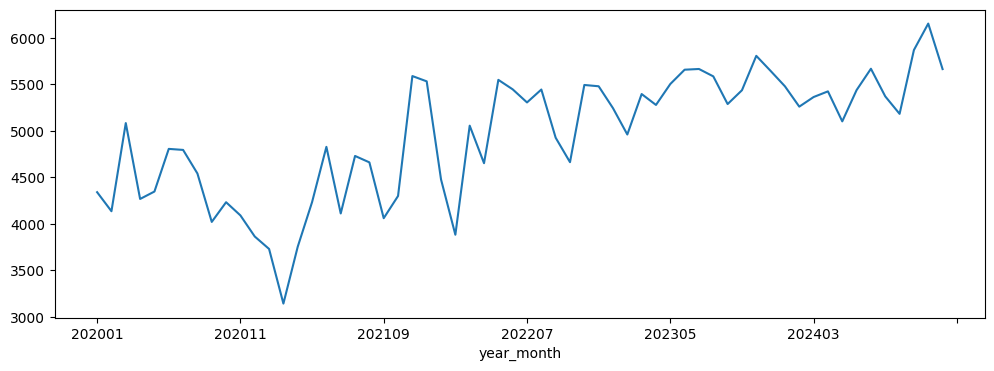

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json['conjuntos'])]
acc_se_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_se_df.plot()
acc_se_df

### 4.1.2 - Cemig

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='cemig', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 79412 3478
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2507 293


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202301     Abadia dos Dourados            242.505659  186.425849
           Abaeté 2                       242.505659  199.727311
           Aimorés                        242.505659  197.834323
           Alfenas 1                      242.505659  395.093324
           Almenara                       242.505659  200.427741
...                                              ...         ...
202312     Varginha 1                     242.505659  510.028493
           Varzea da Palma 1              242.505659  246.729162
           Vazante 1                      242.505659  329.586174
           Viçosa                         242.505659  331.204503
           Águas Formosas                 242.505659  317.721864

[3478 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

In [ ]:
# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='cemig', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 107155 3456
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2521 292


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202401     Abadia dos Dourados                 145.0  172.416735
           Abaeté 2                            182.0  229.796507
           Aimorés                             115.0  226.741918
           Alfenas 1                           589.0  325.764086
           Almenara                            145.0  214.978591
...                                              ...         ...
202412     Varginha 1                          563.0  616.619838
           Varzea da Palma 1                   264.0  228.705825
           Vazante 1                           452.0  274.829362
           Viçosa                              400.0  314.087103
           Águas Formosas                      384.0  299.471045

[3456 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

year_month
202001     97630.000000
202002     81290.000000
202003     72140.000000
202004     61336.000000
202005     58827.000000
202006     53282.000000
202007     49653.000000
202008     50216.000000
202009     55316.000000
202010     90729.000000
202011     79625.000000
202012     99065.000000
202101     89451.000000
202102     85614.000000
202103     78625.000000
202104     61181.000000
202105     56823.000000
202106     52412.000000
202107     51813.000000
202108     53091.000000
202109     62311.000000
202110     96304.000000
202111     83820.000000
202112     85484.000000
202201    100708.000000
202202     92018.000000
202203     72310.000000
202204     69576.000000
202205     69861.000000
202206     58140.000000
202207     59926.000000
202208     63022.000000
202209     72650.000000
202210     92653.000000
202211    107796.000000
202212    103850.000000
202301     88650.815575
202302     85508.593531
202303     74198.899766
202304     69399.057835
202305     69539.895362
20230

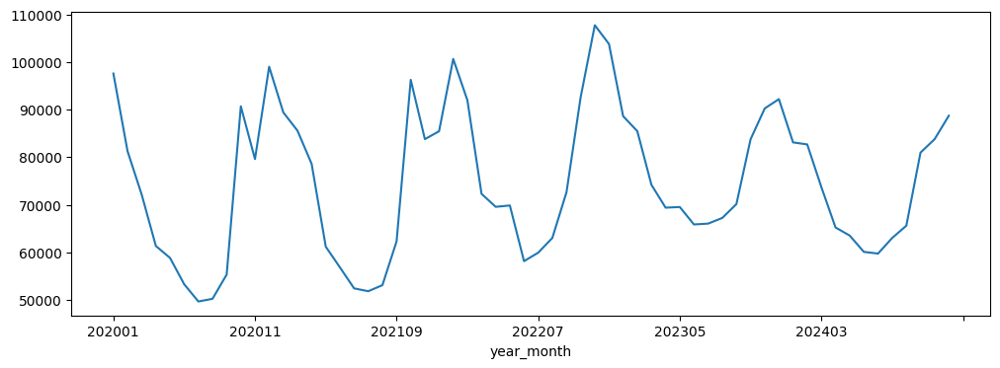

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])]
acc_cemig_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_cemig_df.plot()
acc_cemig_df

### 4.1.3 - Copel

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='copel', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 85358 1520
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2671 129


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202301     Afonso Pena                    242.505659  177.908613
           Almirante Tamandare            242.505659  246.898967
           Alto Parana                    242.505659  321.782933
           Alto da Gloria                 242.505659  177.479190
           Altônia                        242.505659  268.192466
...                                              ...         ...
202312     Uniao da Vitoria               242.505659  382.516836
           Uvaranas                       242.505659  195.708374
           Vera Cruz                      242.505659  363.005521
           Vila Yolanda                   242.505659  211.938103
           Xaxim                          242.505659  191.933920

[1520 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

In [ ]:
# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='copel', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 115063 1494
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2685 129


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                               
202401     Afonso Pena                          86.0  222.822936
           Almirante Tamandare                 275.0  231.675633
           Alto Parana                         447.0  274.294139
           Alto da Gloria                       94.0  216.920671
           Altônia                             287.0  280.954767
...                                              ...         ...
202412     Uniao da Vitoria                    534.0  327.638539
           Uvaranas                            100.0  253.039869
           Vera Cruz                           470.0  337.095713
           Vila Yolanda                        158.0  248.324776
           Xaxim                               113.0  231.094452

[1494 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

year_month
202001    44963.000000
202002    37064.000000
202003    32440.000000
202004    29213.000000
202005    31363.000000
202006    38091.000000
202007    42119.000000
202008    37908.000000
202009    39236.000000
202010    52953.000000
202011    44545.000000
202012    56354.000000
202101    49781.000000
202102    35875.000000
202103    43548.000000
202104    25665.000000
202105    39546.000000
202106    30190.000000
202107    27607.000000
202108    29026.000000
202109    40054.000000
202110    75527.000000
202111    47858.000000
202112    43395.000000
202201    48146.000000
202202    37345.000000
202203    51808.000000
202204    44518.000000
202205    32899.000000
202206    29144.000000
202207    28581.000000
202208    35498.000000
202209    36870.000000
202210    57514.000000
202211    37239.000000
202212    43624.000000
202301    39072.911339
202302    34822.422570
202303    39699.101250
202304    35657.900480
202305    32448.833599
202306    31708.327492
202307    31031.908875


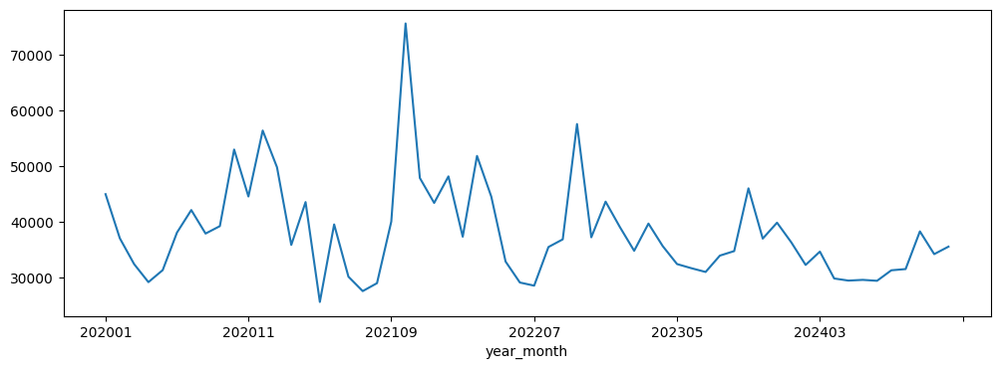

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])]
acc_copel_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_copel_df.plot()
acc_copel_df

### 4.1.4 - CPFL

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='cpfl', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 83636 2103
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2622 178


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                                
202301     Agudos 1                        242.505659  233.436048
           Altair 1                        242.505659  245.973493
           Altinópolis 1                   242.505659  184.075870
           Americana 1                     242.505659  171.257789
           Americana 2-Campo Verde         242.505659  165.420932
...                                               ...         ...
202312     U.IBITINGA AES                  242.505659  180.194440
           VALPARAISO CTEEP                242.505659  169.101309
           Valinhos 1                      242.505659  205.493829
           Valinhos 2-Figueira             242.505659  189.697218
           Viradouro 1                     242.505659  151.389563

[2103 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

In [ ]:
# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='cpfl', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

Qtd de Registros de Treino Qtd de Registros de Teste 112781 2054
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2636 178


FLAG_INTERRUPCOES         y_p
year_month DscConjUndConsumidoras                                
202401     Agudos 1                             239.0  202.690549
           Altair 1                             229.0  236.947023
           Altinópolis 1                        141.0  175.306445
           Americana 1                          126.0  175.793895
           Americana 2-Campo Verde              136.0  153.569687
...                                               ...         ...
202412     U.IBITINGA AES                       161.0  151.991817
           VALPARAISO CTEEP                      96.0  175.725445
           Valinhos 1                           160.0  214.705781
           Valinhos 2-Figueira                  142.0  193.079625
           Viradouro 1                           55.0  171.909232

[2054 rows x 2 columns]

In [ ]:
# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

year_month
202001    30431.000000
202002    26204.000000
202003    21133.000000
202004    16810.000000
202005    19262.000000
202006    20874.000000
202007    17858.000000
202008    19745.000000
202009    21928.000000
202010    31045.000000
202011    29808.000000
202012    34100.000000
202101    28658.000000
202102    22921.000000
202103    21593.000000
202104    17629.000000
202105    18899.000000
202106    19214.000000
202107    20154.000000
202108    22375.000000
202109    29992.000000
202110    44373.000000
202111    25168.000000
202112    26792.000000
202201    31360.000000
202202    45289.000000
202203    26406.000000
202204    21317.000000
202205    21880.000000
202206    20150.000000
202207    19695.000000
202208    27086.000000
202209    29258.000000
202210    33324.000000
202211    28900.000000
202212    29976.000000
202301    35913.346208
202302    42007.136521
202303    32909.129990
202304    29887.169069
202305    29517.472592
202306    29411.496155
202307    28093.480525


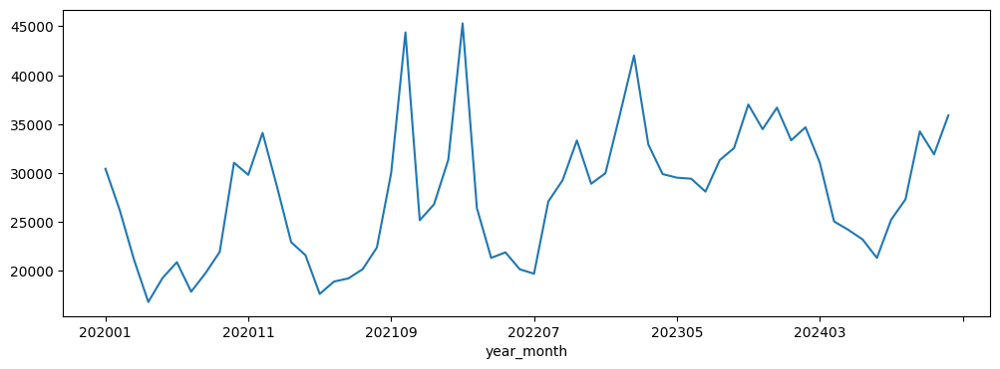

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])]
acc_cpfl_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_cpfl_df.plot()
acc_cpfl_df

### 4.1.5 - Persistencia do Resultado

Une todos os resultados das simulacoes com as distribuidoras e persiste

In [ ]:
utl_sim = pd.DataFrame({'energisa_sergipe': acc_se_df, 'cemig': acc_cemig_df, 'copel': acc_copel_df, 'cpfl': acc_cpfl_df})
utl_sim.to_excel((base_path + "Ordens_servico/sim_result.xlsx"))

Apos a persistencia realiza o plot do resultado final (O plot realiza a leitura novamente dos dados caso a seção seja fechada e reaberta)

In [ ]:
utl_sim = pd.read_excel(base_path + "Ordens_servico/sim_result.xlsx")
utl_sim.year_month = utl_sim.year_month.astype('str')
utl_sim = utl_sim.set_index("year_month")
# transform index to datetime
utl_sim.index = pd.to_datetime(utl_sim.index, format='%Y%m')

In [ ]:
utl_sim.index

DatetimeIndex(['2020-01-01', '2020-02-01', '2020-03-01', '2020-04-01',
               '2020-05-01', '2020-06-01', '2020-07-01', '2020-08-01',
               '2020-09-01', '2020-10-01', '2020-11-01', '2020-12-01',
               '2021-01-01', '2021-02-01', '2021-03-01', '2021-04-01',
               '2021-05-01', '2021-06-01', '2021-07-01', '2021-08-01',
               '2021-09-01', '2021-10-01', '2021-11-01', '2021-12-01',
               '2022-01-01', '2022-02-01', '2022-03-01', '2022-04-01',
               '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01',
               '2022-09-01', '2022-10-01', '2022-11-01', '2022-12-01',
               '2023-01-01', '2023-02-01', '2023-03-01', '2023-04-01',
               '2023-05-01', '2023-06-01', '2023-07-01', '2023-08-01',
               '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01',
               '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01',
               '2024-05-01', '2024-06-01', '2024-07-01', '2024-08-01',
      

In [ ]:
pd.to_datetime('202212', format='%Y%m').date()

datetime.date(2022, 12, 1)

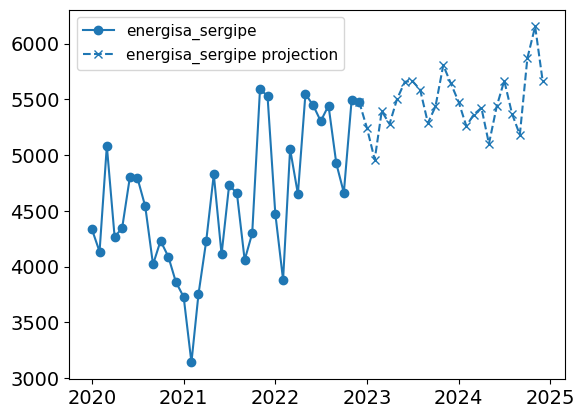

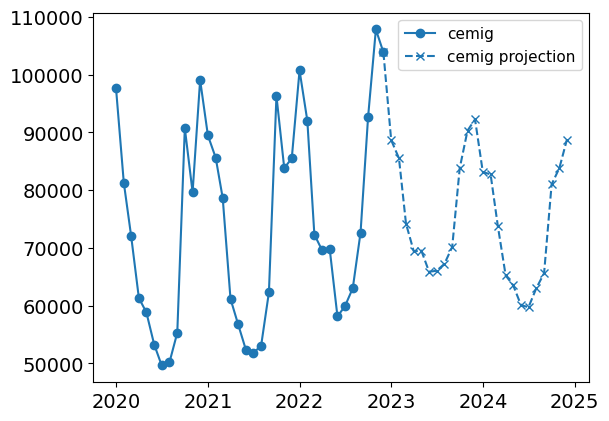

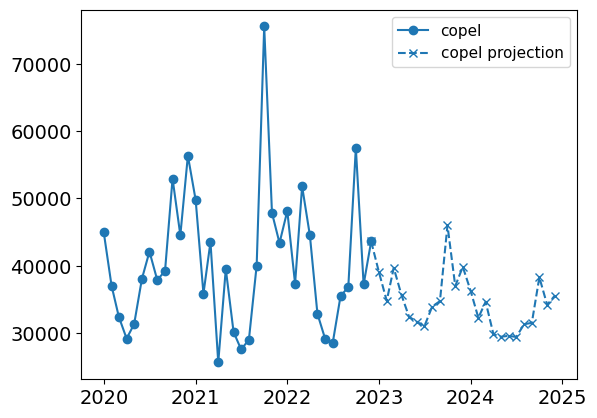

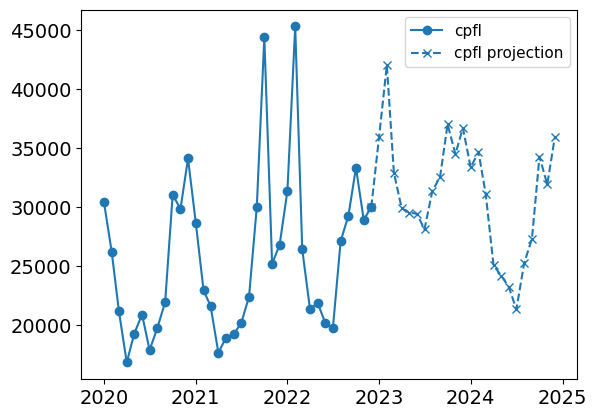

In [ ]:
from cycler import cycler
custom_marker_cycler = (cycler(marker=['o', 'x', 's', 'P']))

for idx, column_name in enumerate(utl_sim.columns):

  fig, ax = plt.subplots()

  ax.set_prop_cycle(custom_marker_cycler) # setting the cycler for the current figure

  # Plot the historic
  ax.plot(utl_sim[utl_sim[column_name].index <= pd.to_datetime('202212', format='%Y%m')][column_name], label=column_name)

  # create a new table equal to the utl_sim, chaging the name of the columns
  proj_df = utl_sim.rename(columns={column_name: column_name + " projection"})
  proj_column_name = column_name + " projection"

  # Plot the projection
  ax.plot(proj_df[proj_df[proj_column_name].index >= pd.to_datetime('202212', format='%Y%m')][proj_column_name], label=proj_column_name, linestyle='dashed')

  # ax.tick_params(axis='x', labelrotation = 90)
  # ax.set_xlabel('Date', fontsize = 12)
  # ax.set_ylabel('Number of outages', fontsize = 12)
  # Comment this part to set the figures title on inkspace
  ax.set_xlabel('', fontsize = 12)
  ax.set_ylabel('', fontsize = 12)

  for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(14)

  ax.legend(ncol=1, fontsize=11)

  # Save
  plt.savefig(base_path + "Ordens_servico/output/simulation_{}.svg".format(idx), format='svg')

  plt.show()

## 4.2 - El Nino

No ano de 1891, o senhor Dr. Luiz Carranza, presidente da sociedade geográfica de Lima, no Peru, contribuiu com um artigo para um boletim daquela Sociedade, chamando a atenção para o fato de que uma contra-corrente fluindo do norte para o sul foi observada entre Paita e Pacasmoyo.

Os marinheiros de Paita, que frequentemente navegavam pela costa em pequenas embarcações, tanto para o norte, quanto para o sul, apelidaram esta contra-corrente de El-nino (o Menino Jesus), porque ela era observada logo após as comemorações de Natal.

Dessa, forma, visando simular o el nino no Brasil, são projetos os meses de novembro, dezembro, janeiro e fevereiro. Levando em consideração, para os estados do norte e nordeste uma diminuição no regime de chuvas de 50 mm. E para os estados do Sul e Sudeste um regime de chuvas na faixa de 450 mm.

In [ ]:
# Leitura do conjunto de dados para o modelo
data_paths = list(dir_path.glob("Ordens_servico/base_2*"))

df = pd.concat([pd.read_excel(path, index_col=None) for path in data_paths])
# drop additional column
df = df.drop(columns='Unnamed: 0')

In [ ]:
df

,year,DscConjUndConsumidoras,mes,"MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MAX_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MAX_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MAX_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MAX_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MAX_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MAX_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MAX_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MAX_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",MED_PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),MED_TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"MED_TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","MED_TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","MED_UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","MED_UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","MED_VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","MED_VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)","TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",GEOCODIGO_MUNICIPIO,NOME_MUNICIPIO,LONGITUDE,LATITUDE,CodMun,Mun,UF,Pop estimada 2021,Faixa_pop,Região Metropolitana,Regiao,Nome da Grande Região,Nome da Mesorregião,Nome da Microrregião,Nome da Região Geográfica Imediata,Município da Região Geográfica Imediata,Nome da Região Geográfica Intermediária,Município da Região Geográfica Intermediária,Nome Concentração Urbana,Tipo Concentração Urbana,Nome Arranjo Populacional,Hierarquia Urbana,Hierarquia Urbana (principais categorias),Nome da Região Rural,Região rural (segundo classificação do núcleo),Amazônia Legal,Semiárido,Cidade-Região de São Paulo,"Valor adicionado bruto total, \na preços correntes\n(R$ 1.000)","Impostos, líquidos de subsídios, sobre produtos, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto, \na preços correntes\n(R$ 1.000)","Produto Interno Bruto per capita, \na preços correntes\n(R$ 1,00)",FLAG_LIT,IdeConjUndConsumidoras,ds_munic,ds_uf,MUN_MINIMUM_BOUND_RADIO,AREA,MUN_NUMBER_OF_BOUNDARYS,veg_class,DscConjuntoUnidadeConsumidora,NUMERO_CONSUMIDORES_DO_CONJUNTO,NUMERO_UNIDADES_CONSUMIDORAS,FLAG_INTERRUPCOES,percent_tree_cover
0,2021,ABAETETUBA I,1,49.2,1009.025000,24.070833,34.3,27.650000,24.6,90.291667,77.0,12.9,1.316667,13.592308,1007.455864,23.356173,32.944444,26.510031,23.596429,84.060185,55.333333,8.140000,0.688426,353.4,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35348.0,14755,278,56.898305
1,2021,ABAETETUBA I,2,74.6,1010.075000,24.058333,34.5,28.158333,24.8,94.250000,83.0,11.7,0.900000,22.635714,1007.926637,23.476935,31.592857,25.956696,23.410714,87.183036,60.571429,7.921429,0.551488,633.8,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Centro Sub-regional B,Centro Sub-regional,Região Rural da Metrópole de Belém,Região Rural de Metrópole,Sim,Não,Não,1521203.711,135372.697,1656576.408,10413.48,0.0,15459,ABAETETUBA,PA,0.201296,0.065269,56,VegetaÃ§Ã£o SecundÃ¡ria e Atividades AgrÃ¡rias,ABAETETUBA I,35730.0,52755,602,56.898305
2,2021,ABAETETUBA I,5,92.0,1010.612500,24.495833,34.7,28.441667,24.8,98.041667,79.0,13.9,1.254167,16.064516,1009.366532,23.997850,32.570968,26.678226,23.696774,86.889785,56.483871,7.432258,0.700806,498.0,1500107.0,ABAETETUBA,-48.884404,-1.723470,1500107.0,Abaetetuba,PA,160439.0,6 - 100001 até 500000,NaN,1 - Norte,Norte,Nordeste Paraense,Cametá,Abaetetuba,Polo,Belém,do Entorno,Abaetetuba,Média concentração urbana,NaN,Cent

Modifica o conjunto de dados de 2023 e 2024.

Em 2023 e 2024  pega o valor médio dos útlimos 3 anos de precipitação e, para a previsão,acrescenta 300 mm nas distribuidoras:

- CPFL;
- Copel.

E retira 50 mm de precipitação das distribuidoras:
- Energisa Sergipe;
- Cemig.

Atributos Referentes a precipitação:

- MAX_PRECIPITACAO TOTAL, DIARIO (AUT)(mm);
- TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm);
- TOTAL, DIARIO (AUT)(mm)	MED_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)

<Axes: >

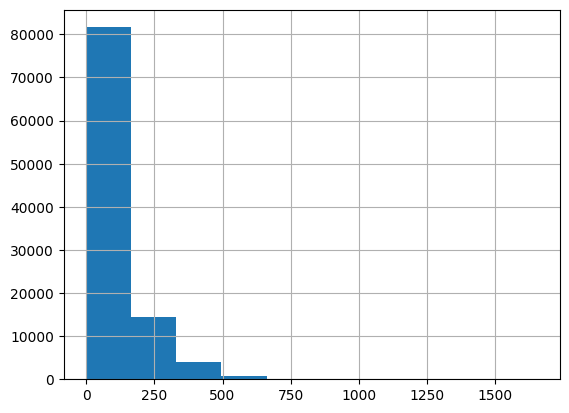

In [ ]:
df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"].hist()

In [ ]:
# Estao sendo agrupados 3 meses de dados do conjunto. Porem caso nao haja dado para o ano anterior para contruir o lag, o conjunto sera retirado na inferencia.
# 2023 data
df_fut = df[df.year.isin([2020, 2021, 2022])]
df_fut = df_fut.sort_values(by='year').groupby(['DscConjUndConsumidoras', 'mes']).agg(d).reset_index()
df_fut['year'] = 2023
# Input null for interruptions
df_fut["FLAG_INTERRUPCOES"] = np.nan
df_fut
df = df.append(df_fut)

# 2024 data
df_fut = df[df.year.isin([2021, 2022, 2023])]
df_fut = df_fut.sort_values(by='year').groupby(['DscConjUndConsumidoras', 'mes']).agg(d).reset_index()
df_fut['year'] = 2024
df_fut
df = df.append(df_fut)

<ipython-input-85-14512655138f>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df_fut)
<ipython-input-85-14512655138f>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(df_fut)


In [ ]:
df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"] = np.where(
    (df.year.isin([2023, 2024])) & (df.mes.isin([11, 12, 1, 2])) & (df.DscConjUndConsumidoras.isin( test_set_json["conjuntos"] + test_set_json_cemig["conjuntos"] )) ,
    df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"] - 50,
    df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"]
)

In [ ]:
# Forca a precipitacao dos meses de nov, dez, jan e fev de 2023 e 2024, para 450 mm, para o sul e São paulo. (Copel - CPFL)
df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"] = np.where(
    (df.year.isin([2023, 2024])) & (df.mes.isin([11, 12, 1, 2])) & (df.DscConjUndConsumidoras.isin( test_set_json_copel["conjuntos"] + test_set_json_cpfl["conjuntos"] )) ,
    450,
    df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"]
)
# Forca a precipitacao dos meses de nov, dez, jan e fev de 2023 e 2024, para -50 mm, para o sudeste e nordeste (cemig - energisa se)
df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"] = np.where(
    (df.year.isin([2023, 2024])) & (df.mes.isin([11, 12, 1, 2])) & (df.DscConjUndConsumidoras.isin( test_set_json["conjuntos"] + test_set_json_cemig["conjuntos"] )) ,
    df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"] - 50,
    df["TOTAL_PRECIPITACAO TOTAL, DIARIO (AUT)(mm)"]
)

Preprocessamento

In [ ]:
# Preprocess
df = treat_outliers(df)
df = fill_null(df)
df = add_clusters_info(df)
df = select_features(df, index, cols)
df = one_hot_econding(df)
df = drop_duplic(df)
df = transform_month(df)
df = fill_null_mean_tratment(df)
df = time_shift(df)
df = year_seasons(df)
df = norm_data(df)

quantidade registros extremos retirados
0
UF
1
Amazônia Legal
2
Semiárido
3
veg_class
4
labels


### 4.2.1 Energisa Sergise

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='energisa_se', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='energisa_se', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

Qtd de Registros de Treino Qtd de Registros de Teste 88750 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2773 27
Qtd de Registros de Treino Qtd de Registros de Teste 119625 324
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2787 27


year_month
202001    0.869148
202002    0.809538
202003    1.085490
202004    0.847921
202005    0.871183
202006    1.004653
202007    1.001454
202008    0.927595
202009    0.776098
202010    0.837744
202011    0.796452
202012    0.730445
202101    0.691480
202102    0.535039
202103    0.698459
202104    0.838034
202105    1.011050
202106    0.802559
202107    0.982553
202108    0.962489
202109    0.787729
202110    0.857226
202111    1.232626
202112    1.216051
202201    0.908985
202202    0.735970
202203    1.077348
202204    0.959872
202205    1.220704
202206    1.191044
202207    1.150044
202208    1.190462
202209    1.039546
202210    0.963071
202211    1.204711
202212    1.200640
202301    1.076180
202302    0.997963
202303    1.177502
202304    1.148369
202305    1.215908
202306    1.258533
202307    1.261890
202308    1.239494
202309    1.150475
202310    1.192688
202311    1.245918
202312    1.196873
202401    1.145985
202402    1.088676
202403    1.169235
202404    1.193394
2

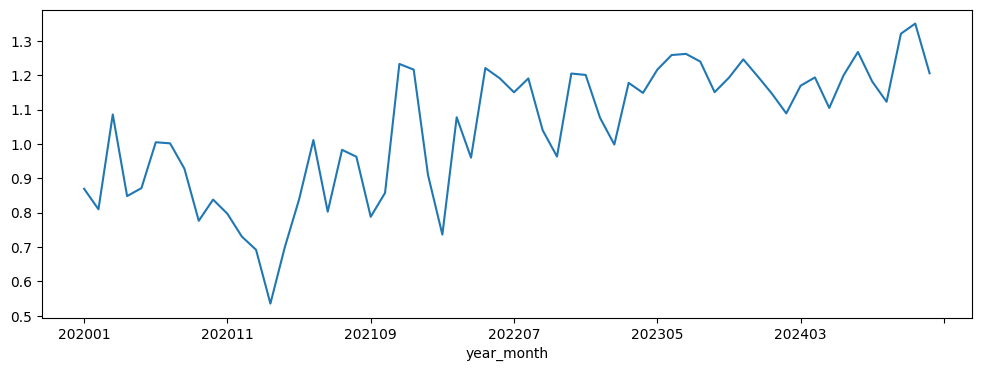

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json['conjuntos'])]
acc_nino_se_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_nino_se_df.plot()
acc_nino_se_df

<Axes: xlabel='year_month'>

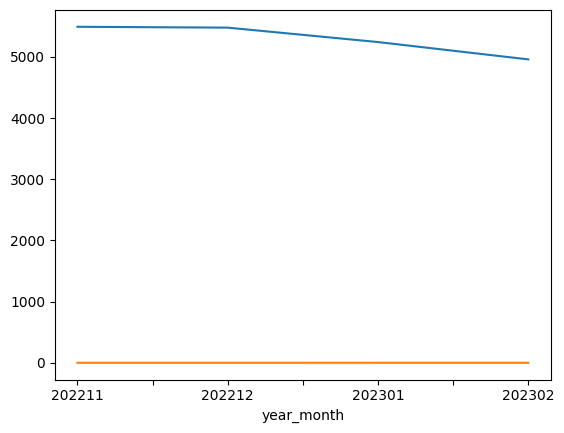

In [ ]:
# Plot simulacao El nino vs. periodo normal
# period_el_nino = [202211, 202212, 202301, 202302, 202311, 202312, 202401, 202402, 202411, 202412]
period_el_nino = [202211, 202212, 202301, 202302]

acc_se_df[acc_se_df.index.astype('int').isin(period_el_nino)].plot()
acc_nino_se_df[acc_nino_se_df.index.astype('int').isin(period_el_nino)].plot()

### 4.2.2 - Cemig

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='cemig', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='cemig', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

Qtd de Registros de Treino Qtd de Registros de Teste 79412 3478
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2507 293
Qtd de Registros de Treino Qtd de Registros de Teste 107155 3456
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2521 292


year_month
202001    24.143646
202002    19.435883
202003    16.775225
202004    13.720849
202005    13.034894
202006    11.437046
202007    10.396336
202008    10.545507
202009    11.941262
202010    22.166037
202011    18.980808
202012    24.589997
202101    21.808956
202102    20.664147
202103    18.660948
202104    13.588543
202105    12.394010
202106    11.227682
202107    10.995347
202108    11.381506
202109    13.975284
202110    23.758069
202111    20.157022
202112    20.640884
202201    25.067752
202202    22.555394
202203    16.795580
202204    16.058738
202205    16.127072
202206    12.864205
202207    13.296307
202208    14.138412
202209    16.908985
202210    22.710962
202211    27.128817
202212    26.010468
202301    20.941422
202302    20.022378
202303    17.324525
202304    15.994378
202305    16.011576
202306    14.907543
202307    14.965106
202308    15.335222
202309    16.174165
202310    20.132119
202311    21.552728
202312    21.974435
202401    19.425461
202402   

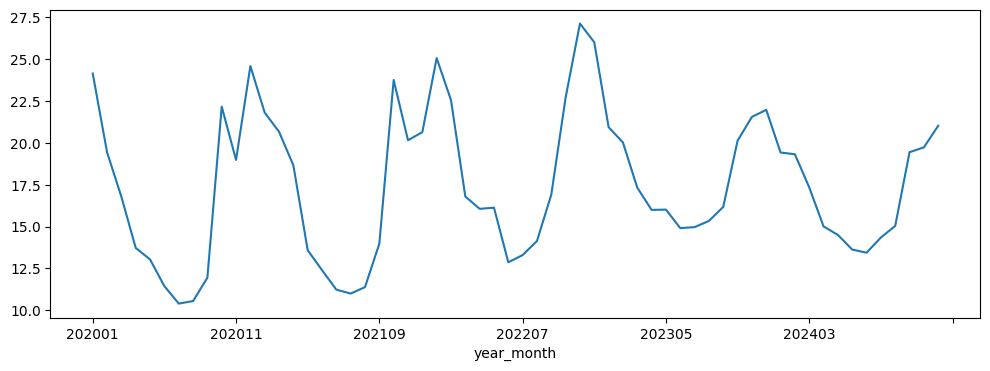

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_cemig['conjuntos'])]
acc_nino_cemig_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_nino_cemig_df.plot()
acc_nino_cemig_df

<Axes: xlabel='year_month'>

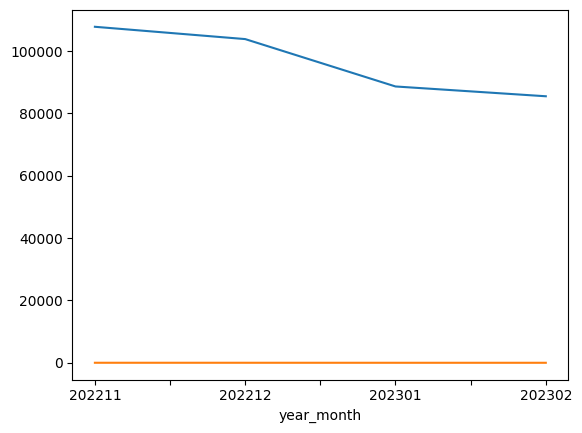

In [ ]:
# Plot simulacao El nino vs. periodo normal
# period_el_nino = [202211, 202212, 202301, 202302, 202311, 202312, 202401, 202402, 202411, 202412]
period_el_nino = [202211, 202212, 202301, 202302]

acc_cemig_df[acc_cemig_df.index.astype('int').isin(period_el_nino)].plot()
acc_nino_cemig_df[acc_nino_cemig_df.index.astype('int').isin(period_el_nino)].plot()

### 4.2.3 - Copel

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='copel', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='copel', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

Qtd de Registros de Treino Qtd de Registros de Teste 85358 1520
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2671 129
Qtd de Registros de Treino Qtd de Registros de Teste 115063 1494
Qtd de Conjuntos de Treino Qtd de Conjuntos de Teste 2685 129


year_month
202001    11.257051
202002     8.989241
202003     7.688281
202004     6.793545
202005     7.346031
202006     9.244257
202007    10.430067
202008     9.234661
202009     9.606281
202010    13.609479
202011    11.164583
202012    14.554812
202101    12.672579
202102     8.701657
202103    10.889212
202104     5.761849
202105     9.667345
202106     7.034022
202107     6.282931
202108     6.681012
202109     9.844141
202110    20.188136
202111    12.186101
202112    10.844722
202201    12.124455
202202     9.100029
202203    13.232917
202204    11.127653
202205     7.879907
202206     6.817098
202207     6.609770
202208     8.577493
202209     9.063681
202210    15.008433
202211     9.156441
202212    11.013085
202301    10.673012
202302     9.687506
202303     9.622514
202304     8.466081
202305     7.543317
202306     7.326360
202307     7.133081
202308     7.991254
202309     8.209691
202310    11.460137
202311    10.325860
202312    11.076047
202401     9.861465
202402   

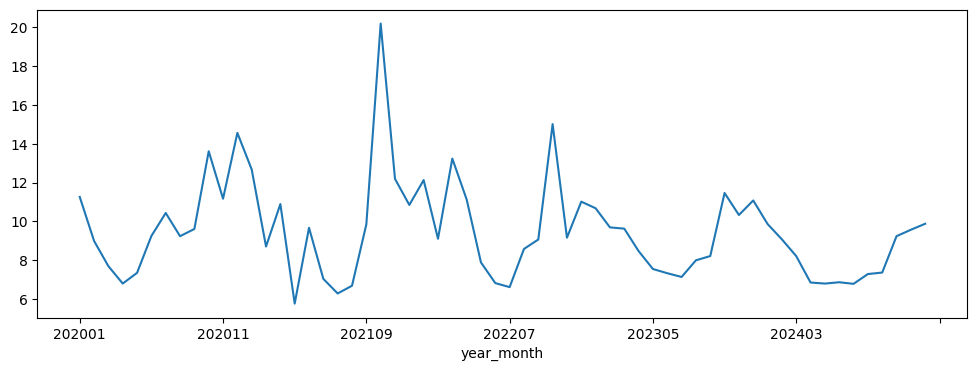

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_copel['conjuntos'])]
acc_nino_copel_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_nino_copel_df.plot()
acc_nino_copel_df

<Axes: xlabel='year_month'>

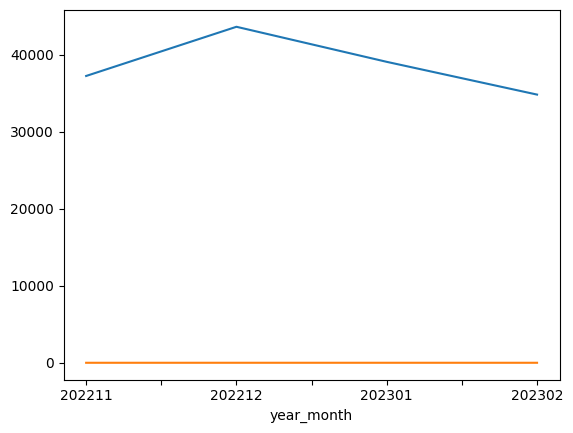

In [ ]:
# Plot simulacao El nino vs. periodo normal
# period_el_nino = [202211, 202212, 202301, 202302, 202311, 202312, 202401, 202402, 202411, 202412]
period_el_nino = [202211, 202212, 202301, 202302]

acc_copel_df[acc_copel_df.index.astype('int').isin(period_el_nino)].plot()
acc_nino_copel_df[acc_nino_copel_df.index.astype('int').isin(period_el_nino)].plot()

### 4.3.4 - CPFL

In [ ]:
# Previsao para 2023 - Retira o ano de 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df[~df.index.get_level_values(0).astype('str').str.contains("2024")], separe_type='cpfl', testyear='2023')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original, e faz o lag de 2024.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

df = time_shift(df)

# Previsao para 2024
model, X_train, X_test, y_train, y_test = sep_train_test(df, separe_type='cpfl', testyear='2024')
# X_test = X_test.dropna()
y_test = inference(X_test, y_test, simulation=True)
y_test

# Coloca as projecoes previstas como reais no conjunto original.
df = df.join(y_test["y_p"])
df["FLAG_INTERRUPCOES"] = np.where(
    df["y_p"].isnull(),
    df["FLAG_INTERRUPCOES"],
    df["y_p"]
)
df = df.drop(columns="y_p")

In [ ]:
# Plot da serie temporal do acumulado da quantidade de interrupcoes
plt.figure(figsize=(12, 4))

utl_df = df[df.index.get_level_values(1).isin(test_set_json_cpfl['conjuntos'])]
acc_nino_cpfl_df = utl_df.reset_index().groupby('year_month')["FLAG_INTERRUPCOES"].sum()
acc_nino_cpfl_df.plot()
acc_nino_cpfl_df

In [ ]:
acc_cpfl_df.index.astype('int').isin([202211, 202212, 202301, 202302, 202311, 202312, 202401, 202402, 202411, 202412])

In [ ]:
# Plot simulacao El nino vs. periodo normal
acc_cpfl_df.plot()
acc_nino_cpfl_df.plot()

In [ ]:
# Plot simulacao El nino vs. periodo normal
# period_el_nino = [202211, 202212, 202301, 202302, 202311, 202312, 202401, 202402, 202411, 202412]
period_el_nino = [202211, 202212, 202301, 202302]

acc_cpfl_df[acc_cpfl_df.index.astype('int').isin(period_el_nino)].plot()
acc_nino_cpfl_df[acc_nino_cpfl_df.index.astype('int').isin(period_el_nino)].plot()

### 4.2.5 - Persistencia do Resultado

In [ ]:
utl_sim = pd.DataFrame({'energisa_sergipe': acc_nino_se_df, 'cemig': acc_nino_cemig_df, 'copel': acc_nino_copel_df, 'cpfl': acc_nino_cpfl_df})
utl_sim.to_excel((base_path + "Ordens_servico/sim_result.xlsx"))